In [1]:
import json
import numpy as np
import pandas as pd
from pathlib import Path
import os
import sys
import warnings
from utils import *
import matplotlib.pyplot as plt
import seaborn as sns

warnings.simplefilter('ignore')

sys.path.append('../../utilities')
sys.path.append('../../models/grt123')
sys.path.append('../../models/grt123/training')
sys.path.append('../../models/grt123/preprocessing/')

# from layers import nms,iou
from summit_utils import SummitScan, xyz2irc
from evaluation import noduleCADEvaluation

workspace_path = Path(os.getcwd()).parent.parent


In [2]:
flavour = 'white_only'

# Scan Metadata

In [3]:

def set_is_actionable(row):
    if row['radiology_report_management_plan_final'] in ['3_MONTH_FOLLOW_UP_SCAN','URGENT_REFERRAL', 'ALWAYS_SCAN_AT_YEAR_1']:
        return 'Actonable'
    else:
        return 'Non-Actionable'

def set_smoking_pack_years_cats(df):
    df[df['smoking_pack_years'] < 0] = np.nan
    return pd.qcut(df['smoking_pack_years'], 3, labels=['Low (15-35)', 'Medium (35-50)', 'High (50+)'])

person_data = pd.read_csv(
    f'{workspace_path}/data/summit/data/person_data.csv',
    usecols=['LDCT_RADIOLOGY_REPORT_main_participant_id', 'lung_health_check_clinical_smoking_pack_years', 'ocd_DeprivationScore_IMDRank']
).rename(columns={
    'lung_health_check_clinical_smoking_pack_years':'smoking_pack_years',
    'ocd_DeprivationScore_IMDRank':'deprivation_score'
}).assign(
    smoking_pack_years_cats=lambda df: set_smoking_pack_years_cats(df),
    IMDRank_tertile=lambda df: pd.qcut(df['deprivation_score'], 3, labels=['Low', 'Medium', 'High']),
    IMDRank_quintile=lambda df: pd.qcut(df['deprivation_score'], 5, labels=['Low', 'Low-Medium', 'Medium', 'Medium-High', 'High']),
)
                          
scan_metadata = (
    pd.read_csv(f'{workspace_path}/metadata/summit/{flavour}/test_scans_metadata.csv')
    .assign(name=lambda df: df['LDCT_RADIOLOGY_REPORT_main_participant_id'] + '_Y0_BASELINE_A')
    .assign(is_actionable=lambda df: df.apply(set_is_actionable, axis=1))
    .assign(gender_is_actionable=lambda df: df.apply(set_gender_is_actionable, axis=1))    
    .assign(gender_is_not_actionable=lambda df: df.apply(set_gender_is_not_actionable, axis=1))    
    .assign(ethnic_group_is_actionable=lambda df: df.apply(set_ethnic_group_is_actionable, axis=1))    
    .assign(ethnic_group_is_not_actionable=lambda df: df.apply(set_ethnic_group_is_not_actionable, axis=1))    
    .rename(columns={
        'participant_details_gender':'gender',
        'lung_health_check_demographics_race_ethnicgroup':'ethnic_group'
    })
).merge(person_data, on='LDCT_RADIOLOGY_REPORT_main_participant_id')
scan_metadata = (
    scan_metadata
    .assign(smoking_pack_years_is_actionable=lambda df: df.apply(set_smoking_pack_years_is_actionable, axis=1))
    .assign(imdrank_is_actionable=lambda df: df.apply(set_imdrank_is_actionable, axis=1))    
)

In [4]:

for col in scan_metadata.columns:
    if col.lower().find('age')>-1:
        print(col)

radiology_report_management_plan_algorithm_recommendation
radiology_report_management_plan_final
radiology_report_management_plan_recommendation_comment
participant_details_age
lung_health_check_smoking_cigarillos_start_age
lung_health_check_smoking_cigarillos_stop_age
lung_health_check_smoking_cigars_start_age
lung_health_check_smoking_cigars_stop_age
lung_health_check_smoking_history_age_started_smoking
lung_health_check_smoking_history_age_stopped_smoking
lung_health_check_smoking_marijuana_start_age
lung_health_check_smoking_marijuana_stop_age
lung_health_check_smoking_pipe_start_age
lung_health_check_smoking_pipe_stop_age
lung_health_check_smoking_waterpipe_start_age
lung_health_check_smoking_waterpipe_stop_age
participant_age_at_consent
participant_age_at_consent_cats


## GRT123

NOT-UPPER       582
UPPER           439
NOT_ANSWERED    197
Name: nodule_site_combined, dtype: int64

/Users/john/Projects/SOTAEvaluationNoduleDetection/models/grt123/bbox_result/trained_summit/summit/white_only/white_only_metadata.csv
Total number of included nodule annotations: 1218
Total number of nodule annotations: 1218
Cases: 899


100%|██████████| 1000/1000 [00:50<00:00, 19.91it/s]


,0,159,476,1111,2381,4920,9999
0,0.167 (0.135 - 0.197),0.24 (0.21 - 0.272),0.325 (0.292 - 0.359),0.457 (0.422 - 0.491),0.589 (0.555 - 0.624),0.716 (0.685 - 0.747),0.813 (0.787 - 0.837)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.167,0.135,0.197
159,0.250,0.240,0.210,0.272
476,0.500,0.325,0.292,0.359
1111,1.000,0.457,0.422,0.491
2381,2.000,0.589,0.555,0.624
4920,4.000,0.716,0.685,0.747
9999,8.000,0.813,0.787,0.837


Mean Sensitivity: 0.47 Low Sensitivity: 0.44 High Sensitivity: 0.504


,True positives,1055
0,False positives,18075.000
1,False negatives,163.000
2,True negatives,0.000
3,Total number of candidates,19159.000
4,Total number of nodules,1218.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,29.000
7,Sensitivity,0.866
8,Average number of candidates per scan,21.311


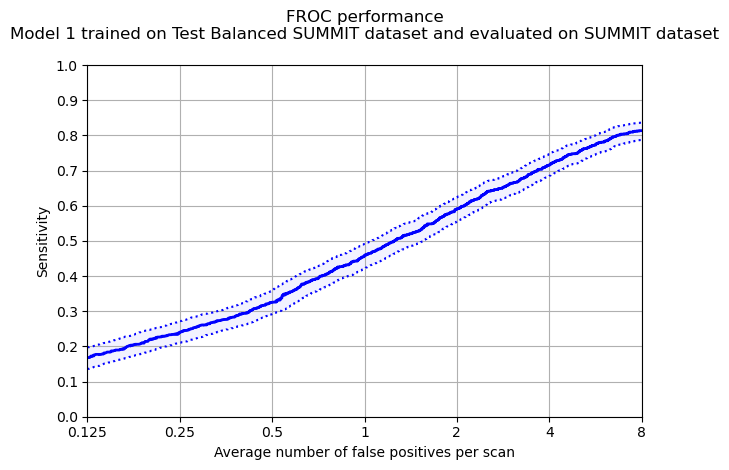

In [5]:
# Add in diameter cuts for later analysis
def combine_site(nodule_site):
    if nodule_site.find('UPPER') > -1:
        return 'UPPER'
    elif nodule_site.find('NOT') > -1:
        return 'NOT_ANSWERED'
    else:
        return 'NOT-UPPER'
    
def combine_site2(nodule_site):
    if nodule_site.find('RIGHT') > -1:
        return 'RIGHT'
    elif nodule_site.find('LEFT') > -1:
        return 'LEFT'
    else:
        return 'NOT_ANSWERED'

diameter_cats = [0, 4, 8, 15, 20, 30, 40, 999]
diameter_lbs = [f'{diameter_cats[i]:02}-{diameter_cats[i+1]:02}' for i in range(len(diameter_cats))[:-1]]

annotations = (
    pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_metadata.csv')
    .assign(diameter_cats=lambda df: 
        pd.cut(
            df['nodule_diameter_mm'], 
            bins=diameter_cats,
            labels=diameter_lbs
        )            
    )
    .assign(nodule_site_combined=lambda df: df['nodule_site'].apply(combine_site))
    .assign(nodule_site_combined2=lambda df: df['nodule_site'].apply(combine_site2))
)

display(annotations.nodule_site_combined.value_counts())

# save back to the metadata file
annotations.to_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_metadata.csv', index=False)
grt123_summit_summit = noduleCADEvaluation(
    annotations_filename=f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_metadata.csv',
    annotations_excluded_filename=f'{workspace_path}/data/summit/metadata/grt123_annotations_excluded_empty.csv',
    seriesuids_filename=f'{workspace_path}/metadata/summit/{flavour}/test_scans.csv',
    results_filename=f"{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_predictions.csv",    
    filter='\nModel 1 trained on Test Balanced SUMMIT dataset and evaluated on SUMMIT dataset\n',
    outputDir=f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}',
)
caluclate_cpm_from_bootstrapping(f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/froc_{flavour}_predictions_bootstrapping.csv')
show_metrics(f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/CADAnalysis.txt')

### Gender analysis

Protected Group: MALE


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,31.0,55.0,3.0,6.0,5.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpr_626f0o/annotations.csv
Total number of included nodule annotations: 650
Total number of nodule annotations: 650
Cases: 492


100%|██████████| 1000/1000 [00:29<00:00, 34.22it/s]


,0,159,476,1111,2381,4920,9999
0,0.179 (0.138 - 0.227),0.262 (0.223 - 0.299),0.327 (0.285 - 0.372),0.47 (0.425 - 0.517),0.585 (0.541 - 0.632),0.715 (0.672 - 0.761),0.833 (0.798 - 0.866)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.179,0.138,0.227
159,0.250,0.262,0.223,0.299
476,0.500,0.327,0.285,0.372
1111,1.000,0.470,0.425,0.517
2381,2.000,0.585,0.541,0.632
4920,4.000,0.715,0.672,0.761
9999,8.000,0.833,0.798,0.866


Mean Sensitivity: 0.48 Low Sensitivity: 0.44 High Sensitivity: 0.525


,True positives,572
0,False positives,10944.000
1,False negatives,78.000
2,True negatives,0.000
3,Total number of candidates,11533.000
4,Total number of nodules,650.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,17.000
7,Sensitivity,0.880
8,Average number of candidates per scan,23.441


Protected Group: FEMALE


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,31.0,47.0,6.0,4.0,12.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpa5acm3fe/annotations.csv
Total number of included nodule annotations: 551
Total number of nodule annotations: 551
Cases: 397


100%|██████████| 1000/1000 [00:18<00:00, 54.76it/s]


,0,159,476,1111,2381,4920,9999
0,0.155 (0.11 - 0.2),0.229 (0.175 - 0.285),0.329 (0.276 - 0.386),0.45 (0.398 - 0.507),0.591 (0.538 - 0.643),0.714 (0.668 - 0.759),0.796 (0.757 - 0.833)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.155,0.110,0.200
159,0.250,0.229,0.175,0.285
476,0.500,0.329,0.276,0.386
1111,1.000,0.450,0.398,0.507
2381,2.000,0.591,0.538,0.643
4920,4.000,0.714,0.668,0.759
9999,8.000,0.796,0.757,0.833


Mean Sensitivity: 0.47 Low Sensitivity: 0.42 High Sensitivity: 0.516


,True positives,466
0,False positives,6949.000
1,False negatives,85.000
2,True negatives,0.000
3,Total number of candidates,7427.000
4,Total number of nodules,551.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,12.000
7,Sensitivity,0.846
8,Average number of candidates per scan,18.708


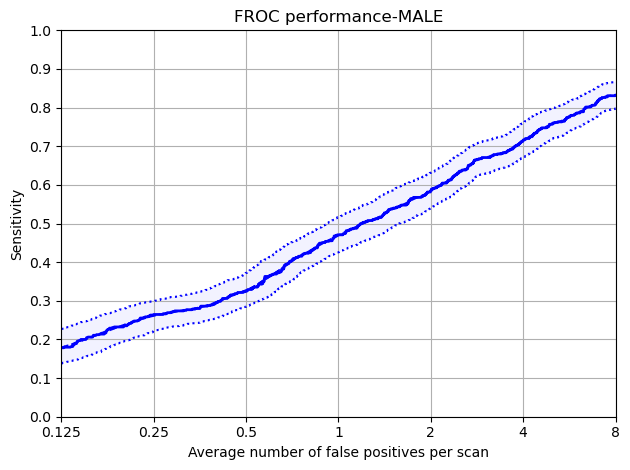

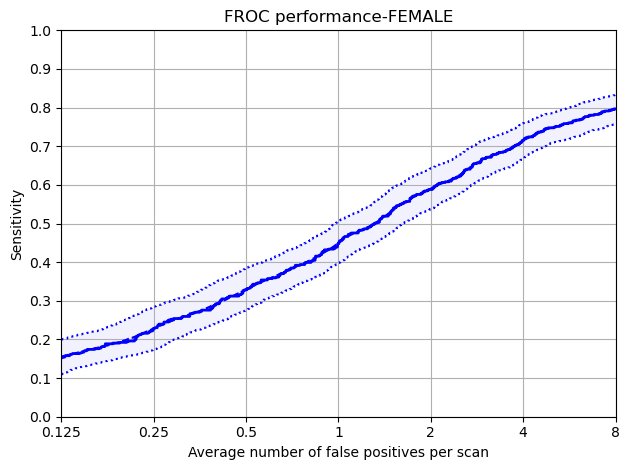

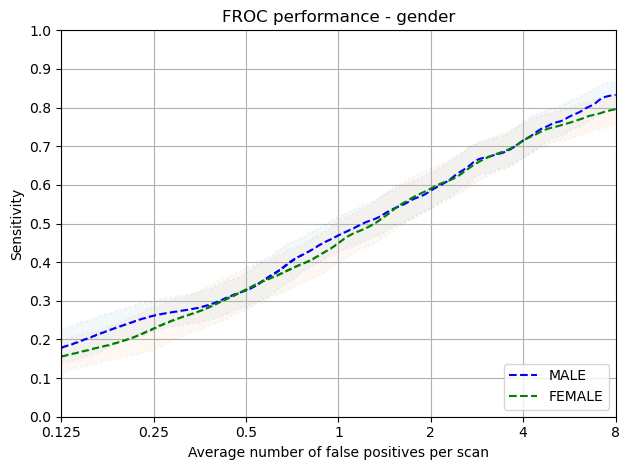

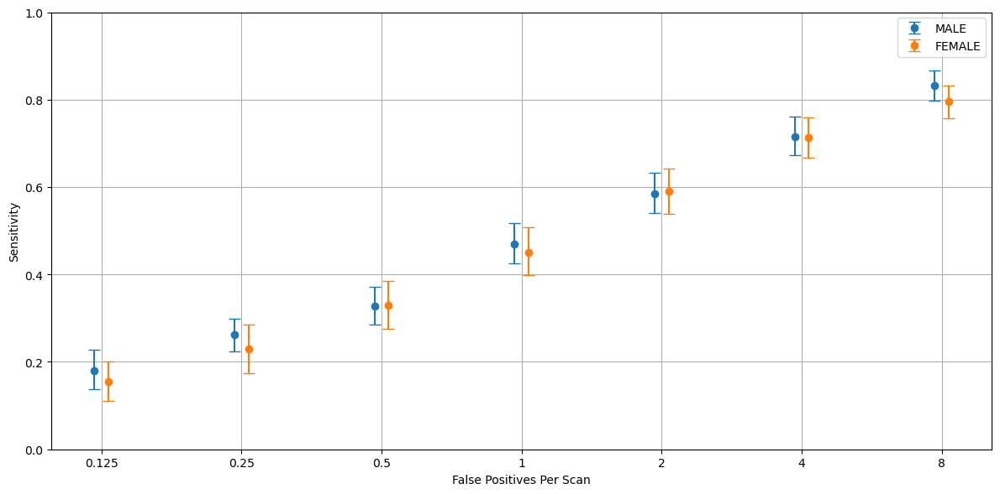

In [6]:

annotations_excluded = pd.read_csv(f'{workspace_path}/data/summit/metadata/grt123_annotations_excluded_empty.csv')

annotations = pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_metadata.csv')

predictions = pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_predictions.csv')

protected_group = 'gender'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('grt123', flavour, 'Gender', data_dict)

### Age Analysis

Protected Group: 70-75


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,33.0,53.0,4.0,3.0,7.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpgkyeueo0/annotations.csv
Total number of included nodule annotations: 339
Total number of nodule annotations: 339
Cases: 237


100%|██████████| 1000/1000 [00:12<00:00, 82.70it/s]


,0,159,476,1111,2381,4920,9999
0,0.155 (0.078 - 0.232),0.239 (0.182 - 0.297),0.316 (0.256 - 0.384),0.466 (0.397 - 0.534),0.578 (0.514 - 0.638),0.701 (0.64 - 0.761),0.817 (0.775 - 0.86)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.155,0.078,0.232
159,0.250,0.239,0.182,0.297
476,0.500,0.316,0.256,0.384
1111,1.000,0.466,0.397,0.534
2381,2.000,0.578,0.514,0.638
4920,4.000,0.701,0.640,0.761
9999,8.000,0.817,0.775,0.860


Mean Sensitivity: 0.47 Low Sensitivity: 0.41 High Sensitivity: 0.529


,True positives,299
0,False positives,5153.000
1,False negatives,40.000
2,True negatives,0.000
3,Total number of candidates,5457.000
4,Total number of nodules,339.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,5.000
7,Sensitivity,0.882
8,Average number of candidates per scan,23.025


Protected Group: 55-59


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,26.0,60.0,5.0,3.0,6.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp1rud6k_s/annotations.csv
Total number of included nodule annotations: 225
Total number of nodule annotations: 225
Cases: 179


100%|██████████| 1000/1000 [00:07<00:00, 139.98it/s]


,0,159,476,1111,2381,4920,9999
0,0.211 (0.12 - 0.308),0.287 (0.218 - 0.365),0.405 (0.32 - 0.5),0.524 (0.441 - 0.612),0.65 (0.579 - 0.722),0.762 (0.679 - 0.837),0.837 (0.774 - 0.894)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.211,0.120,0.308
159,0.250,0.287,0.218,0.365
476,0.500,0.405,0.320,0.500
1111,1.000,0.524,0.441,0.612
2381,2.000,0.650,0.579,0.722
4920,4.000,0.762,0.679,0.837
9999,8.000,0.837,0.774,0.894


Mean Sensitivity: 0.53 Low Sensitivity: 0.45 High Sensitivity: 0.605


,True positives,194
0,False positives,3086.000
1,False negatives,31.000
2,True negatives,0.000
3,Total number of candidates,3287.000
4,Total number of nodules,225.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,7.000
7,Sensitivity,0.862
8,Average number of candidates per scan,18.363


Protected Group: 60-64


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,27.0,54.0,4.0,5.0,10.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpsgmqlivr/annotations.csv
Total number of included nodule annotations: 271
Total number of nodule annotations: 271
Cases: 217


100%|██████████| 1000/1000 [00:09<00:00, 108.14it/s]


,0,159,476,1111,2381,4920,9999
0,0.159 (0.102 - 0.221),0.219 (0.167 - 0.282),0.326 (0.25 - 0.404),0.45 (0.38 - 0.53),0.6 (0.525 - 0.679),0.716 (0.65 - 0.781),0.815 (0.76 - 0.871)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.159,0.102,0.221
159,0.250,0.219,0.167,0.282
476,0.500,0.326,0.250,0.404
1111,1.000,0.450,0.380,0.530
2381,2.000,0.600,0.525,0.679
4920,4.000,0.716,0.650,0.781
9999,8.000,0.815,0.760,0.871


Mean Sensitivity: 0.47 Low Sensitivity: 0.4 High Sensitivity: 0.538


,True positives,234
0,False positives,4183.000
1,False negatives,37.000
2,True negatives,0.000
3,Total number of candidates,4424.000
4,Total number of nodules,271.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,7.000
7,Sensitivity,0.863
8,Average number of candidates per scan,20.387


Protected Group: 65-69


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,34.0,43.0,5.0,10.0,8.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpefksdxax/annotations.csv
Total number of included nodule annotations: 274
Total number of nodule annotations: 274
Cases: 205


100%|██████████| 1000/1000 [00:09<00:00, 110.54it/s]


,0,159,476,1111,2381,4920,9999
0,0.15 (0.09 - 0.208),0.203 (0.156 - 0.262),0.303 (0.243 - 0.375),0.424 (0.355 - 0.489),0.569 (0.493 - 0.648),0.71 (0.649 - 0.774),0.789 (0.732 - 0.846)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.150,0.090,0.208
159,0.250,0.203,0.156,0.262
476,0.500,0.303,0.243,0.375
1111,1.000,0.424,0.355,0.489
2381,2.000,0.569,0.493,0.648
4920,4.000,0.710,0.649,0.774
9999,8.000,0.789,0.732,0.846


Mean Sensitivity: 0.45 Low Sensitivity: 0.39 High Sensitivity: 0.515


,True positives,232
0,False positives,4303.000
1,False negatives,42.000
2,True negatives,0.000
3,Total number of candidates,4544.000
4,Total number of nodules,274.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,9.000
7,Sensitivity,0.847
8,Average number of candidates per scan,22.166


Protected Group: 75+


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,43.0,40.0,1.0,1.0,14.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp5knypabv/annotations.csv
Total number of included nodule annotations: 92
Total number of nodule annotations: 92
Cases: 54


100%|██████████| 1000/1000 [00:02<00:00, 333.44it/s]


,0,159,476,1111,2381,4920,9999
0,0.245 (0.136 - 0.366),0.293 (0.203 - 0.397),0.328 (0.224 - 0.466),0.435 (0.321 - 0.562),0.539 (0.41 - 0.677),0.632 (0.5 - 0.775),0.774 (0.643 - 0.892)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.245,0.136,0.366
159,0.250,0.293,0.203,0.397
476,0.500,0.328,0.224,0.466
1111,1.000,0.435,0.321,0.562
2381,2.000,0.539,0.410,0.677
4920,4.000,0.632,0.500,0.775
9999,8.000,0.774,0.643,0.892


Mean Sensitivity: 0.46 Low Sensitivity: 0.35 High Sensitivity: 0.591


,True positives,79
0,False positives,1168.000
1,False negatives,13.000
2,True negatives,0.000
3,Total number of candidates,1248.000
4,Total number of nodules,92.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,1.000
7,Sensitivity,0.859
8,Average number of candidates per scan,23.111


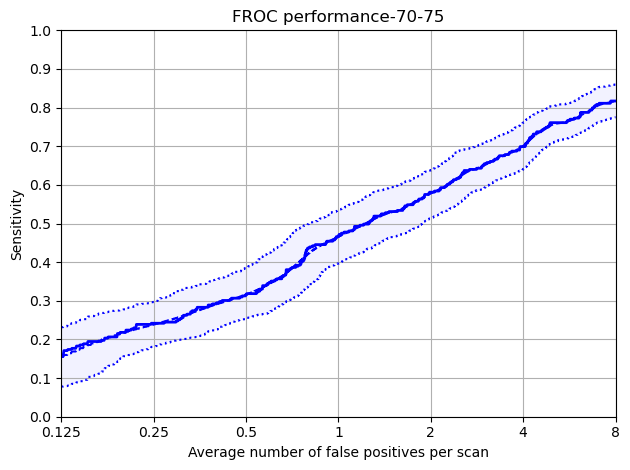

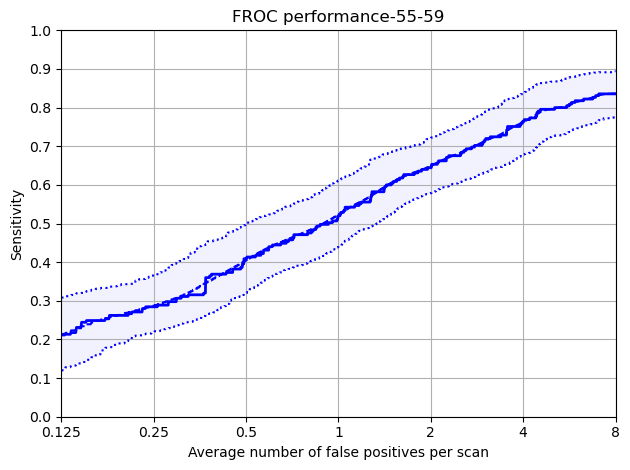

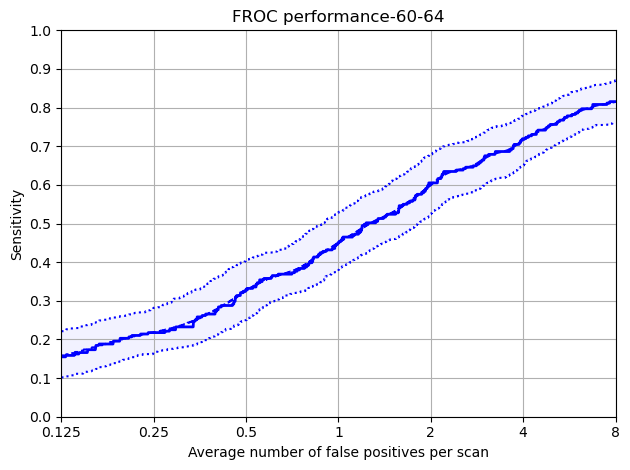

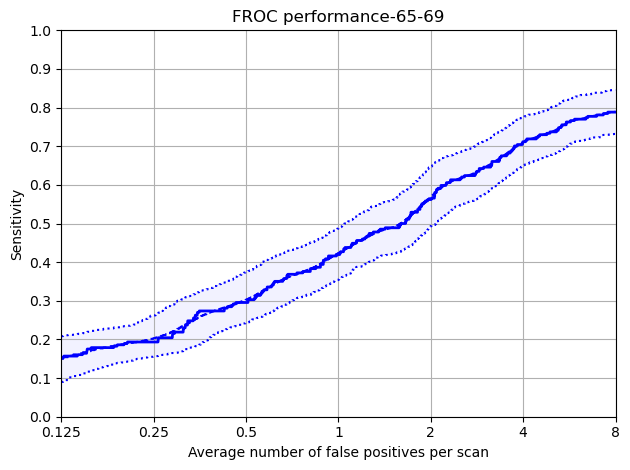

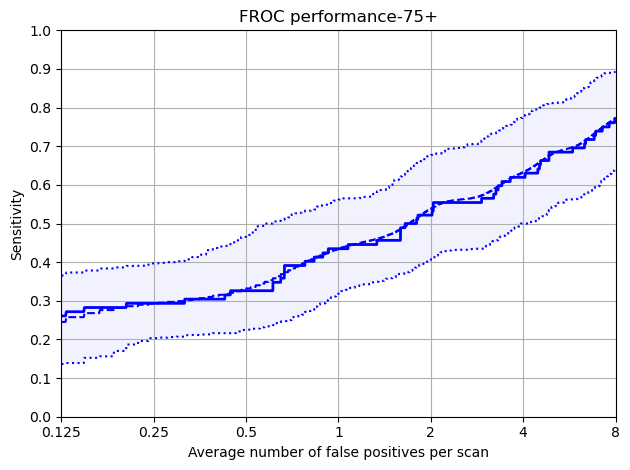

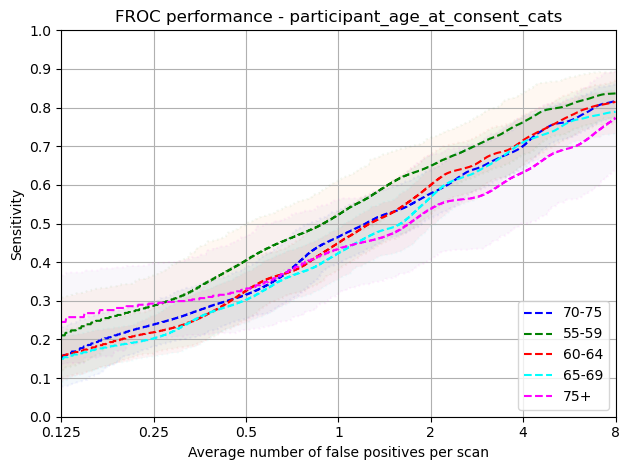

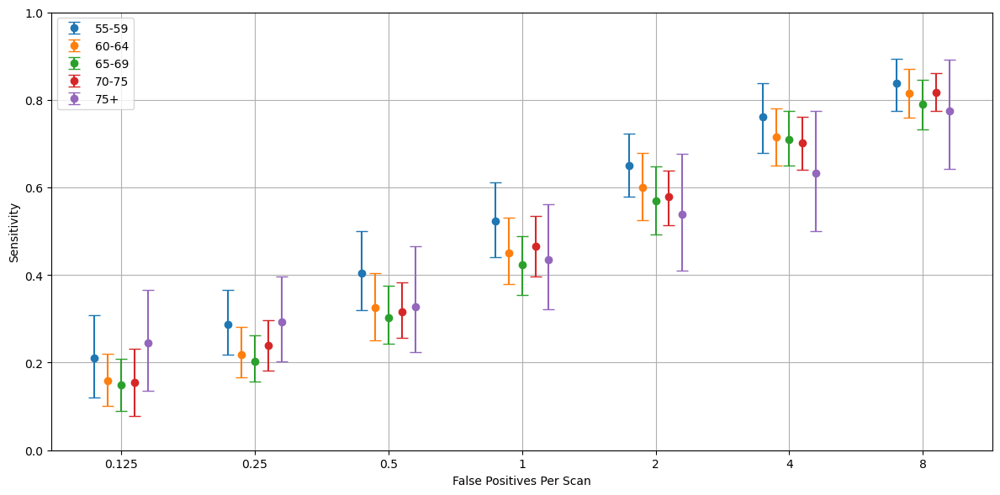

In [7]:
protected_group = 'participant_age_at_consent_cats'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('grt123', flavour, 'Age', data_dict, ['55-59','60-64','65-69','70-75','75+'])

In [8]:
data_dict

{'70-75':        mean_sens  low_sens  high_sens
 fps                                  
 0.125      0.155     0.078      0.232
 0.250      0.239     0.182      0.297
 0.500      0.316     0.256      0.384
 1.000      0.466     0.397      0.534
 2.000      0.578     0.514      0.638
 4.000      0.701     0.640      0.761
 8.000      0.817     0.775      0.860,
 '55-59':        mean_sens  low_sens  high_sens
 fps                                  
 0.125      0.211     0.120      0.308
 0.250      0.287     0.218      0.365
 0.500      0.405     0.320      0.500
 1.000      0.524     0.441      0.612
 2.000      0.650     0.579      0.722
 4.000      0.762     0.679      0.837
 8.000      0.837     0.774      0.894,
 '60-64':        mean_sens  low_sens  high_sens
 fps                                  
 0.125      0.159     0.102      0.221
 0.250      0.219     0.167      0.282
 0.500      0.326     0.250      0.404
 1.000      0.450     0.380      0.530
 2.000      0.600     0.525      0.

### Ethnicity analysis

Protected Group: White


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,31.0,51.0,4.0,5.0,8.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpd2rt4u6x/annotations.csv
Total number of included nodule annotations: 1201
Total number of nodule annotations: 1201
Cases: 888


100%|██████████| 1000/1000 [00:46<00:00, 21.44it/s]


,0,159,476,1111,2381,4920,9999
0,0.17 (0.136 - 0.202),0.24 (0.211 - 0.272),0.325 (0.293 - 0.362),0.456 (0.421 - 0.491),0.587 (0.553 - 0.62),0.713 (0.682 - 0.744),0.811 (0.784 - 0.837)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.170,0.136,0.202
159,0.250,0.240,0.211,0.272
476,0.500,0.325,0.293,0.362
1111,1.000,0.456,0.421,0.491
2381,2.000,0.587,0.553,0.620
4920,4.000,0.713,0.682,0.744
9999,8.000,0.811,0.784,0.837


Mean Sensitivity: 0.47 Low Sensitivity: 0.44 High Sensitivity: 0.504


,True positives,1038
0,False positives,17893.000
1,False negatives,163.000
2,True negatives,0.000
3,Total number of candidates,18960.000
4,Total number of nodules,1201.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,29.000
7,Sensitivity,0.864
8,Average number of candidates per scan,21.351


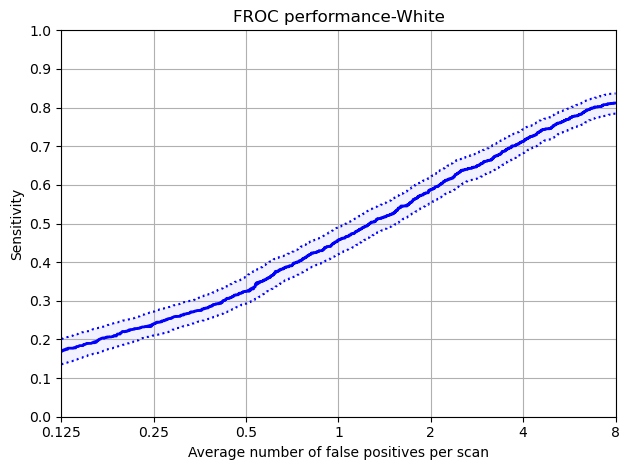

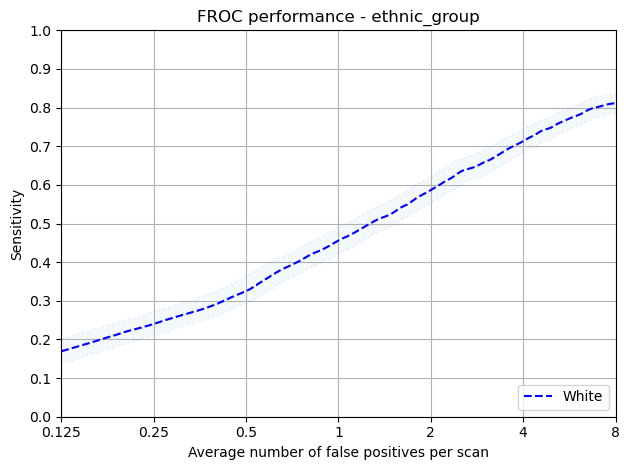

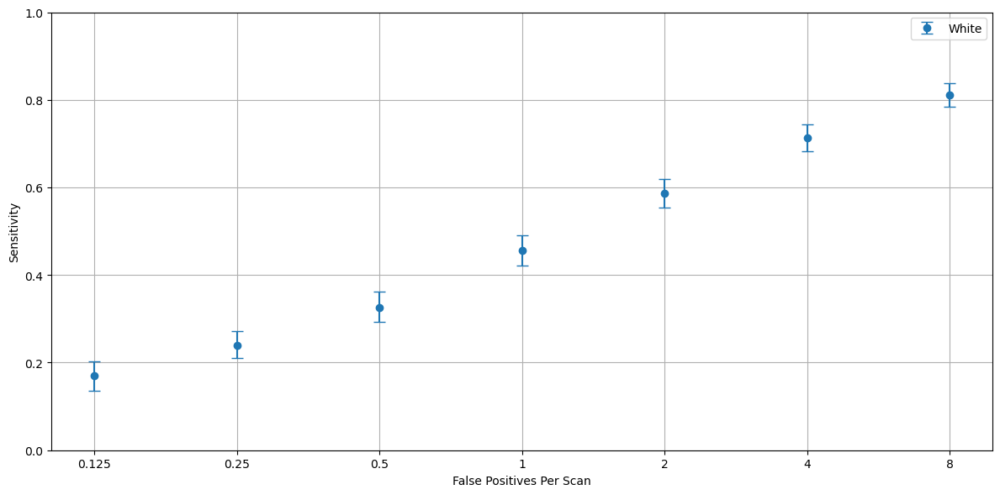

In [9]:
protected_group = 'ethnic_group'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('grt123', flavour,'Ethnic Group', data_dict, order=['Asian or Asian British','Black','White'])

### IMDRank_tertile

Protected Group: High


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,33.0,48.0,4.0,6.0,9.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp2ug8bnpw/annotations.csv
Total number of included nodule annotations: 386
Total number of nodule annotations: 386
Cases: 317


100%|██████████| 1000/1000 [00:12<00:00, 77.00it/s]


,0,159,476,1111,2381,4920,9999
0,0.162 (0.095 - 0.229),0.257 (0.196 - 0.317),0.337 (0.277 - 0.403),0.487 (0.433 - 0.548),0.633 (0.57 - 0.696),0.722 (0.665 - 0.78),0.808 (0.769 - 0.85)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.162,0.095,0.229
159,0.250,0.257,0.196,0.317
476,0.500,0.337,0.277,0.403
1111,1.000,0.487,0.433,0.548
2381,2.000,0.633,0.570,0.696
4920,4.000,0.722,0.665,0.780
9999,8.000,0.808,0.769,0.850


Mean Sensitivity: 0.49 Low Sensitivity: 0.43 High Sensitivity: 0.546


,True positives,337
0,False positives,6286.000
1,False negatives,49.000
2,True negatives,0.000
3,Total number of candidates,6625.000
4,Total number of nodules,386.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,2.000
7,Sensitivity,0.873
8,Average number of candidates per scan,20.899


Protected Group: Low


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,28.0,56.0,6.0,4.0,7.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpzkrcko0q/annotations.csv
Total number of included nodule annotations: 400
Total number of nodule annotations: 400
Cases: 260


100%|██████████| 1000/1000 [00:10<00:00, 95.78it/s]


,0,159,476,1111,2381,4920,9999
0,0.16 (0.104 - 0.222),0.23 (0.184 - 0.282),0.314 (0.251 - 0.387),0.425 (0.368 - 0.493),0.55 (0.488 - 0.612),0.715 (0.661 - 0.767),0.827 (0.784 - 0.867)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.160,0.104,0.222
159,0.250,0.230,0.184,0.282
476,0.500,0.314,0.251,0.387
1111,1.000,0.425,0.368,0.493
2381,2.000,0.550,0.488,0.612
4920,4.000,0.715,0.661,0.767
9999,8.000,0.827,0.784,0.867


Mean Sensitivity: 0.46 Low Sensitivity: 0.41 High Sensitivity: 0.519


,True positives,352
0,False positives,5235.00
1,False negatives,48.00
2,True negatives,0.00
3,Total number of candidates,5603.00
4,Total number of nodules,400.00
5,Ignored candidates on excluded nodules,0.00
6,Ignored candidates which were double detec...,16.00
7,Sensitivity,0.88
8,Average number of candidates per scan,21.55


Protected Group: Medium


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,32.0,50.0,3.0,5.0,9.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpw7d_9i5f/annotations.csv
Total number of included nodule annotations: 411
Total number of nodule annotations: 411
Cases: 303


100%|██████████| 1000/1000 [00:12<00:00, 79.18it/s]


,0,159,476,1111,2381,4920,9999
0,0.178 (0.132 - 0.223),0.236 (0.19 - 0.286),0.333 (0.28 - 0.39),0.456 (0.404 - 0.511),0.585 (0.526 - 0.647),0.71 (0.655 - 0.764),0.806 (0.76 - 0.851)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.178,0.132,0.223
159,0.250,0.236,0.190,0.286
476,0.500,0.333,0.280,0.390
1111,1.000,0.456,0.404,0.511
2381,2.000,0.585,0.526,0.647
4920,4.000,0.710,0.655,0.764
9999,8.000,0.806,0.760,0.851


Mean Sensitivity: 0.47 Low Sensitivity: 0.42 High Sensitivity: 0.525


,True positives,345
0,False positives,6157.000
1,False negatives,66.000
2,True negatives,0.000
3,Total number of candidates,6513.000
4,Total number of nodules,411.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,11.000
7,Sensitivity,0.839
8,Average number of candidates per scan,21.495


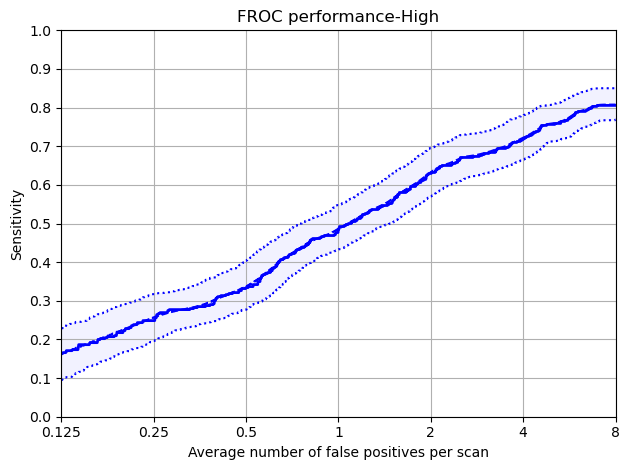

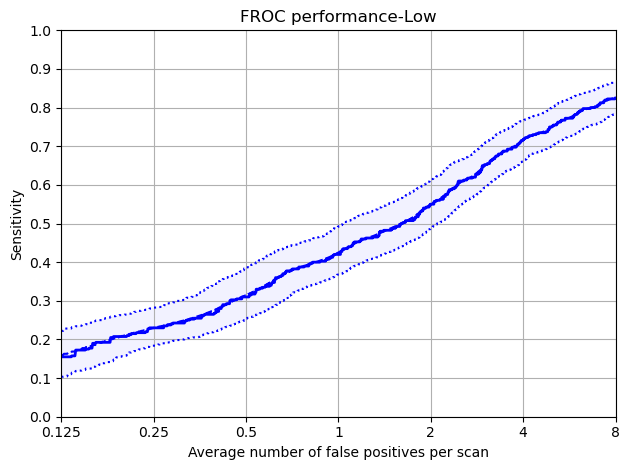

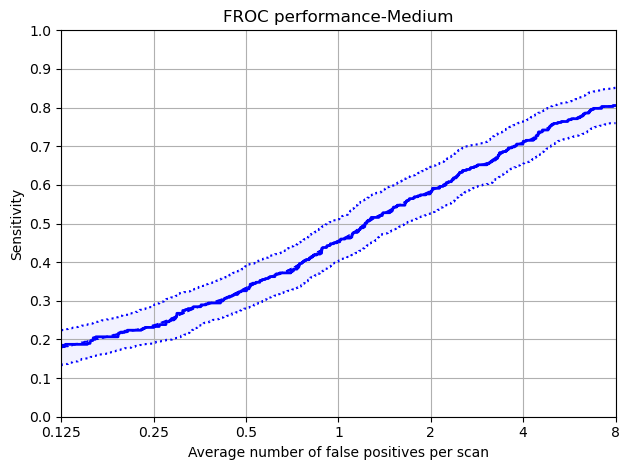

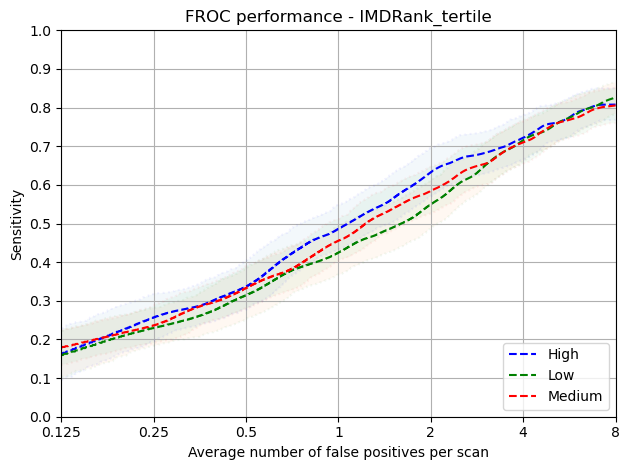

In [10]:
protected_group = 'IMDRank_tertile'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)

### Smoking Pack Years


Protected Group: Medium (35-50)


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,36.0,50.0,3.0,5.0,6.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpvf7sa8ju/annotations.csv
Total number of included nodule annotations: 354
Total number of nodule annotations: 354
Cases: 292


100%|██████████| 1000/1000 [00:11<00:00, 86.49it/s]


,0,159,476,1111,2381,4920,9999
0,0.206 (0.159 - 0.257),0.27 (0.217 - 0.323),0.375 (0.31 - 0.436),0.481 (0.421 - 0.546),0.609 (0.549 - 0.673),0.757 (0.701 - 0.81),0.821 (0.77 - 0.869)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.206,0.159,0.257
159,0.250,0.270,0.217,0.323
476,0.500,0.375,0.310,0.436
1111,1.000,0.481,0.421,0.546
2381,2.000,0.609,0.549,0.673
4920,4.000,0.757,0.701,0.810
9999,8.000,0.821,0.770,0.869


Mean Sensitivity: 0.5 Low Sensitivity: 0.45 High Sensitivity: 0.559


,True positives,303
0,False positives,5793.000
1,False negatives,51.000
2,True negatives,0.000
3,Total number of candidates,6105.000
4,Total number of nodules,354.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,9.000
7,Sensitivity,0.856
8,Average number of candidates per scan,20.908


Protected Group: Low (15-35)


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,28.0,53.0,5.0,3.0,10.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp47h3qjkp/annotations.csv
Total number of included nodule annotations: 432
Total number of nodule annotations: 432
Cases: 296


100%|██████████| 1000/1000 [00:11<00:00, 83.39it/s]


,0,159,476,1111,2381,4920,9999
0,0.14 (0.08 - 0.2),0.223 (0.161 - 0.279),0.312 (0.251 - 0.371),0.446 (0.385 - 0.511),0.575 (0.515 - 0.646),0.676 (0.62 - 0.735),0.772 (0.724 - 0.818)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.140,0.080,0.200
159,0.250,0.223,0.161,0.279
476,0.500,0.312,0.251,0.371
1111,1.000,0.446,0.385,0.511
2381,2.000,0.575,0.515,0.646
4920,4.000,0.676,0.620,0.735
9999,8.000,0.772,0.724,0.818


Mean Sensitivity: 0.45 Low Sensitivity: 0.39 High Sensitivity: 0.509


,True positives,364
0,False positives,5795.000
1,False negatives,68.000
2,True negatives,0.000
3,Total number of candidates,6168.000
4,Total number of nodules,432.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,9.000
7,Sensitivity,0.843
8,Average number of candidates per scan,20.838


Protected Group: High (50+)


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,31.0,50.0,5.0,7.0,8.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp4vyj2k1f/annotations.csv
Total number of included nodule annotations: 415
Total number of nodule annotations: 415
Cases: 302


100%|██████████| 1000/1000 [00:12<00:00, 77.91it/s]


,0,159,476,1111,2381,4920,9999
0,0.169 (0.119 - 0.232),0.239 (0.191 - 0.295),0.304 (0.253 - 0.368),0.447 (0.396 - 0.499),0.581 (0.529 - 0.633),0.706 (0.655 - 0.758),0.848 (0.814 - 0.882)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.169,0.119,0.232
159,0.250,0.239,0.191,0.295
476,0.500,0.304,0.253,0.368
1111,1.000,0.447,0.396,0.499
2381,2.000,0.581,0.529,0.633
4920,4.000,0.706,0.655,0.758
9999,8.000,0.848,0.814,0.882


Mean Sensitivity: 0.47 Low Sensitivity: 0.42 High Sensitivity: 0.524


,True positives,371
0,False positives,6305.000
1,False negatives,44.000
2,True negatives,0.000
3,Total number of candidates,6687.000
4,Total number of nodules,415.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,11.000
7,Sensitivity,0.894
8,Average number of candidates per scan,22.142


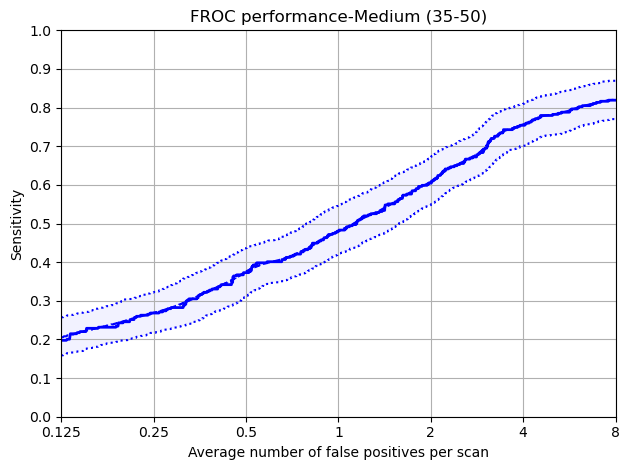

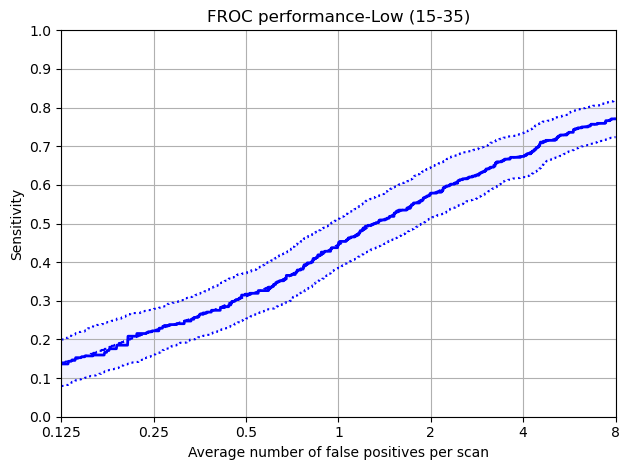

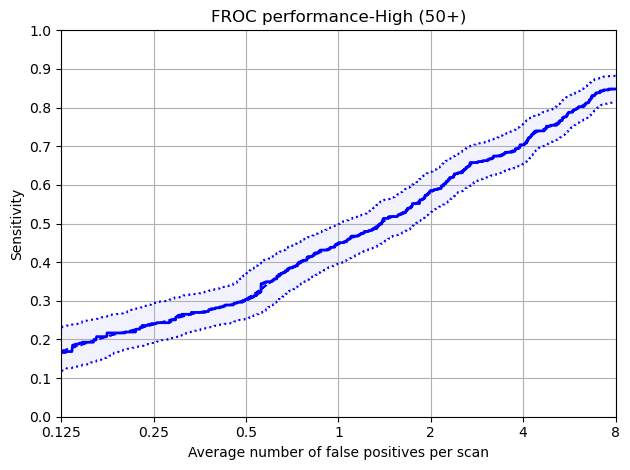

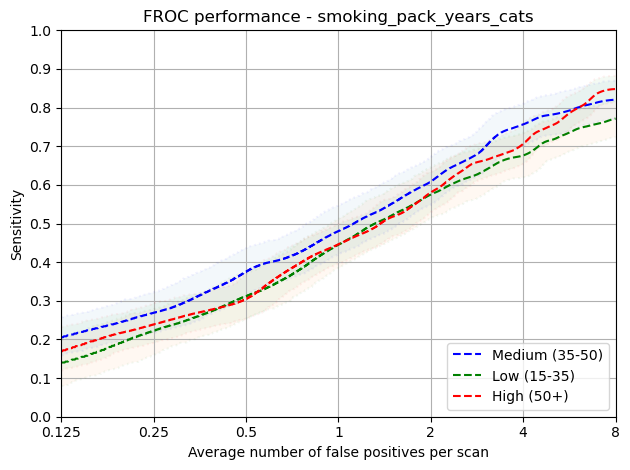

In [11]:
protected_group = 'smoking_pack_years_cats'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)

### Actionable Vs Non-Actionable

Protected Group: Non-Actionable


,SOLID,PERIFISSURAL
nodule_type,13.0,87.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmppsms3prl/annotations.csv
Total number of included nodule annotations: 435
Total number of nodule annotations: 435
Cases: 594


100%|██████████| 1000/1000 [00:26<00:00, 37.80it/s]


,0,159,476,1111,2381,4920,9999
0,0.155 (0.105 - 0.206),0.23 (0.187 - 0.276),0.345 (0.293 - 0.402),0.511 (0.461 - 0.561),0.663 (0.612 - 0.716),0.787 (0.742 - 0.83),0.875 (0.84 - 0.91)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.155,0.105,0.206
159,0.250,0.230,0.187,0.276
476,0.500,0.345,0.293,0.402
1111,1.000,0.511,0.461,0.561
2381,2.000,0.663,0.612,0.716
4920,4.000,0.787,0.742,0.830
9999,8.000,0.875,0.840,0.910


Mean Sensitivity: 0.51 Low Sensitivity: 0.46 High Sensitivity: 0.557


,True positives,393
0,False positives,11599.000
1,False negatives,42.000
2,True negatives,0.000
3,Total number of candidates,11992.000
4,Total number of nodules,435.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.903
8,Average number of candidates per scan,20.189


Protected Group: Actonable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,42.0,31.0,7.0,8.0,13.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpocxrqphy/annotations.csv
Total number of included nodule annotations: 766
Total number of nodule annotations: 766
Cases: 295


100%|██████████| 1000/1000 [00:13<00:00, 74.07it/s]


,0,159,476,1111,2381,4920,9999
0,0.15 (0.098 - 0.215),0.225 (0.184 - 0.267),0.309 (0.261 - 0.357),0.418 (0.374 - 0.466),0.53 (0.486 - 0.579),0.662 (0.619 - 0.704),0.773 (0.736 - 0.811)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.150,0.098,0.215
159,0.250,0.225,0.184,0.267
476,0.500,0.309,0.261,0.357
1111,1.000,0.418,0.374,0.466
2381,2.000,0.530,0.486,0.579
4920,4.000,0.662,0.619,0.704
9999,8.000,0.773,0.736,0.811


Mean Sensitivity: 0.44 Low Sensitivity: 0.39 High Sensitivity: 0.486


,True positives,645
0,False positives,6294.000
1,False negatives,121.000
2,True negatives,0.000
3,Total number of candidates,6968.000
4,Total number of nodules,766.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,29.000
7,Sensitivity,0.842
8,Average number of candidates per scan,23.620


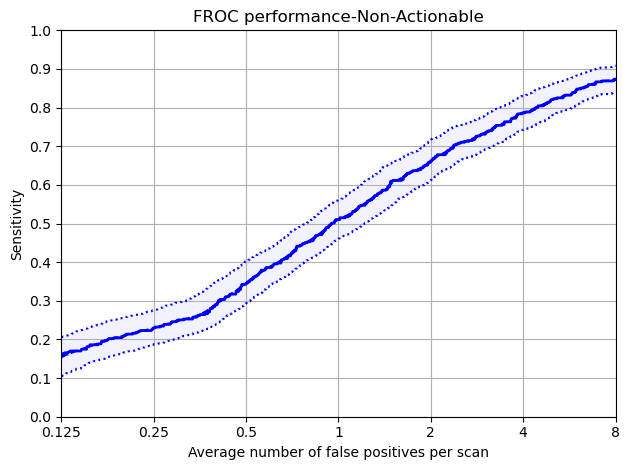

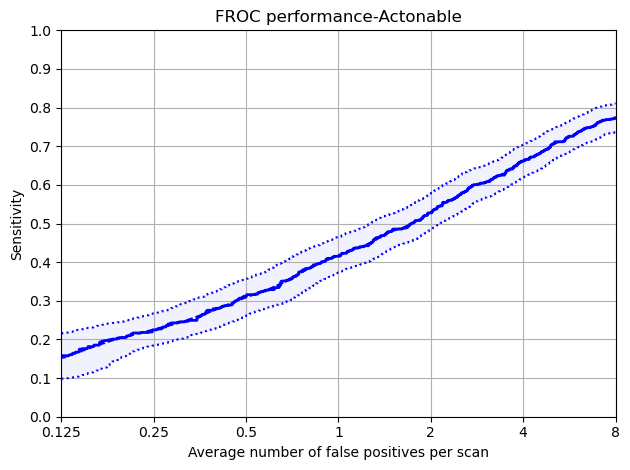

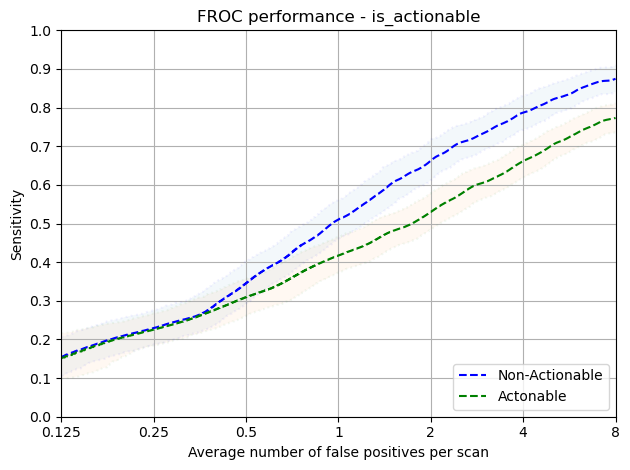

In [12]:
protected_group = 'is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)

### Actionable-Gender Splits

Protected Group: Male


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,45.0,32.0,5.0,9.0,8.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpo40j_uuu/annotations.csv
Total number of included nodule annotations: 380
Total number of nodule annotations: 380
Cases: 151


100%|██████████| 1000/1000 [00:07<00:00, 131.35it/s]


,0,159,476,1111,2381,4920,9999
0,0.161 (0.111 - 0.237),0.252 (0.185 - 0.319),0.31 (0.255 - 0.372),0.414 (0.347 - 0.479),0.522 (0.462 - 0.589),0.65 (0.593 - 0.716),0.79 (0.739 - 0.842)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.161,0.111,0.237
159,0.250,0.252,0.185,0.319
476,0.500,0.310,0.255,0.372
1111,1.000,0.414,0.347,0.479
2381,2.000,0.522,0.462,0.589
4920,4.000,0.650,0.593,0.716
9999,8.000,0.790,0.739,0.842


Mean Sensitivity: 0.44 Low Sensitivity: 0.38 High Sensitivity: 0.508


,True positives,326
0,False positives,3533.000
1,False negatives,54.000
2,True negatives,0.000
3,Total number of candidates,3876.000
4,Total number of nodules,380.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,17.000
7,Sensitivity,0.858
8,Average number of candidates per scan,25.669


Protected Group: Female


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,39.0,30.0,9.0,6.0,17.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpqs9e1o26/annotations.csv
Total number of included nodule annotations: 386
Total number of nodule annotations: 386
Cases: 145


100%|██████████| 1000/1000 [00:05<00:00, 167.95it/s]


,0,159,476,1111,2381,4920,9999
0,0.145 (0.049 - 0.213),0.209 (0.145 - 0.3),0.319 (0.243 - 0.396),0.429 (0.369 - 0.495),0.545 (0.476 - 0.613),0.668 (0.604 - 0.73),0.762 (0.706 - 0.814)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.145,0.049,0.213
159,0.250,0.209,0.145,0.300
476,0.500,0.319,0.243,0.396
1111,1.000,0.429,0.369,0.495
2381,2.000,0.545,0.476,0.613
4920,4.000,0.668,0.604,0.730
9999,8.000,0.762,0.706,0.814


Mean Sensitivity: 0.44 Low Sensitivity: 0.37 High Sensitivity: 0.509


,True positives,319
0,False positives,2761.000
1,False negatives,67.000
2,True negatives,0.000
3,Total number of candidates,3092.000
4,Total number of nodules,386.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,12.000
7,Sensitivity,0.826
8,Average number of candidates per scan,21.324


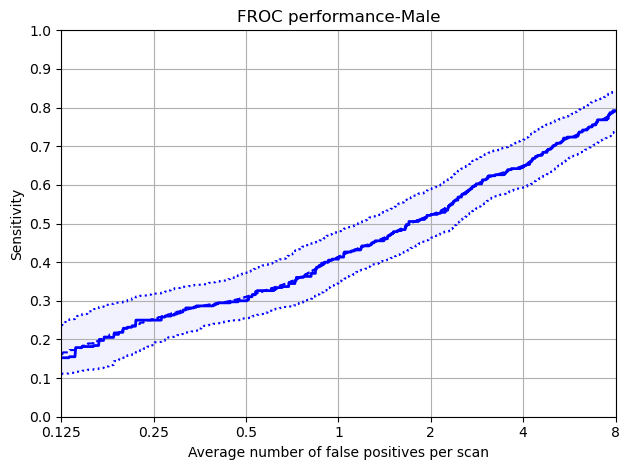

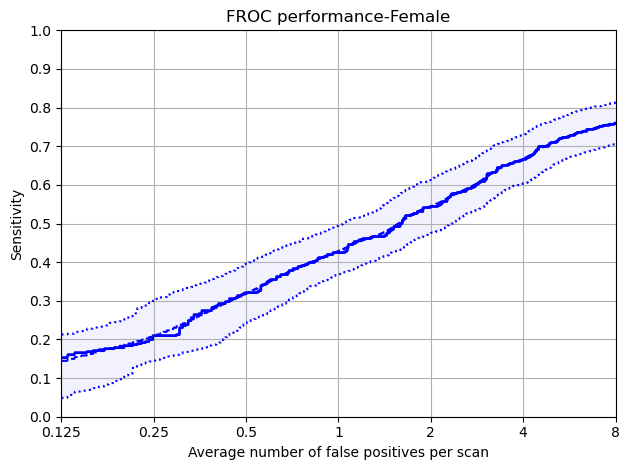

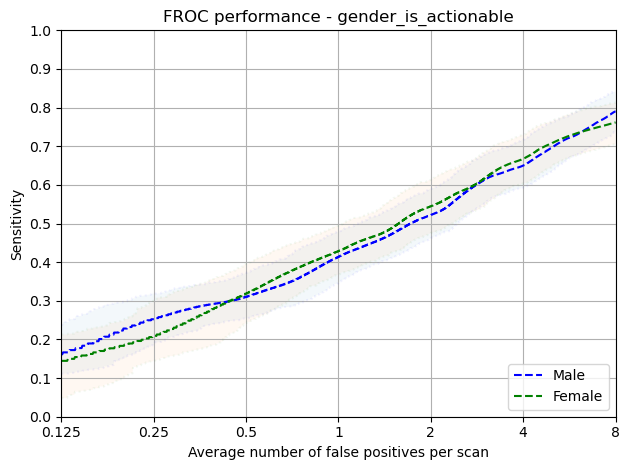

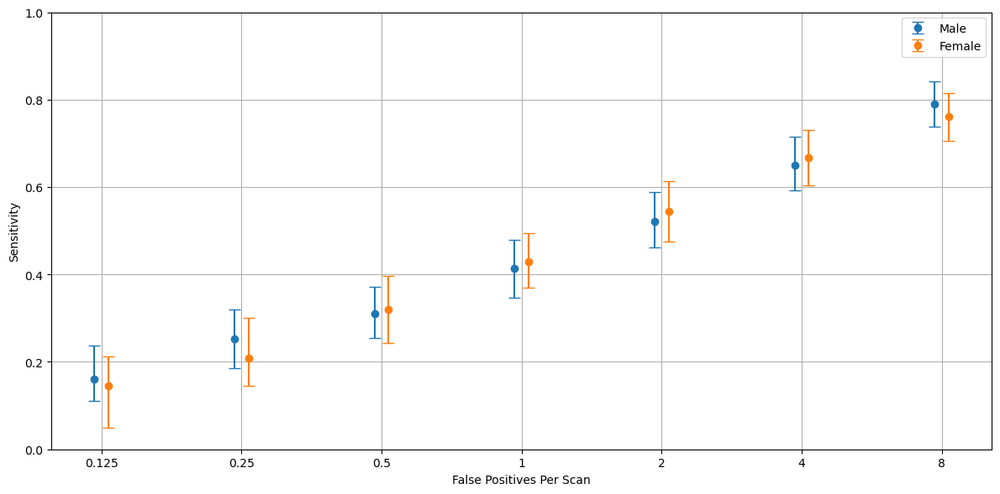

In [13]:
protected_group = 'gender_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('grt123', flavour, 'Actionable, Gender', data_dict)

### NonActionable-Gender

Protected Group: Male


,SOLID,PERIFISSURAL
nodule_type,11.0,89.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpf5qp05ts/annotations.csv
Total number of included nodule annotations: 270
Total number of nodule annotations: 270
Cases: 342


100%|██████████| 1000/1000 [00:14<00:00, 68.04it/s]


,0,159,476,1111,2381,4920,9999
0,0.161 (0.097 - 0.229),0.246 (0.188 - 0.303),0.353 (0.278 - 0.43),0.533 (0.463 - 0.604),0.655 (0.592 - 0.721),0.785 (0.722 - 0.85),0.885 (0.84 - 0.929)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.161,0.097,0.229
159,0.250,0.246,0.188,0.303
476,0.500,0.353,0.278,0.430
1111,1.000,0.533,0.463,0.604
2381,2.000,0.655,0.592,0.721
4920,4.000,0.785,0.722,0.850
9999,8.000,0.885,0.840,0.929


Mean Sensitivity: 0.52 Low Sensitivity: 0.45 High Sensitivity: 0.581


,True positives,246
0,False positives,7411.000
1,False negatives,24.000
2,True negatives,0.000
3,Total number of candidates,7657.000
4,Total number of nodules,270.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.911
8,Average number of candidates per scan,22.389


Protected Group: Female


,SOLID,PERIFISSURAL
nodule_type,15.0,85.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpkx8lb2yq/annotations.csv
Total number of included nodule annotations: 165
Total number of nodule annotations: 165
Cases: 253


100%|██████████| 1000/1000 [00:09<00:00, 108.96it/s]


,0,159,476,1111,2381,4920,9999
0,0.134 (0.07 - 0.204),0.207 (0.135 - 0.286),0.32 (0.239 - 0.409),0.49 (0.396 - 0.577),0.668 (0.596 - 0.737),0.785 (0.72 - 0.848),0.86 (0.803 - 0.912)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.134,0.070,0.204
159,0.250,0.207,0.135,0.286
476,0.500,0.320,0.239,0.409
1111,1.000,0.490,0.396,0.577
2381,2.000,0.668,0.596,0.737
4920,4.000,0.785,0.720,0.848
9999,8.000,0.860,0.803,0.912


Mean Sensitivity: 0.49 Low Sensitivity: 0.42 High Sensitivity: 0.568


,True positives,147
0,False positives,4188.000
1,False negatives,18.000
2,True negatives,0.000
3,Total number of candidates,4335.000
4,Total number of nodules,165.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.891
8,Average number of candidates per scan,17.134


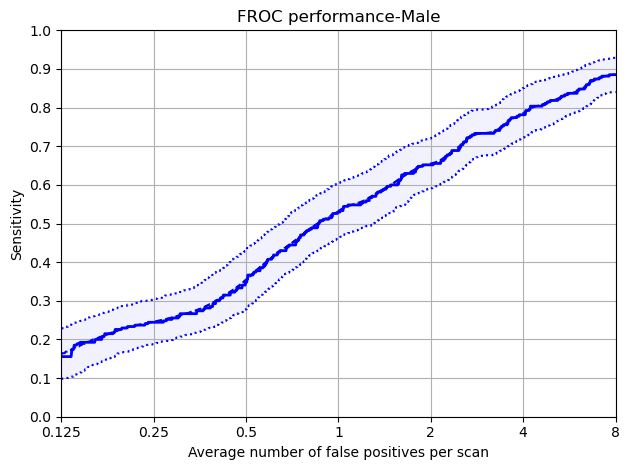

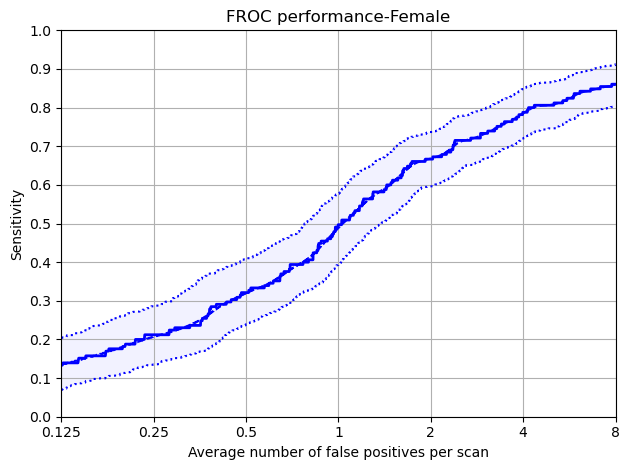

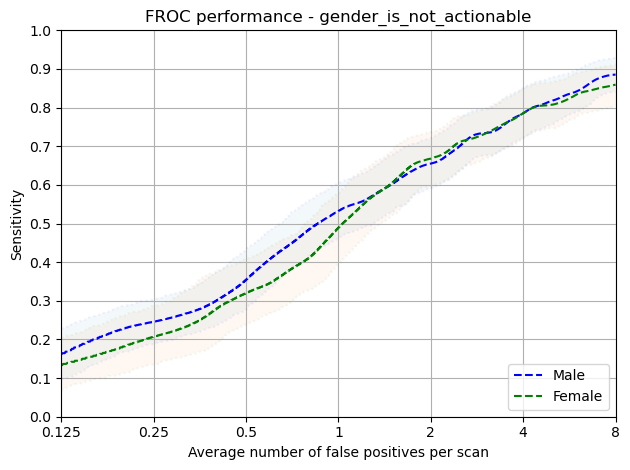

In [14]:
protected_group = 'gender_is_not_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)

### Actionable Ethnic Group

Protected Group: White


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,42.0,31.0,7.0,8.0,13.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpbpp4rp5h/annotations.csv
Total number of included nodule annotations: 766
Total number of nodule annotations: 766
Cases: 295


100%|██████████| 1000/1000 [00:13<00:00, 73.74it/s]


,0,159,476,1111,2381,4920,9999
0,0.151 (0.099 - 0.211),0.227 (0.186 - 0.267),0.311 (0.264 - 0.353),0.419 (0.374 - 0.463),0.531 (0.484 - 0.575),0.662 (0.622 - 0.702),0.774 (0.738 - 0.807)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.151,0.099,0.211
159,0.250,0.227,0.186,0.267
476,0.500,0.311,0.264,0.353
1111,1.000,0.419,0.374,0.463
2381,2.000,0.531,0.484,0.575
4920,4.000,0.662,0.622,0.702
9999,8.000,0.774,0.738,0.807


Mean Sensitivity: 0.44 Low Sensitivity: 0.4 High Sensitivity: 0.483


,True positives,645
0,False positives,6294.000
1,False negatives,121.000
2,True negatives,0.000
3,Total number of candidates,6968.000
4,Total number of nodules,766.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,29.000
7,Sensitivity,0.842
8,Average number of candidates per scan,23.620


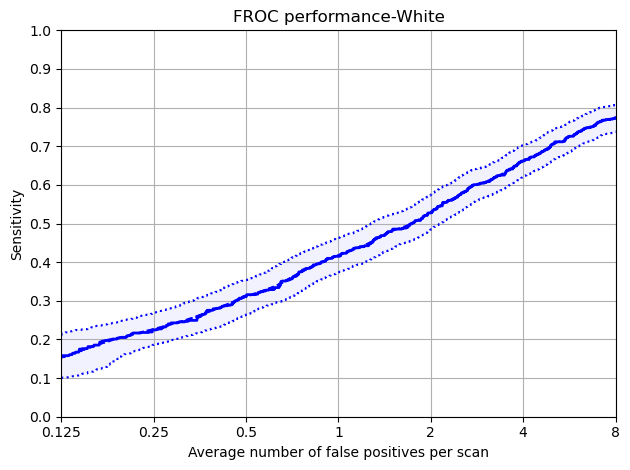

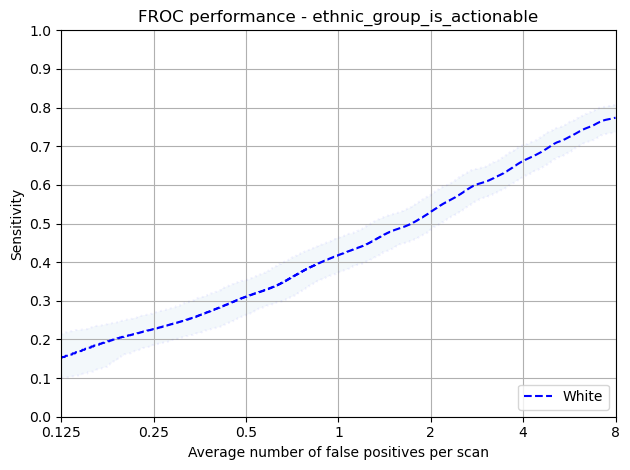

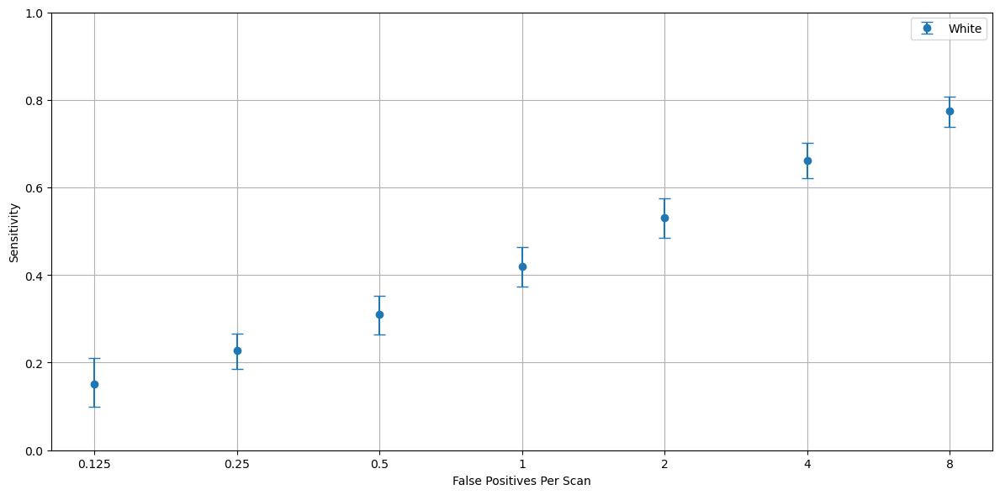

In [15]:
protected_group = 'ethnic_group_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('grt123', flavour, 'Actionable, Ethnic Group', data_dict, order=['Asian or Asian British','Black','White'])

### NonActionable Ethnic Group

Protected Group: White


,SOLID,PERIFISSURAL
nodule_type,13.0,87.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpwug6_kxu/annotations.csv
Total number of included nodule annotations: 435
Total number of nodule annotations: 435
Cases: 594


100%|██████████| 1000/1000 [00:28<00:00, 35.40it/s]


,0,159,476,1111,2381,4920,9999
0,0.156 (0.105 - 0.206),0.23 (0.187 - 0.277),0.345 (0.291 - 0.405),0.51 (0.46 - 0.562),0.661 (0.611 - 0.711),0.786 (0.739 - 0.83),0.873 (0.836 - 0.907)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.156,0.105,0.206
159,0.250,0.230,0.187,0.277
476,0.500,0.345,0.291,0.405
1111,1.000,0.510,0.460,0.562
2381,2.000,0.661,0.611,0.711
4920,4.000,0.786,0.739,0.830
9999,8.000,0.873,0.836,0.907


Mean Sensitivity: 0.51 Low Sensitivity: 0.46 High Sensitivity: 0.557


,True positives,393
0,False positives,11599.000
1,False negatives,42.000
2,True negatives,0.000
3,Total number of candidates,11992.000
4,Total number of nodules,435.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.903
8,Average number of candidates per scan,20.189


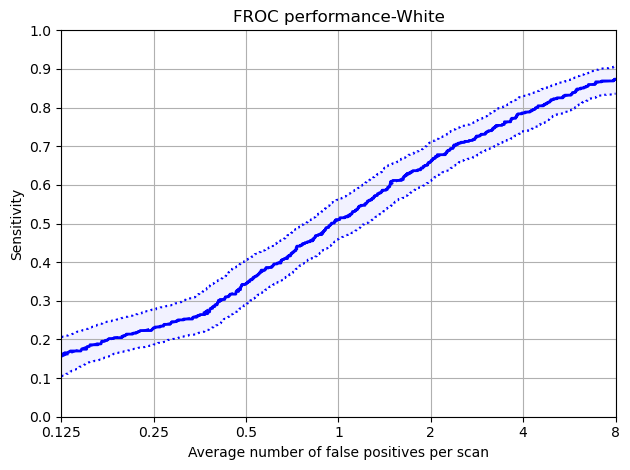

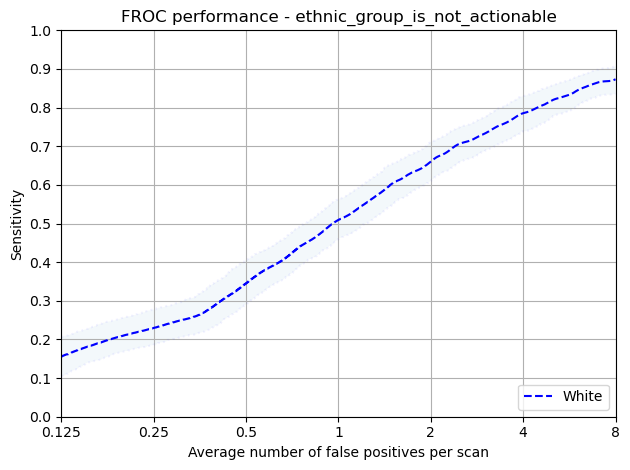

In [16]:
protected_group = 'ethnic_group_is_not_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)

### Actionable IMDRank

Protected Group: High_IMDRank_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,41.0,31.0,6.0,8.0,13.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp4w4c2648/annotations.csv
Total number of included nodule annotations: 264
Total number of nodule annotations: 264
Cases: 103


100%|██████████| 1000/1000 [00:04<00:00, 206.27it/s]


,0,159,476,1111,2381,4920,9999
0,0.099 (0.0 - 0.209),0.197 (0.095 - 0.299),0.294 (0.216 - 0.38),0.424 (0.354 - 0.496),0.554 (0.484 - 0.63),0.648 (0.579 - 0.718),0.766 (0.712 - 0.818)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.099,0.000,0.209
159,0.250,0.197,0.095,0.299
476,0.500,0.294,0.216,0.380
1111,1.000,0.424,0.354,0.496
2381,2.000,0.554,0.484,0.630
4920,4.000,0.648,0.579,0.718
9999,8.000,0.766,0.712,0.818


Mean Sensitivity: 0.43 Low Sensitivity: 0.35 High Sensitivity: 0.507


,True positives,224
0,False positives,2133.000
1,False negatives,40.000
2,True negatives,0.000
3,Total number of candidates,2359.000
4,Total number of nodules,264.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,2.000
7,Sensitivity,0.848
8,Average number of candidates per scan,22.903


Protected Group: Medium_IMDRank_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,47.0,24.0,6.0,8.0,15.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpupozeg9a/annotations.csv
Total number of included nodule annotations: 248
Total number of nodule annotations: 248
Cases: 103


100%|██████████| 1000/1000 [00:05<00:00, 196.82it/s]


,0,159,476,1111,2381,4920,9999
0,0.184 (0.111 - 0.262),0.24 (0.179 - 0.305),0.329 (0.243 - 0.408),0.436 (0.356 - 0.523),0.548 (0.47 - 0.627),0.67 (0.594 - 0.743),0.774 (0.708 - 0.832)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.184,0.111,0.262
159,0.250,0.240,0.179,0.305
476,0.500,0.329,0.243,0.408
1111,1.000,0.436,0.356,0.523
2381,2.000,0.548,0.470,0.627
4920,4.000,0.670,0.594,0.743
9999,8.000,0.774,0.708,0.832


Mean Sensitivity: 0.45 Low Sensitivity: 0.38 High Sensitivity: 0.529


,True positives,202
0,False positives,2267.000
1,False negatives,46.000
2,True negatives,0.000
3,Total number of candidates,2480.000
4,Total number of nodules,248.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,11.000
7,Sensitivity,0.815
8,Average number of candidates per scan,24.078


Protected Group: Low_IMDRank_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,37.0,37.0,9.0,6.0,11.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpvd4tytjd/annotations.csv
Total number of included nodule annotations: 252
Total number of nodule annotations: 252
Cases: 90


100%|██████████| 1000/1000 [00:04<00:00, 226.81it/s]


,0,159,476,1111,2381,4920,9999
0,0.175 (0.09 - 0.258),0.232 (0.167 - 0.308),0.306 (0.232 - 0.396),0.395 (0.321 - 0.485),0.493 (0.413 - 0.584),0.674 (0.598 - 0.753),0.789 (0.727 - 0.851)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.175,0.090,0.258
159,0.250,0.232,0.167,0.308
476,0.500,0.306,0.232,0.396
1111,1.000,0.395,0.321,0.485
2381,2.000,0.493,0.413,0.584
4920,4.000,0.674,0.598,0.753
9999,8.000,0.789,0.727,0.851


Mean Sensitivity: 0.44 Low Sensitivity: 0.36 High Sensitivity: 0.519


,True positives,217
0,False positives,1877.000
1,False negatives,35.000
2,True negatives,0.000
3,Total number of candidates,2110.000
4,Total number of nodules,252.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,16.000
7,Sensitivity,0.861
8,Average number of candidates per scan,23.444


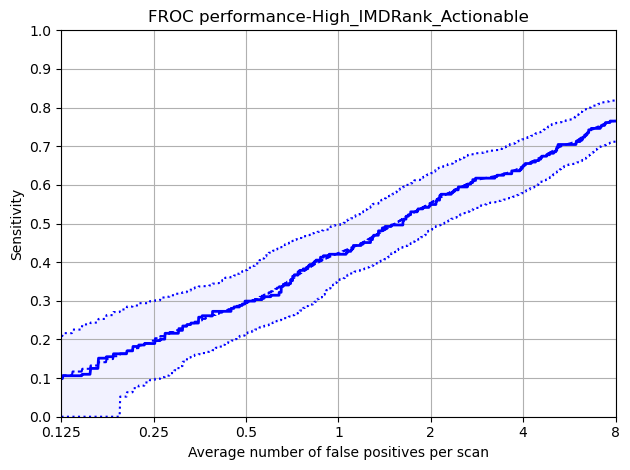

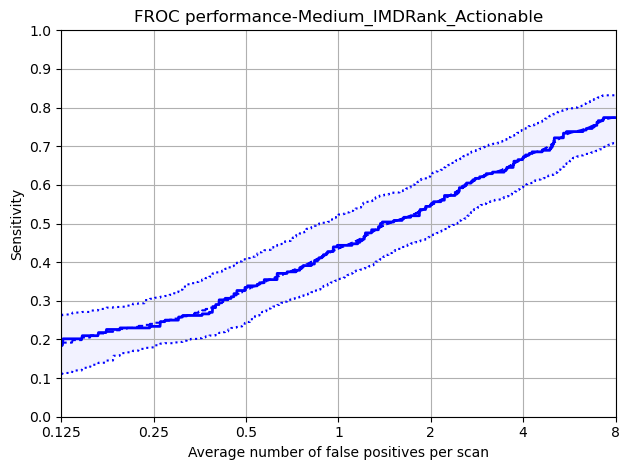

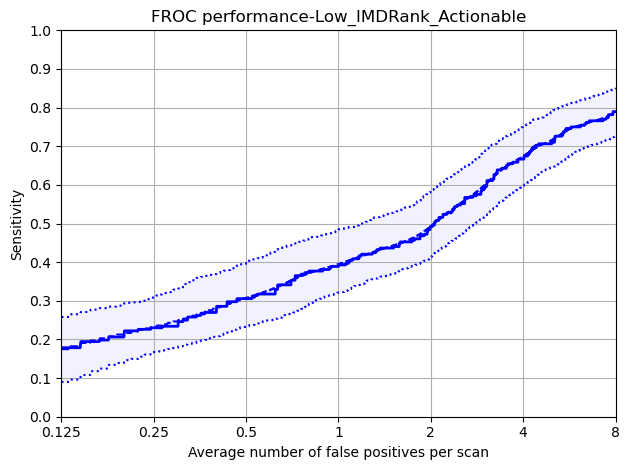

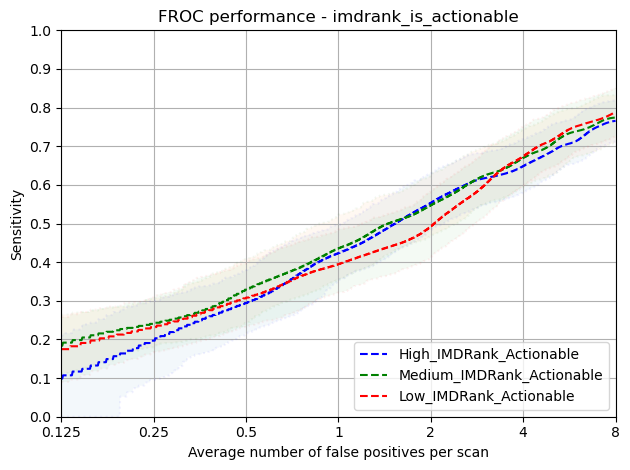

In [17]:
protected_group = 'imdrank_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)

### Actionable Smoking Status

Protected Group: High_Pack_Years_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,43.0,26.0,8.0,11.0,13.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpdgcozahr/annotations.csv
Total number of included nodule annotations: 255
Total number of nodule annotations: 255
Cases: 103


100%|██████████| 1000/1000 [00:04<00:00, 204.96it/s]


,0,159,476,1111,2381,4920,9999
0,0.158 (0.097 - 0.235),0.228 (0.156 - 0.296),0.3 (0.232 - 0.374),0.424 (0.357 - 0.492),0.531 (0.465 - 0.611),0.669 (0.607 - 0.739),0.813 (0.767 - 0.857)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.158,0.097,0.235
159,0.250,0.228,0.156,0.296
476,0.500,0.300,0.232,0.374
1111,1.000,0.424,0.357,0.492
2381,2.000,0.531,0.465,0.611
4920,4.000,0.669,0.607,0.739
9999,8.000,0.813,0.767,0.857


Mean Sensitivity: 0.45 Low Sensitivity: 0.38 High Sensitivity: 0.515


,True positives,222
0,False positives,2234.000
1,False negatives,33.000
2,True negatives,0.000
3,Total number of candidates,2467.000
4,Total number of nodules,255.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,11.000
7,Sensitivity,0.871
8,Average number of candidates per scan,23.951


Protected Group: Medium_Pack_Years_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,46.0,32.0,5.0,7.0,10.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp1wz_nh0u/annotations.csv
Total number of included nodule annotations: 242
Total number of nodule annotations: 242
Cases: 99


100%|██████████| 1000/1000 [00:04<00:00, 219.95it/s]


,0,159,476,1111,2381,4920,9999
0,0.227 (0.167 - 0.289),0.27 (0.202 - 0.344),0.346 (0.265 - 0.438),0.452 (0.374 - 0.535),0.553 (0.476 - 0.625),0.715 (0.639 - 0.788),0.794 (0.726 - 0.855)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.227,0.167,0.289
159,0.250,0.270,0.202,0.344
476,0.500,0.346,0.265,0.438
1111,1.000,0.452,0.374,0.535
2381,2.000,0.553,0.476,0.625
4920,4.000,0.715,0.639,0.788
9999,8.000,0.794,0.726,0.855


Mean Sensitivity: 0.48 Low Sensitivity: 0.41 High Sensitivity: 0.553


,True positives,203
0,False positives,1986.000
1,False negatives,39.000
2,True negatives,0.000
3,Total number of candidates,2198.000
4,Total number of nodules,242.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,9.000
7,Sensitivity,0.839
8,Average number of candidates per scan,22.202


Protected Group: Low_Pack_Years_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,37.0,34.0,8.0,6.0,16.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpmd6ipx_g/annotations.csv
Total number of included nodule annotations: 269
Total number of nodule annotations: 269
Cases: 95


100%|██████████| 1000/1000 [00:04<00:00, 226.73it/s]


,0,159,476,1111,2381,4920,9999
0,0.091 (0.0 - 0.202),0.179 (0.084 - 0.282),0.288 (0.192 - 0.377),0.382 (0.301 - 0.47),0.505 (0.419 - 0.599),0.616 (0.54 - 0.695),0.724 (0.66 - 0.788)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.091,0.000,0.202
159,0.250,0.179,0.084,0.282
476,0.500,0.288,0.192,0.377
1111,1.000,0.382,0.301,0.470
2381,2.000,0.505,0.419,0.599
4920,4.000,0.616,0.540,0.695
9999,8.000,0.724,0.660,0.788


Mean Sensitivity: 0.4 Low Sensitivity: 0.31 High Sensitivity: 0.488


,True positives,220
0,False positives,2074.000
1,False negatives,49.000
2,True negatives,0.000
3,Total number of candidates,2303.000
4,Total number of nodules,269.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,9.000
7,Sensitivity,0.818
8,Average number of candidates per scan,24.242


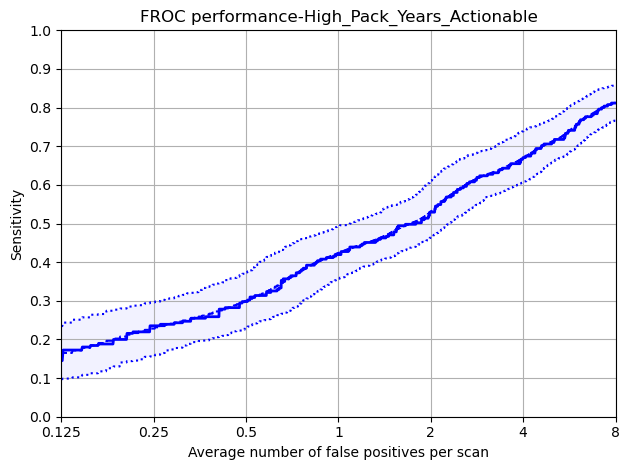

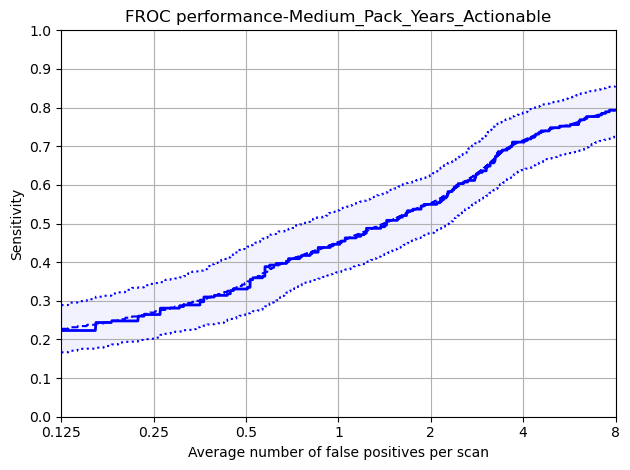

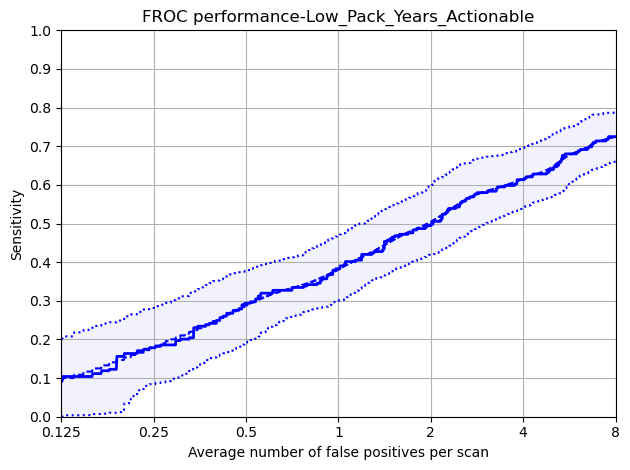

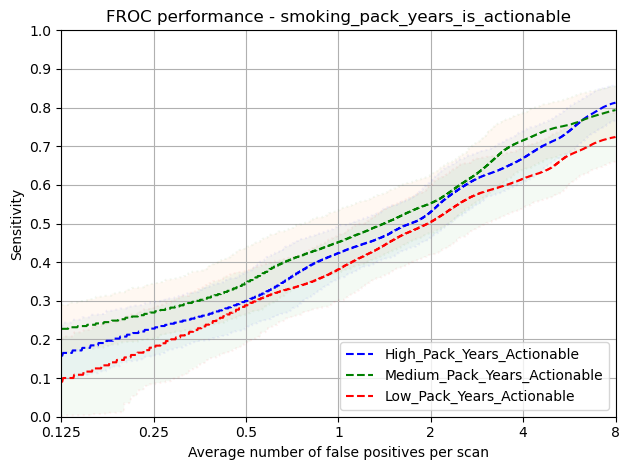

In [18]:
protected_group = 'smoking_pack_years_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)

### False positive and Miss Investigations

In [19]:
import importlib
import utils

importlib.reload(utils)

<module 'utils' from '/Users/john/Projects/SOTAEvaluationNoduleDetection/notebooks/FairnessInNoduleDetectionAlgorithms/utils.py'>

In [20]:
thresholds = utils.get_thresholds(grt123_summit_summit)
missed_metadata = utils.miss_anaysis_at_fpps(
    model='grt123',
    scans_metadata=scan_metadata,
    scans_path=f'{workspace_path}/metadata/summit/{flavour}/test_scans.csv',
    annotations_path=f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_metadata.csv',
    exclusions_path=f'{workspace_path}/data/summit/metadata/grt123_annotations_excluded_empty.csv',
    predictions_path=f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_predictions.csv',
    thresholds=thresholds
)


/Users/john/Projects/SOTAEvaluationNoduleDetection/models/grt123/bbox_result/trained_summit/summit/white_only/white_only_metadata.csv
Total number of included nodule annotations: 1218
Total number of nodule annotations: 1218
Cases: 899
Missed Annotations at 7.228441 FPPs: 1015
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/grt123/bbox_result/trained_summit/summit/white_only/white_only_metadata.csv
Total number of included nodule annotations: 1218
Total number of nodule annotations: 1218
Cases: 899
Missed Annotations at 6.7572556 FPPs: 926
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/grt123/bbox_result/trained_summit/summit/white_only/white_only_metadata.csv
Total number of included nodule annotations: 1218
Total number of nodule annotations: 1218
Cases: 899
Missed Annotations at 6.2456627 FPPs: 822
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/grt123/bbox_result/trained_summit/summit/white_only/white_only_metadata.csv
Total number of included nodule 

#### Incremental FROC Scores - Gender/ Ethnic Group/ Nodule Type

In [21]:

hit_and_miss_dict = utils.get_protected_group_by_nodule_type(missed_metadata)


In [22]:


recode_dict = {}
for idx in range(7):
    hmm = {}
    for slice in ['all','actionable']:
        for protected_group in ['MALE','FEMALE','All', 'Asian or Asian British', 'Black', 'White']:
            for type in ['SOLID','NON_SOLID','PART_SOLID','PERIFISSURAL','CALCIFIED']:
            
                try:

                    group = 'gender' if protected_group in ['MALE','FEMALE','All'] else 'ethnic_group'

                    total = hit_and_miss_dict[idx][slice][group][(True,type)][protected_group] + hit_and_miss_dict[idx][slice][group][(False,type)][protected_group]
                    hits = hit_and_miss_dict[idx][slice][group][(False,type)][protected_group]
                    perc_hits = round(100 * (hits/total),0)

                    hmm[f'{slice}_{protected_group}_{type}_Hits%'] = perc_hits
                except:
                    print(f'Error: {idx}, {slice}, {protected_group}, {type}')
                    pass

    recode_dict[idx] = hmm

df = pd.DataFrame.from_dict(recode_dict, orient='index')

# Remove ".0" from each value in the dataframe
df = df.applymap(lambda x: str(x).replace('.0', ''))

# Collapse each column into comma-delimited values
collapsed_df = df.apply(lambda x: ', '.join(x), axis=0)

display(collapsed_df)

from scipy.stats import shapiro, ttest_ind, mannwhitneyu

def calculate_significant_differences(df, group1_name, group2_name):

    if group1_name not in df.columns or group2_name not in df.columns:
        print(f'Error: {group1_name} or {group2_name} not in dataframe')
        return

    group1 = df[group1_name].astype(int).values
    group2 = df[group2_name].astype(int).values

    shapiro_group1 = shapiro(group1)
    shapiro_group2 = shapiro(group2)

    print('*'*50)
    if shapiro_group1[1] > 0.05 and shapiro_group2[1] > 0.05:
        t_test = ttest_ind(group1, group2)
        print(f'Independent T-Test: {round(t_test.statistic,3)}, {round(t_test.pvalue,3)}')
    else:
        manwhitney = mannwhitneyu(group1, group2)
        print(f'Mann-Whitney U Test: {round(manwhitney.statistic,3)}, {round(manwhitney.pvalue,3)}')

for type in ['SOLID','NON_SOLID','PART_SOLID','PERIFISSURAL','CALCIFIED']:

    print(f'*** {type} ***')
    group1 = f'all_White_{type}_Hits%'
    group2 = f'all_Asian or Asian British_{type}_Hits%'
    calculate_significant_differences(df, group1, group2)

Error: 0, all, Asian or Asian British, SOLID
Error: 0, all, Asian or Asian British, NON_SOLID
Error: 0, all, Asian or Asian British, PART_SOLID
Error: 0, all, Asian or Asian British, PERIFISSURAL
Error: 0, all, Asian or Asian British, CALCIFIED
Error: 0, all, Black, SOLID
Error: 0, all, Black, NON_SOLID
Error: 0, all, Black, PART_SOLID
Error: 0, all, Black, PERIFISSURAL
Error: 0, all, Black, CALCIFIED
Error: 0, actionable, Asian or Asian British, SOLID
Error: 0, actionable, Asian or Asian British, NON_SOLID
Error: 0, actionable, Asian or Asian British, PART_SOLID
Error: 0, actionable, Asian or Asian British, PERIFISSURAL
Error: 0, actionable, Asian or Asian British, CALCIFIED
Error: 0, actionable, Black, SOLID
Error: 0, actionable, Black, NON_SOLID
Error: 0, actionable, Black, PART_SOLID
Error: 0, actionable, Black, PERIFISSURAL
Error: 0, actionable, Black, CALCIFIED
Error: 1, all, Asian or Asian British, SOLID
Error: 1, all, Asian or Asian British, NON_SOLID
Error: 1, all, Asian or As

all_MALE_SOLID_Hits%                    34, 44, 50, 59, 70, 80, 89
all_MALE_NON_SOLID_Hits%                10, 13, 13, 21, 36, 44, 46
all_MALE_PART_SOLID_Hits%               25, 30, 35, 40, 55, 65, 80
all_MALE_PERIFISSURAL_Hits%             11, 20, 28, 49, 61, 76, 87
all_MALE_CALCIFIED_Hits%                   9, 9, 9, 12, 38, 59, 69
all_FEMALE_SOLID_Hits%                  21, 27, 38, 50, 62, 76, 83
all_FEMALE_NON_SOLID_Hits%                4, 4, 13, 22, 43, 52, 52
all_FEMALE_PART_SOLID_Hits%             30, 36, 58, 64, 67, 70, 73
all_FEMALE_PERIFISSURAL_Hits%            9, 17, 28, 40, 57, 71, 83
all_FEMALE_CALCIFIED_Hits%              14, 17, 20, 31, 40, 45, 55
all_All_SOLID_Hits%                     28, 36, 45, 55, 66, 78, 86
all_All_NON_SOLID_Hits%                  8, 10, 13, 21, 39, 47, 48
all_All_PART_SOLID_Hits%                28, 34, 49, 55, 62, 68, 75
all_All_PERIFISSURAL_Hits%              10, 18, 28, 45, 59, 74, 85
all_All_CALCIFIED_Hits%                 12, 14, 16, 25, 39, 49

*** SOLID ***
Error: all_White_SOLID_Hits% or all_Asian or Asian British_SOLID_Hits% not in dataframe
*** NON_SOLID ***
Error: all_White_NON_SOLID_Hits% or all_Asian or Asian British_NON_SOLID_Hits% not in dataframe
*** PART_SOLID ***
Error: all_White_PART_SOLID_Hits% or all_Asian or Asian British_PART_SOLID_Hits% not in dataframe
*** PERIFISSURAL ***
Error: all_White_PERIFISSURAL_Hits% or all_Asian or Asian British_PERIFISSURAL_Hits% not in dataframe
*** CALCIFIED ***
Error: all_White_CALCIFIED_Hits% or all_Asian or Asian British_CALCIFIED_Hits% not in dataframe


#### Nodule Characteristic Analysis

,RIGHT,LEFT,NOT_ANSWERED
0.125,0.19,0.14,0.14
0.25,0.28,0.19,0.22
0.5,0.37,0.27,0.29
1,0.49,0.42,0.42
2,0.61,0.57,0.56
4,0.73,0.70,0.69
8,0.83,0.80,0.80
Total Annotations,623.00,398.00,197.00


,UPPER,NOT-UPPER,NOT_ANSWERED
0.125,0.13,0.20,0.14
0.25,0.18,0.29,0.22
0.5,0.28,0.37,0.29
1,0.40,0.52,0.42
2,0.54,0.64,0.56
4,0.67,0.76,0.69
8,0.77,0.85,0.80
Total Annotations,439.00,582.00,197.00


,SOLID,NON_SOLID,PART_SOLID,PERIFISSURAL,CALCIFIED
0.125,0.28,0.08,0.28,0.10,0.12
0.25,0.36,0.10,0.34,0.18,0.14
0.5,0.45,0.13,0.49,0.28,0.16
1,0.55,0.21,0.55,0.45,0.25
2,0.66,0.39,0.62,0.59,0.39
4,0.78,0.47,0.68,0.74,0.49
8,0.86,0.48,0.75,0.85,0.60
Total Annotations,384.00,62.00,53.00,622.00,97.00


,RANDOMISATION_AT_YEAR_1,ALWAYS_SCAN_AT_YEAR_1,3_MONTH_FOLLOW_UP_SCAN,URGENT_REFERRAL
0.125,0.10,0.08,0.28,0.57
0.25,0.18,0.10,0.35,0.59
0.5,0.28,0.13,0.43,0.65
1,0.45,0.21,0.51,0.70
2,0.59,0.39,0.61,0.73
4,0.74,0.47,0.70,0.78
8,0.86,0.48,0.78,0.81
Total Annotations,771.00,62.00,348.00,37.00


diameter_cats,00-04,04-08,08-15,15-20,20-30,30-40,40-999
0.125,0.00,0.10,0.31,0.37,0.38,0.22,1.0
0.25,0.00,0.18,0.42,0.45,0.38,0.22,1.0
0.5,0.02,0.28,0.49,0.50,0.49,0.33,1.0
1,0.17,0.44,0.59,0.61,0.49,0.44,1.0
2,0.29,0.59,0.69,0.71,0.59,0.56,1.0
4,0.39,0.74,0.79,0.74,0.69,0.78,1.0
8,0.57,0.84,0.86,0.79,0.74,0.89,1.0
Total Annotations,121.00,684.00,322.00,38.00,39.00,9.00,3.0


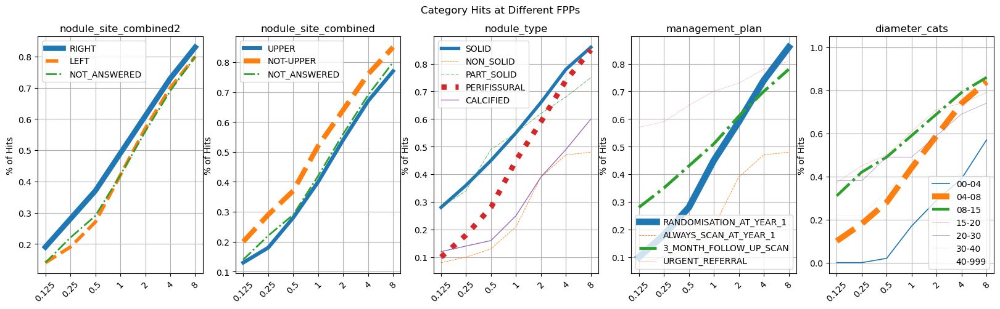

In [23]:
fig, ax = plt.subplots(1, 5, figsize=(20, 5))

nodule_characteristics = {
    'nodule_site_combined2': ['RIGHT', 'LEFT', 'NOT_ANSWERED'],
    'nodule_site_combined': ['UPPER','NOT-UPPER', 'NOT_ANSWERED'],
    'nodule_type': ['SOLID', 'NON_SOLID', 'PART_SOLID', 'PERIFISSURAL', 'CALCIFIED'],
    'management_plan': ['RANDOMISATION_AT_YEAR_1','ALWAYS_SCAN_AT_YEAR_1', '3_MONTH_FOLLOW_UP_SCAN', 'URGENT_REFERRAL'],
    'diameter_cats': diameter_lbs,
}

for ivx, (var, order) in enumerate(nodule_characteristics.items()):
    annotations = pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_metadata.csv')
    # annotations = annotations[annotations['management_plan'] != 'RANDOMISATION_AT_YEAR_1']

    total_vc = annotations[var].value_counts().sort_index().rename('Total Annotations')

    operating_points = ['0.125', '0.25', '0.5', '1', '2', '4', '8']

    results = []

    for idx, metadata in enumerate(missed_metadata):
        results.append(
            pd.crosstab(
                metadata[var], 
                metadata['miss'],
                normalize='index'
            )[False]
            .rename(f'{operating_points[idx]}')
            .reindex(order)
            
        )

    df = pd.concat(results, axis=1).fillna(0).round(2).merge(total_vc.to_frame(), left_index=True, right_index=True)

    display(df.T)


    line_styles = ['-', '--', '-.', ':', '-', '--', '-.']
    weights = df.pop('Total Annotations')

    for isx, column in enumerate(df.T):    
            ax[ivx].plot(df.T[column], label=column, linestyle=line_styles[isx], linewidth=weights[isx]/100)
    
    ax[ivx].set_xticklabels(labels=df.columns, rotation=45)
    ax[ivx].set_title(var)
    ax[ivx].legend()
    ax[ivx].set_ylabel('% of Hits')
    ax[ivx].grid(visible=True, which='both')

plt.suptitle('Category Hits at Different FPPs')
plt.show()

In [24]:
missed_at_lowest = missed_metadata[0]
hits = missed_at_lowest[missed_at_lowest['miss'] == False]

(
    pd.crosstab(
        [
            hits['diameter_cats'],
            hits['nodule_type']
        ], 
        hits['nodule_site_combined'],
        normalize='all'
    )[['UPPER','NOT-UPPER']]
    .apply(lambda x: round(100 * x, 1))
)

nodule_site_combined        UPPER  NOT-UPPER
diameter_cats nodule_type                   
04-08         CALCIFIED       0.0        0.5
              PART_SOLID      0.5        0.0
              PERIFISSURAL    0.5       10.3
              SOLID           4.9       10.8
08-15         CALCIFIED       1.0        1.0
              NON_SOLID       0.0        1.5
              PART_SOLID      1.0        0.0
              PERIFISSURAL    2.0       10.3
              SOLID          10.3       16.7
15-20         CALCIFIED       1.0        0.0
              PART_SOLID      2.0        1.0
              PERIFISSURAL    0.0        0.0
              SOLID           0.5        1.5
20-30         CALCIFIED       0.5        0.0
              NON_SOLID       0.5        0.0
              PART_SOLID      1.0        1.0
              SOLID           1.5        2.5
30-40         NON_SOLID       0.0        0.0
              SOLID           0.5        0.0
40-999        SOLID           0.5        1.0

In [25]:
thresholds = get_thresholds(grt123_summit_summit)

scans = pd.read_csv(f'{workspace_path}/metadata/summit/{flavour}/test_scans.csv')
predictions = pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_predictions.csv')
annotations = pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_metadata.csv')

false_positives_fpps = false_positive_analysis(
    thresholds=thresholds,    
    predictions=predictions,
    annotations=annotations
)

predictions: 314 at threshold: 7.228441
distance false positives: 111 at threshold: 7.228441
predictions: 516 at threshold: 6.7572556
distance false positives: 224 at threshold: 6.7572556
predictions: 845 at threshold: 6.2456627
distance false positives: 449 at threshold: 6.2456627
predictions: 1459 at threshold: 5.6314945
distance false positives: 899 at threshold: 5.6314945
predictions: 2519 at threshold: 4.7385654
distance false positives: 1798 at threshold: 4.7385654
predictions: 4473 at threshold: 3.4896648
distance false positives: 3598 at threshold: 3.4896648
predictions: 8078 at threshold: 1.7281716
distance false positives: 7077 at threshold: 1.7281716


#### Examples of False Positives

summit-8824-ktj_Y0_BASELINE_A already exists
[[161.64        54.0500061   66.4799939    5.28515429]
 [ 98.28       135.4900061   32.0499939    8.12109075]
 [ 78.42        35.4000061  234.0699939    8.12109075]
 [105.97       156.0700061  221.0799939    3.09374886]]
summit-8824-ktj_Y0_BASELINE_A - 81.32979 133.36847 197.6423 25.65062
False Positive: True
IoU False Positive: 0.0015110671586869092


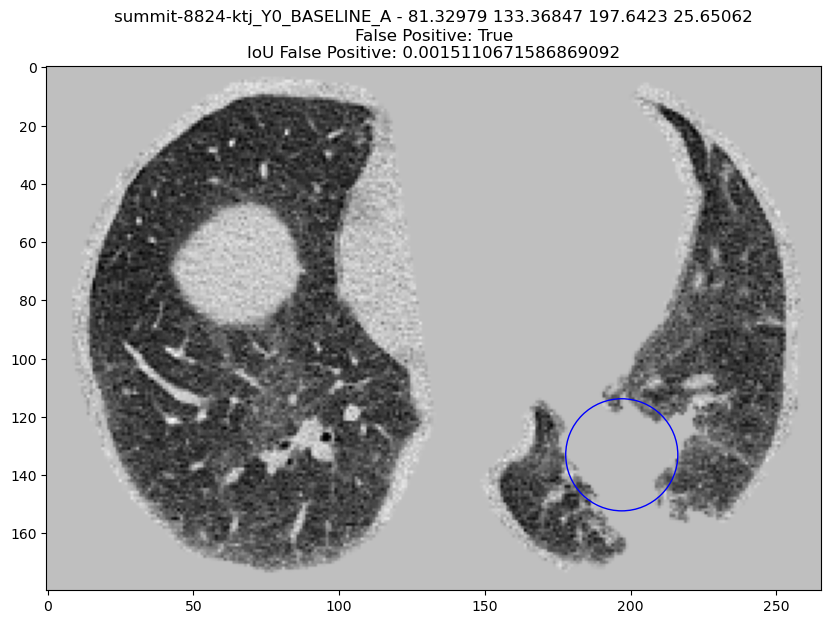

summit-8795-gkd_Y0_BASELINE_A already exists
[[0 0 0 0]]
summit-8795-gkd_Y0_BASELINE_A - 161.42075 53.305885 125.44918 24.608696
False Positive: True
IoU False Positive: nan


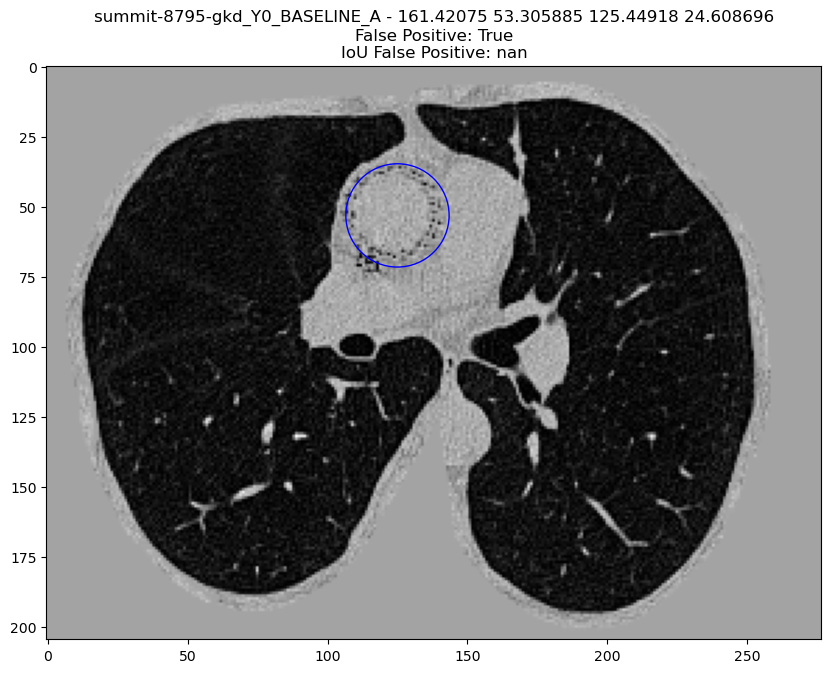

summit-9652-dzk_Y0_BASELINE_A already exists
[[ 85.865      189.16000305  45.86000305   6.0839865 ]
 [209.515      193.44000305 208.71000305   4.30664213]
 [ 55.435      117.11000305 294.88000305   7.04101808]
 [172.485      197.65000305  90.80000305   9.09180005]
 [119.045       30.35000305  79.01000305   3.96484513]
 [ 78.035      121.58000305 294.46000305   3.75976694]]
summit-9652-dzk_Y0_BASELINE_A - 157.42068 165.43137 197.71623 26.093346
False Positive: True
IoU False Positive: 0.0


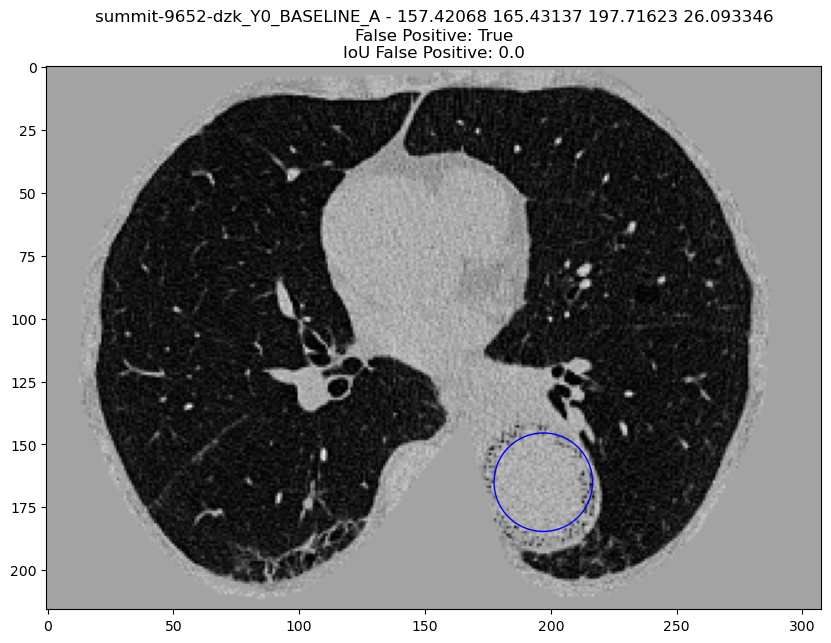

summit-9652-dzk_Y0_BASELINE_A already exists
[[ 85.865      189.16000305  45.86000305   6.0839865 ]
 [209.515      193.44000305 208.71000305   4.30664213]
 [ 55.435      117.11000305 294.88000305   7.04101808]
 [172.485      197.65000305  90.80000305   9.09180005]
 [119.045       30.35000305  79.01000305   3.96484513]
 [ 78.035      121.58000305 294.46000305   3.75976694]]
summit-9652-dzk_Y0_BASELINE_A - 197.44072 137.4564 177.66301 25.552605
False Positive: True
IoU False Positive: 0.0


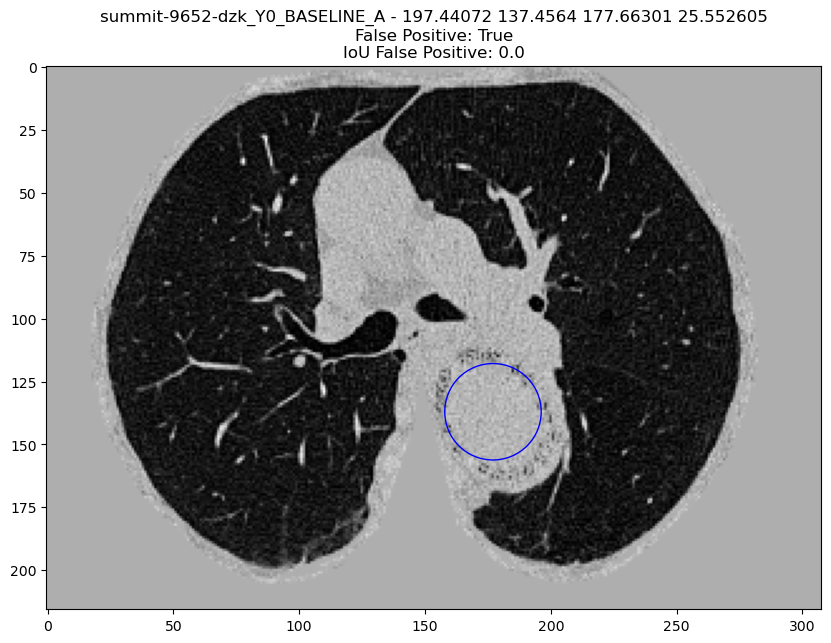

summit-9652-dzk_Y0_BASELINE_A already exists
[[ 85.865      189.16000305  45.86000305   6.0839865 ]
 [209.515      193.44000305 208.71000305   4.30664213]
 [ 55.435      117.11000305 294.88000305   7.04101808]
 [172.485      197.65000305  90.80000305   9.09180005]
 [119.045       30.35000305  79.01000305   3.96484513]
 [ 78.035      121.58000305 294.46000305   3.75976694]]
summit-9652-dzk_Y0_BASELINE_A - 229.47484 117.38738 161.61928 25.377777
False Positive: True
IoU False Positive: 0.0


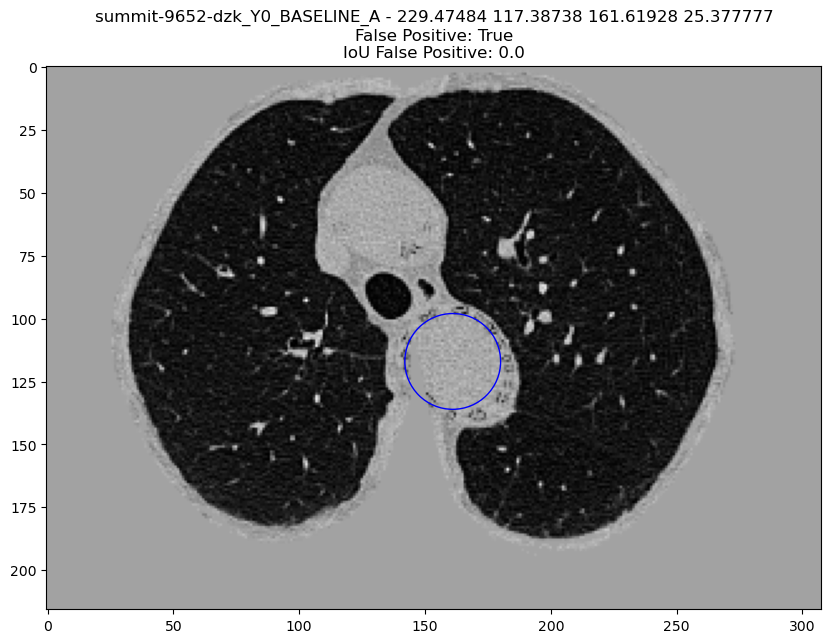

summit-9652-dzk_Y0_BASELINE_A already exists
[[ 85.865      189.16000305  45.86000305   6.0839865 ]
 [209.515      193.44000305 208.71000305   4.30664213]
 [ 55.435      117.11000305 294.88000305   7.04101808]
 [172.485      197.65000305  90.80000305   9.09180005]
 [119.045       30.35000305  79.01000305   3.96484513]
 [ 78.035      121.58000305 294.46000305   3.75976694]]
summit-9652-dzk_Y0_BASELINE_A - 117.44938 165.52028 201.70337 25.764578
False Positive: True
IoU False Positive: 0.0


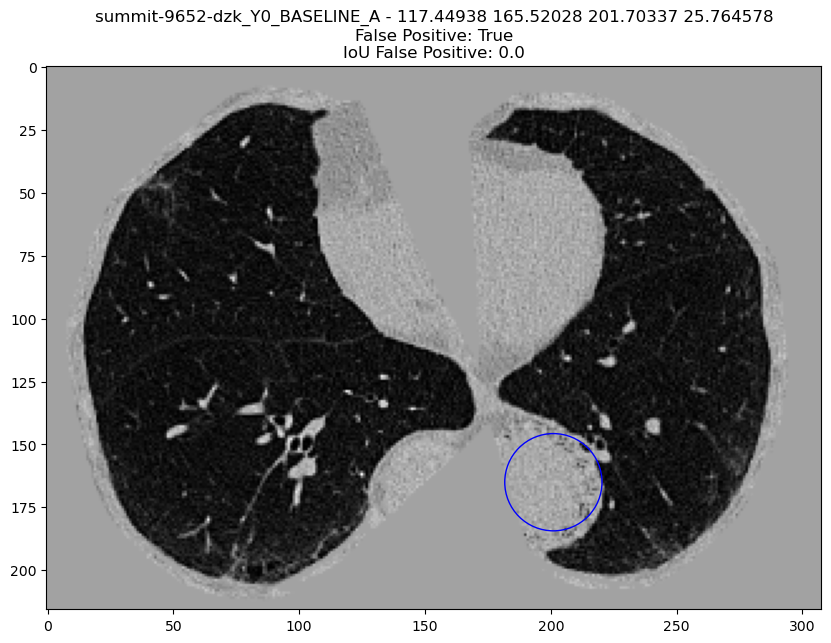

summit-9652-dzk_Y0_BASELINE_A already exists
[[ 85.865      189.16000305  45.86000305   6.0839865 ]
 [209.515      193.44000305 208.71000305   4.30664213]
 [ 55.435      117.11000305 294.88000305   7.04101808]
 [172.485      197.65000305  90.80000305   9.09180005]
 [119.045       30.35000305  79.01000305   3.96484513]
 [ 78.035      121.58000305 294.46000305   3.75976694]]
summit-9652-dzk_Y0_BASELINE_A - 177.44371 153.50923 189.72955 25.979664
False Positive: True
IoU False Positive: 0.0


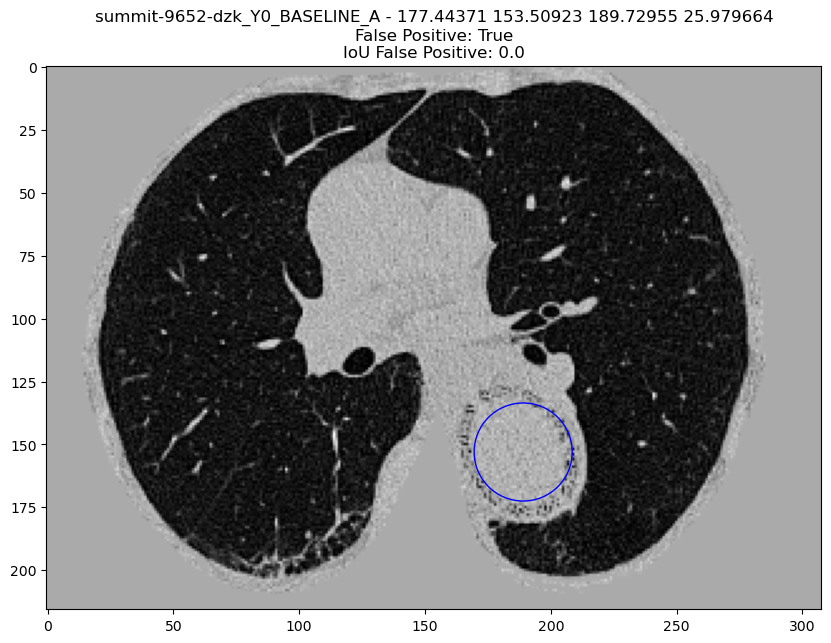

summit-9677-vce_Y0_BASELINE_A already exists
[[166.925      170.11        61.1700061    7.12968493]]
summit-9677-vce_Y0_BASELINE_A - 61.46758 201.43488 61.54931 25.0159
False Positive: True
IoU False Positive: 0.0


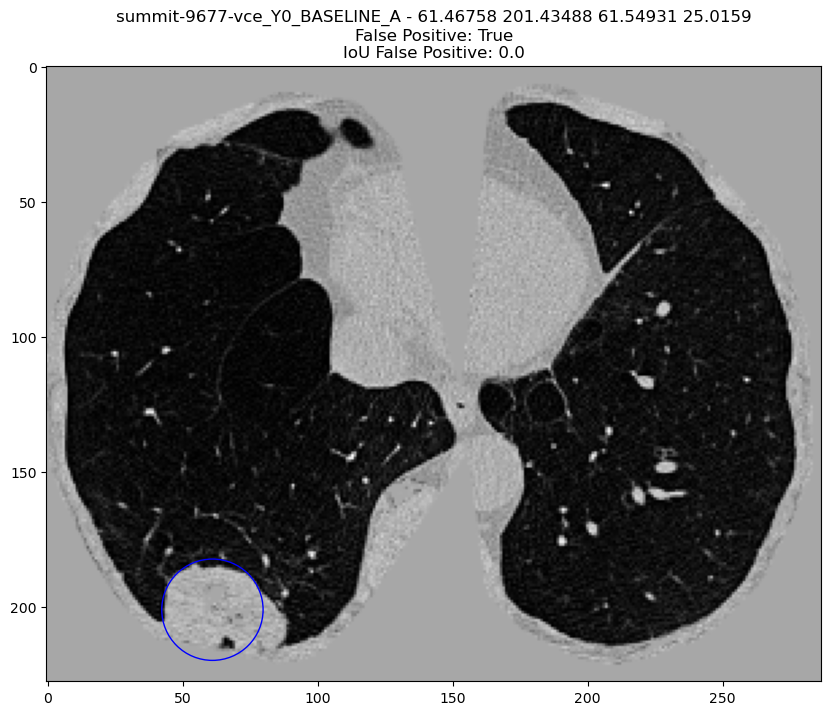

None
[[269.725      151.44       128.0399939    8.32500458]
 [123.215      139.94        48.9399939    4.35761958]
 [110.845      100.59        49.6599939    4.16250229]
 [107.395      161.2        257.8699939    8.84531736]
 [ 93.495      193.46        57.6699939    5.59336245]
 [181.835       40.02        99.1599939   17.49551743]]
summit-8656-vbc_Y0_BASELINE_A - 153.65442 41.365387 89.42342 24.351574
False Positive: True
IoU False Positive: 0.0


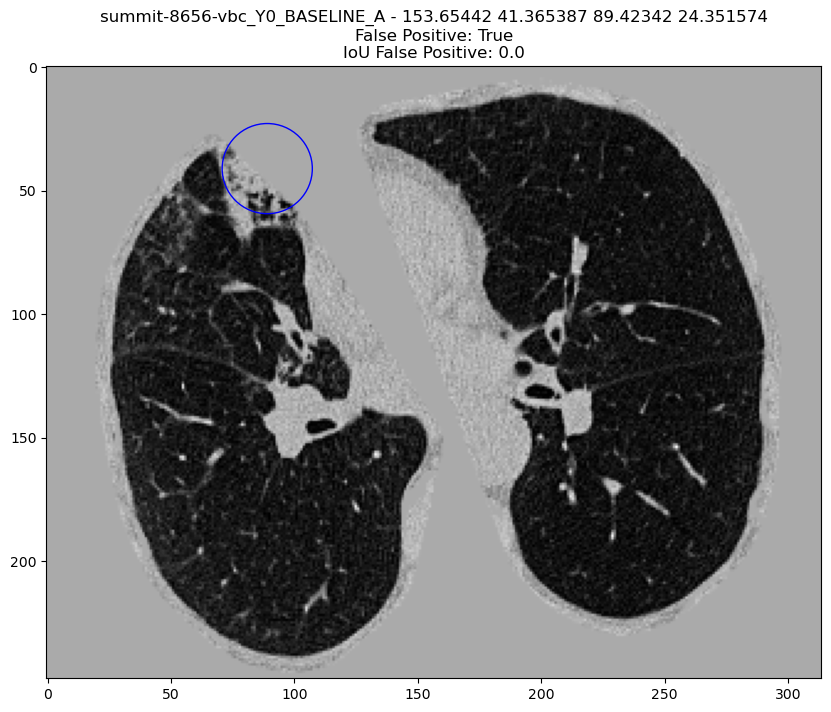

None
[[0 0 0 0]]
summit-8777-dhu_Y0_BASELINE_A - 61.488102 117.491486 81.62345 25.06675
False Positive: True
IoU False Positive: nan


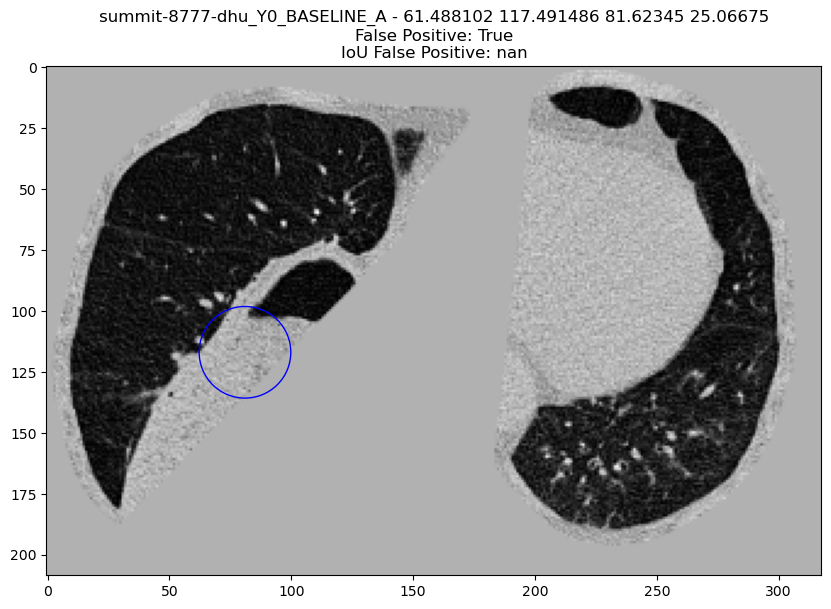

None
[[155.665       63.46       209.3099939    3.96484513]
 [181.015       93.42        49.9399939    5.12695491]
 [187.235      151.25        39.9099939    4.71679852]
 [191.335      150.01       222.6299939    8.95508125]
 [150.635      207.65        89.2699939    4.03320453]
 [151.075      189.55        41.6299939    8.06640906]
 [ 95.035      155.55       234.7499939    8.75000305]
 [239.835      159.1        206.3099939    4.92187672]
 [227.035      168.8        187.6399939    4.30664213]
 [215.825      149.55        54.5099939    6.1523459 ]
 [201.605      173.88        72.7599939   12.50976999]
 [202.555       93.67        77.8699939    3.75976694]
 [117.145      187.31        50.5399939    4.30664213]]
summit-8843-tgv_Y0_BASELINE_A - 89.677826 157.32695 233.39632 21.81539
False Positive: True
IoU False Positive: 0.0


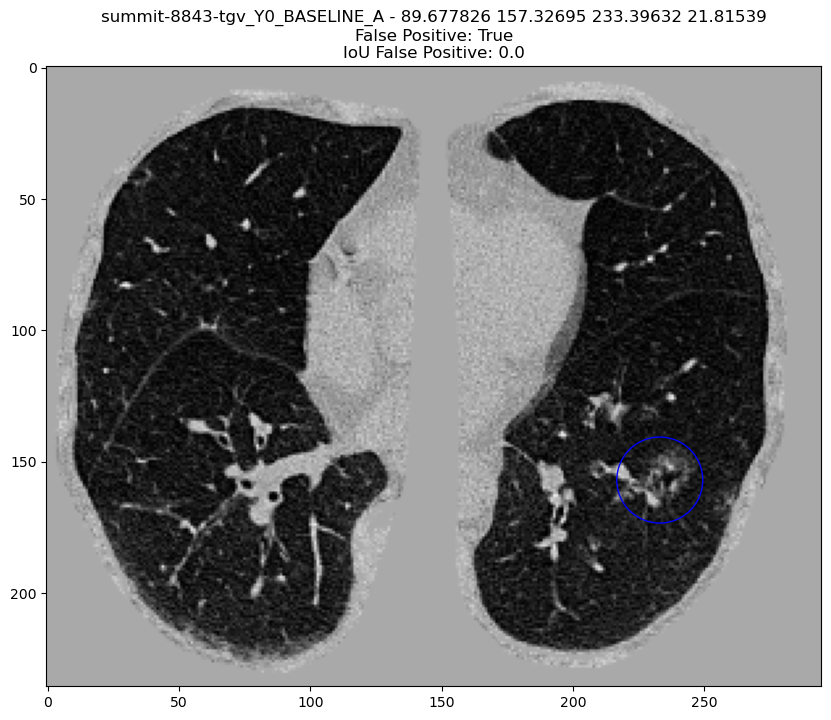

None
[[124.38       172.2         61.2699939    3.8373068 ]
 [131.7        163.64        42.1199939    3.25195491]
 [ 87.74        33.08        46.9999939    4.74785417]
 [100.          74.92       265.0599939    3.51211131]]
summit-9829-vrp_Y0_BASELINE_A - 41.65703 145.36221 77.42609 22.887589
False Positive: True
IoU False Positive: 0.0


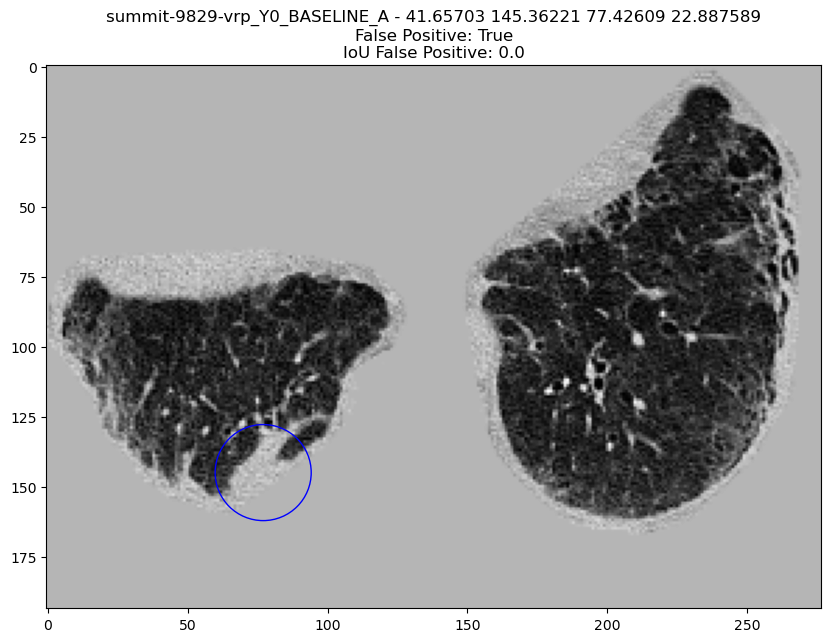

In [26]:
cnt = 0

df = false_positives_fpps['0.125']

for idx, row in df[df.distance_false_positive].sort_values(by='threshold', ascending=False).iterrows():
    study_id = row['name']
    x = row['row']
    y = row['col']
    z = row['index']
    diameter = row['diameter']
    

    copy_scan_from_cluster(study_id)
    show_numpy_candidate_location(study_id, x, y, z, diameter, row.distance_false_positive, row.iou_false_positive)
    cnt+=1
    if cnt == 12:
        break

## MONAI Detection

/Users/john/Projects/SOTAEvaluationNoduleDetection/models/detection/result/trained_summit/summit/white_only/result_white_only.json
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/detection/result/trained_summit/summit/white_only/annotations.csv
Total number of included nodule annotations: 1218
Total number of nodule annotations: 1218
Cases: 899
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-8739-emz_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [01:25<00:00, 11.73it/s]


,0,159,476,1111,2381,4920,9999
0,0.21 (0.177 - 0.243),0.304 (0.266 - 0.343),0.429 (0.389 - 0.472),0.587 (0.544 - 0.629),0.724 (0.686 - 0.759),0.833 (0.805 - 0.858),0.903 (0.883 - 0.922)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.210,0.177,0.243
159,0.250,0.304,0.266,0.343
476,0.500,0.429,0.389,0.472
1111,1.000,0.587,0.544,0.629
2381,2.000,0.724,0.686,0.759
4920,4.000,0.833,0.805,0.858
9999,8.000,0.903,0.883,0.922


Mean Sensitivity: 0.57 Low Sensitivity: 0.54 High Sensitivity: 0.604


,True positives,1177
0,False positives,31654.000
1,False negatives,41.000
2,True negatives,0.000
3,Total number of candidates,33756.000
4,Total number of nodules,1218.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,926.000
7,Sensitivity,0.966
8,Average number of candidates per scan,37.548


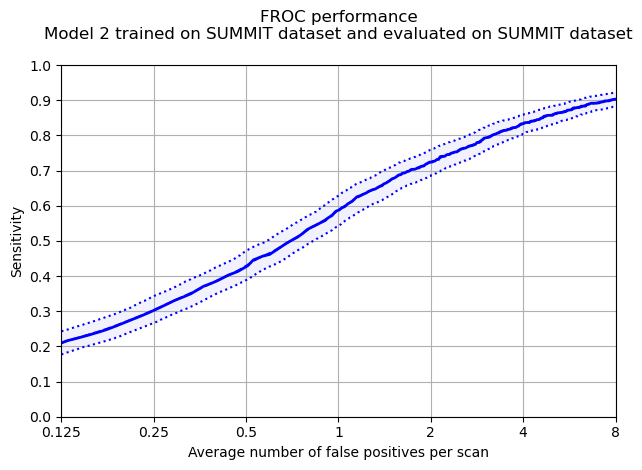

In [27]:

detection_predictions_path = combine_predictions(f'{workspace_path}/models/detection/result/trained_summit/summit/{flavour}', 'test')
detection_predictions = pd.read_csv(detection_predictions_path)

annotations = (
    pd.read_csv(f'{workspace_path}/metadata/summit/{flavour}/test_metadata.csv')
    .assign(name=lambda df: df.participant_id + '_Y0_BASELINE_A')
    .assign(row=lambda df: df['nodule_x_coordinate'])
    .assign(col=lambda df: df['nodule_y_coordinate'])
    .assign(index=lambda df: df['nodule_z_coordinate'])
    .assign(diameter=lambda df: df['nodule_diameter_mm'])
    .assign(diameter_cats=lambda df: pd.cut(
        df['nodule_diameter_mm'],
        bins=diameter_cats,
        labels=diameter_lbs
    ))
    .assign(nodule_site_combined=lambda df: df['nodule_site'].apply(combine_site))
    .assign(nodule_site_combined2=lambda df: df['nodule_site'].apply(combine_site2))
)

annotations.to_csv(f'{workspace_path}/models/detection/result/trained_summit/summit/{flavour}/annotations.csv', index=False)

detection_summit_summit = noduleCADEvaluation(
    annotations_filename=f'{workspace_path}/models/detection/result/trained_summit/summit/{flavour}/annotations.csv',
    annotations_excluded_filename=f'{workspace_path}/data/summit/metadata/annotations_excluded_empty.csv',
    seriesuids_filename=f'{workspace_path}/metadata/summit/{flavour}/test_scans.csv',
    results_filename=detection_predictions_path,
    filter='\nModel 2 trained on SUMMIT dataset and evaluated on SUMMIT dataset\n',
    outputDir=f'{workspace_path}/results/detection/trained_summit/summit/{flavour}',
)
caluclate_cpm_from_bootstrapping(f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/froc_predictions_bootstrapping.csv')
show_metrics(f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/CADAnalysis.txt')


### Gender analysis

Protected Group: MALE


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,31.0,55.0,3.0,6.0,5.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpuwm0k8tq/annotations.csv
Total number of included nodule annotations: 650
Total number of nodule annotations: 650
Cases: 492


100%|██████████| 1000/1000 [00:41<00:00, 24.19it/s]


,0,159,476,1111,2381,4920,9999
0,0.241 (0.193 - 0.292),0.326 (0.28 - 0.38),0.435 (0.381 - 0.491),0.58 (0.525 - 0.635),0.728 (0.674 - 0.779),0.84 (0.802 - 0.876),0.905 (0.877 - 0.934)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.241,0.193,0.292
159,0.250,0.326,0.280,0.380
476,0.500,0.435,0.381,0.491
1111,1.000,0.580,0.525,0.635
2381,2.000,0.728,0.674,0.779
4920,4.000,0.840,0.802,0.876
9999,8.000,0.905,0.877,0.934


Mean Sensitivity: 0.58 Low Sensitivity: 0.53 High Sensitivity: 0.627


,True positives,628
0,False positives,18532.000
1,False negatives,22.000
2,True negatives,0.000
3,Total number of candidates,19629.000
4,Total number of nodules,650.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,469.000
7,Sensitivity,0.966
8,Average number of candidates per scan,39.896


Protected Group: FEMALE


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,31.0,47.0,6.0,4.0,12.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpet1vizn0/annotations.csv
Total number of included nodule annotations: 551
Total number of nodule annotations: 551
Cases: 397
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-8739-emz_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:28<00:00, 35.41it/s]


,0,159,476,1111,2381,4920,9999
0,0.169 (0.123 - 0.217),0.273 (0.217 - 0.332),0.423 (0.367 - 0.48),0.609 (0.549 - 0.669),0.724 (0.673 - 0.774),0.826 (0.784 - 0.869),0.896 (0.864 - 0.926)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.169,0.123,0.217
159,0.250,0.273,0.217,0.332
476,0.500,0.423,0.367,0.480
1111,1.000,0.609,0.549,0.669
2381,2.000,0.724,0.673,0.774
4920,4.000,0.826,0.784,0.869
9999,8.000,0.896,0.864,0.926


Mean Sensitivity: 0.56 Low Sensitivity: 0.51 High Sensitivity: 0.61


,True positives,532
0,False positives,12738.000
1,False negatives,19.000
2,True negatives,0.000
3,Total number of candidates,13714.000
4,Total number of nodules,551.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,445.000
7,Sensitivity,0.966
8,Average number of candidates per scan,34.544


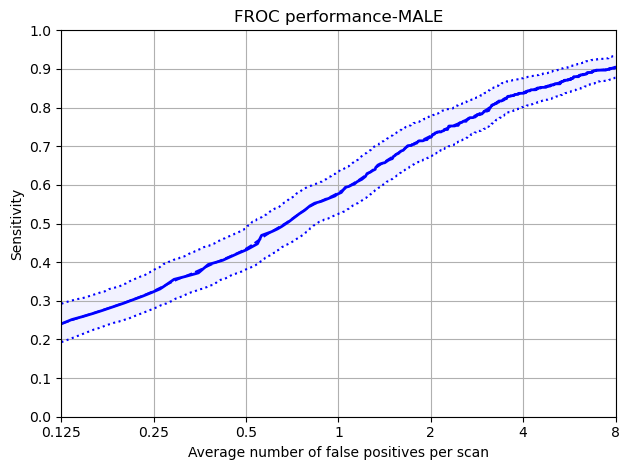

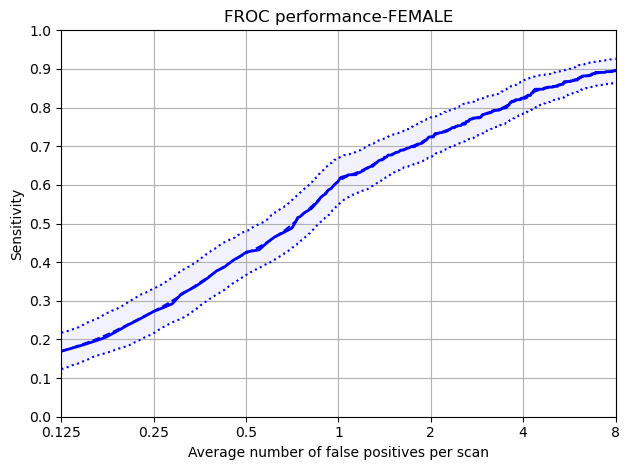

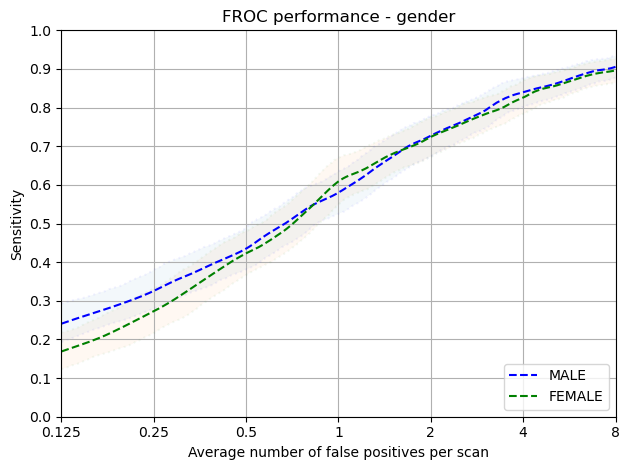

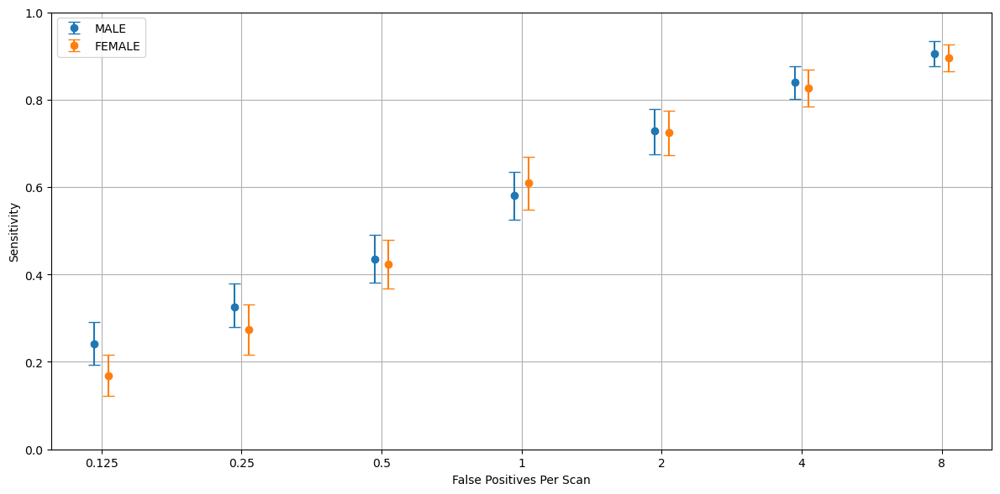

In [28]:


annotations = pd.read_csv(f'{workspace_path}/models/detection/result/trained_summit/summit/{flavour}/annotations.csv')

predictions = pd.read_csv(detection_predictions_path)

protected_group = 'gender'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('detection', flavour, 'Gender', data_dict)

### Age analysis

Protected Group: 70-75


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,33.0,53.0,4.0,3.0,7.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpeeexool2/annotations.csv
Total number of included nodule annotations: 339
Total number of nodule annotations: 339
Cases: 237


100%|██████████| 1000/1000 [00:19<00:00, 50.98it/s]


,0,159,476,1111,2381,4920,9999
0,0.222 (0.164 - 0.285),0.292 (0.232 - 0.358),0.418 (0.333 - 0.504),0.599 (0.519 - 0.679),0.737 (0.677 - 0.794),0.836 (0.783 - 0.888),0.901 (0.863 - 0.937)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.222,0.164,0.285
159,0.250,0.292,0.232,0.358
476,0.500,0.418,0.333,0.504
1111,1.000,0.599,0.519,0.679
2381,2.000,0.737,0.677,0.794
4920,4.000,0.836,0.783,0.888
9999,8.000,0.901,0.863,0.937


Mean Sensitivity: 0.57 Low Sensitivity: 0.51 High Sensitivity: 0.635


,True positives,328
0,False positives,9942.000
1,False negatives,11.000
2,True negatives,0.000
3,Total number of candidates,10520.000
4,Total number of nodules,339.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,250.000
7,Sensitivity,0.968
8,Average number of candidates per scan,44.388


Protected Group: 55-59


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,26.0,60.0,5.0,3.0,6.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp7uz8f9v5/annotations.csv
Total number of included nodule annotations: 225
Total number of nodule annotations: 225
Cases: 179


100%|██████████| 1000/1000 [00:09<00:00, 109.78it/s]


,0,159,476,1111,2381,4920,9999
0,0.253 (0.176 - 0.332),0.35 (0.256 - 0.472),0.504 (0.42 - 0.597),0.674 (0.582 - 0.762),0.781 (0.704 - 0.856),0.88 (0.821 - 0.934),0.929 (0.886 - 0.97)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.253,0.176,0.332
159,0.250,0.350,0.256,0.472
476,0.500,0.504,0.420,0.597
1111,1.000,0.674,0.582,0.762
2381,2.000,0.781,0.704,0.856
4920,4.000,0.880,0.821,0.934
9999,8.000,0.929,0.886,0.970


Mean Sensitivity: 0.62 Low Sensitivity: 0.55 High Sensitivity: 0.703


,True positives,216
0,False positives,4925.00
1,False negatives,9.00
2,True negatives,0.00
3,Total number of candidates,5293.00
4,Total number of nodules,225.00
5,Ignored candidates on excluded nodules,0.00
6,Ignored candidates which were double detec...,152.00
7,Sensitivity,0.96
8,Average number of candidates per scan,29.57


Protected Group: 60-64


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,27.0,54.0,4.0,5.0,10.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp1tbm_q_m/annotations.csv
Total number of included nodule annotations: 271
Total number of nodule annotations: 271
Cases: 217


100%|██████████| 1000/1000 [00:11<00:00, 88.30it/s]


,0,159,476,1111,2381,4920,9999
0,0.182 (0.119 - 0.278),0.326 (0.259 - 0.402),0.455 (0.384 - 0.538),0.599 (0.514 - 0.681),0.725 (0.658 - 0.793),0.818 (0.76 - 0.873),0.886 (0.836 - 0.933)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.182,0.119,0.278
159,0.250,0.326,0.259,0.402
476,0.500,0.455,0.384,0.538
1111,1.000,0.599,0.514,0.681
2381,2.000,0.725,0.658,0.793
4920,4.000,0.818,0.760,0.873
9999,8.000,0.886,0.836,0.933


Mean Sensitivity: 0.57 Low Sensitivity: 0.5 High Sensitivity: 0.643


,True positives,262
0,False positives,6812.000
1,False negatives,9.000
2,True negatives,0.000
3,Total number of candidates,7270.000
4,Total number of nodules,271.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,196.000
7,Sensitivity,0.967
8,Average number of candidates per scan,33.502


Protected Group: 65-69


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,34.0,43.0,5.0,10.0,8.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpd7oiv1sy/annotations.csv
Total number of included nodule annotations: 274
Total number of nodule annotations: 274
Cases: 205


100%|██████████| 1000/1000 [00:11<00:00, 89.37it/s]


,0,159,476,1111,2381,4920,9999
0,0.181 (0.127 - 0.249),0.262 (0.194 - 0.344),0.383 (0.301 - 0.469),0.533 (0.438 - 0.62),0.683 (0.592 - 0.761),0.807 (0.746 - 0.865),0.897 (0.854 - 0.938)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.181,0.127,0.249
159,0.250,0.262,0.194,0.344
476,0.500,0.383,0.301,0.469
1111,1.000,0.533,0.438,0.620
2381,2.000,0.683,0.592,0.761
4920,4.000,0.807,0.746,0.865
9999,8.000,0.897,0.854,0.938


Mean Sensitivity: 0.54 Low Sensitivity: 0.46 High Sensitivity: 0.607


,True positives,267
0,False positives,7196.000
1,False negatives,7.000
2,True negatives,0.000
3,Total number of candidates,7711.000
4,Total number of nodules,274.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,248.000
7,Sensitivity,0.974
8,Average number of candidates per scan,37.615


Protected Group: 75+


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,43.0,40.0,1.0,1.0,14.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpx56p_79r/annotations.csv
Total number of included nodule annotations: 92
Total number of nodule annotations: 92
Cases: 54
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-8739-emz_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:03<00:00, 270.05it/s]


,0,159,476,1111,2381,4920,9999
0,0.199 (0.107 - 0.308),0.264 (0.152 - 0.386),0.381 (0.273 - 0.498),0.491 (0.352 - 0.637),0.639 (0.477 - 0.809),0.791 (0.633 - 0.913),0.872 (0.767 - 0.948)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.199,0.107,0.308
159,0.250,0.264,0.152,0.386
476,0.500,0.381,0.273,0.498
1111,1.000,0.491,0.352,0.637
2381,2.000,0.639,0.477,0.809
4920,4.000,0.791,0.633,0.913
9999,8.000,0.872,0.767,0.948


Mean Sensitivity: 0.52 Low Sensitivity: 0.39 High Sensitivity: 0.643


,True positives,87
0,False positives,2395.000
1,False negatives,5.000
2,True negatives,0.000
3,Total number of candidates,2549.000
4,Total number of nodules,92.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,68.000
7,Sensitivity,0.946
8,Average number of candidates per scan,47.204


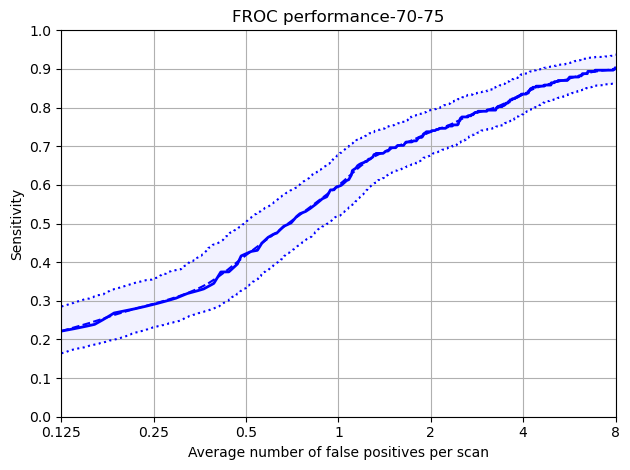

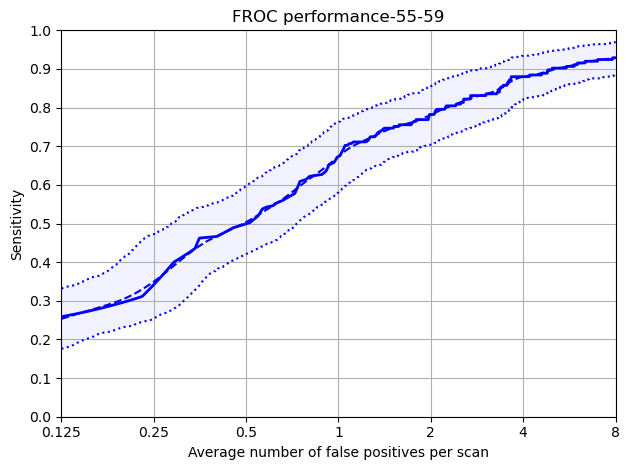

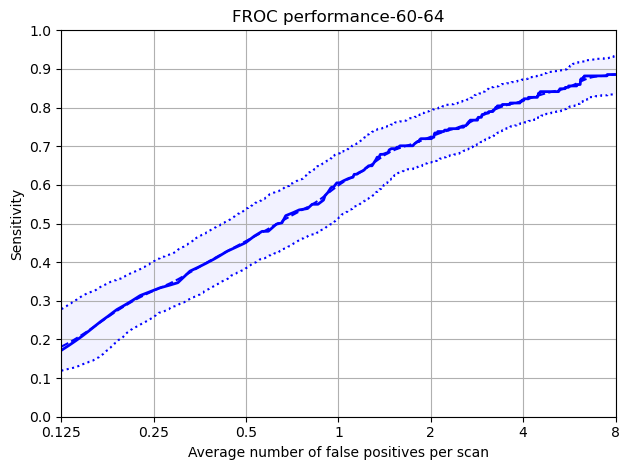

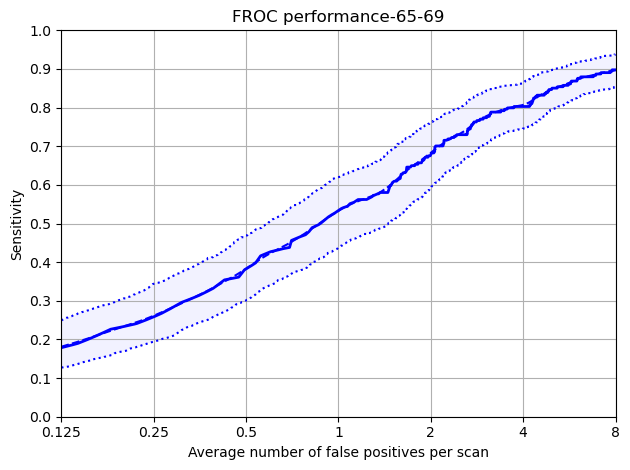

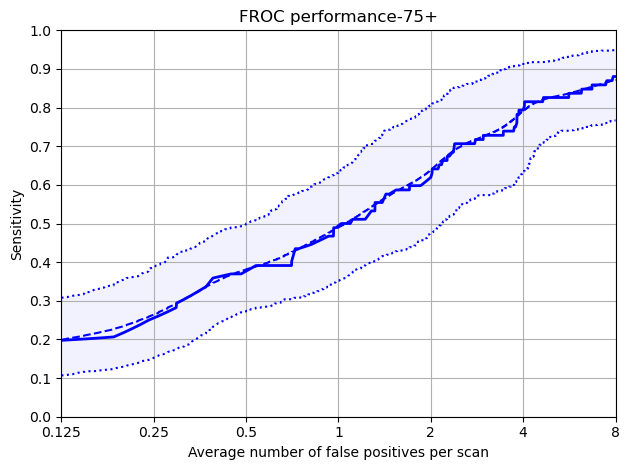

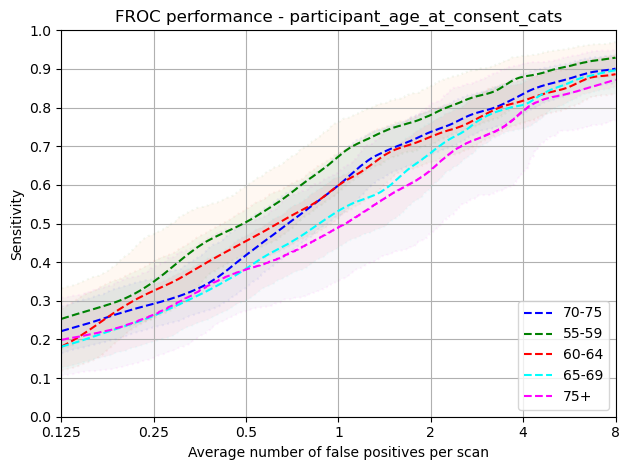

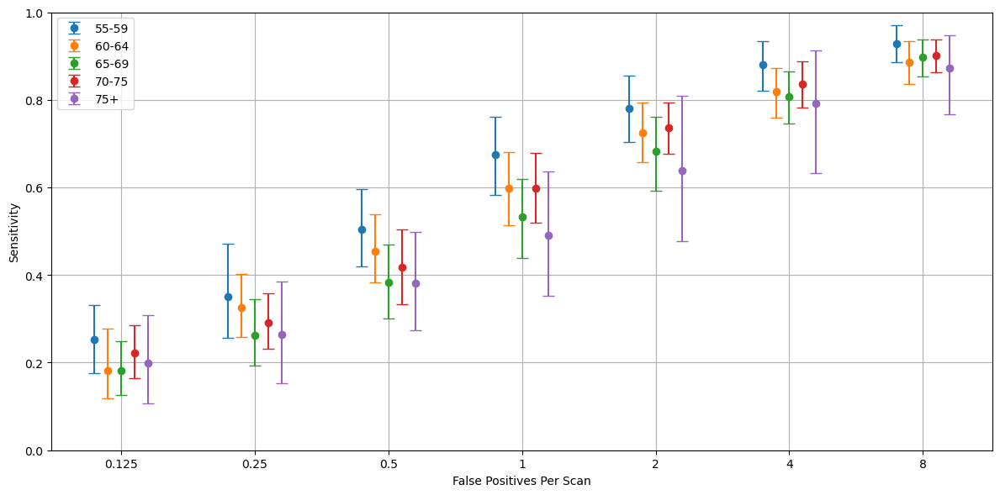

In [29]:
protected_group = 'participant_age_at_consent_cats'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('detection', flavour, 'Age', data_dict, ['55-59','60-64','65-69','70-75','75+'])

### Ethnicity Analysis

Protected Group: White


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,31.0,51.0,4.0,5.0,8.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpw_37df9n/annotations.csv
Total number of included nodule annotations: 1201
Total number of nodule annotations: 1201
Cases: 888
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-8739-emz_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [01:04<00:00, 15.61it/s]


,0,159,476,1111,2381,4920,9999
0,0.206 (0.175 - 0.241),0.298 (0.263 - 0.339),0.427 (0.386 - 0.469),0.585 (0.541 - 0.629),0.722 (0.685 - 0.757),0.831 (0.802 - 0.857),0.902 (0.881 - 0.921)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.206,0.175,0.241
159,0.250,0.298,0.263,0.339
476,0.500,0.427,0.386,0.469
1111,1.000,0.585,0.541,0.629
2381,2.000,0.722,0.685,0.757
4920,4.000,0.831,0.802,0.857
9999,8.000,0.902,0.881,0.921


Mean Sensitivity: 0.57 Low Sensitivity: 0.53 High Sensitivity: 0.602


,True positives,1160
0,False positives,31270.000
1,False negatives,41.000
2,True negatives,0.000
3,Total number of candidates,33343.000
4,Total number of nodules,1201.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,914.000
7,Sensitivity,0.966
8,Average number of candidates per scan,37.548


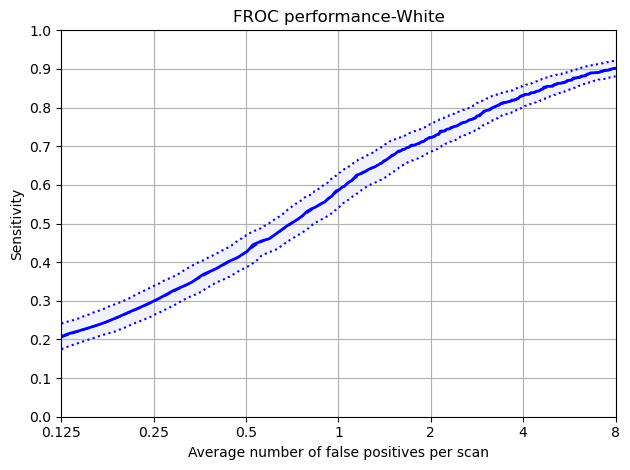

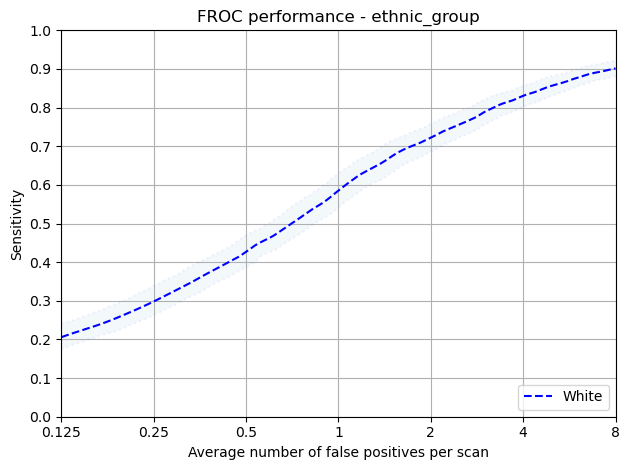

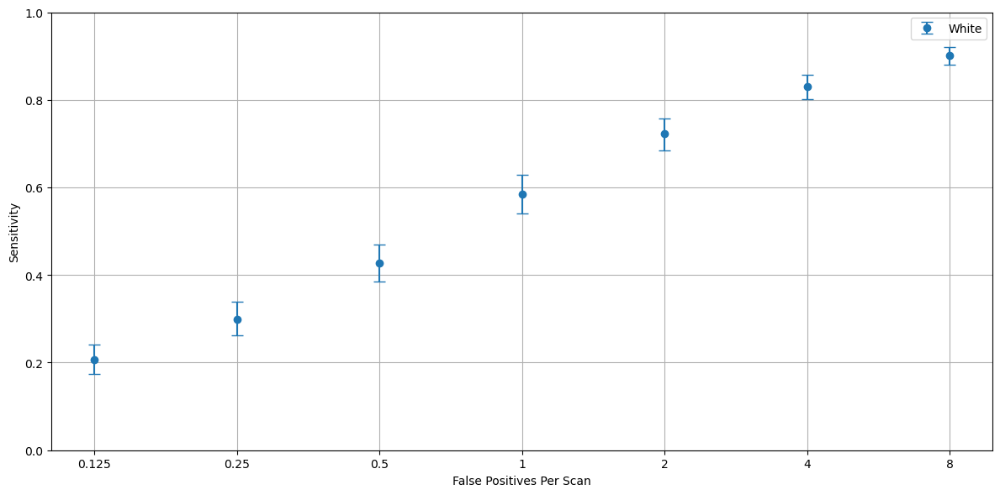

In [30]:
protected_group = 'ethnic_group'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('detection', flavour,'Ethnic Group', data_dict, order=['Asian or Asian British','Black','White'])

### IMDRank_tertile

Protected Group: High


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,33.0,48.0,4.0,6.0,9.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmprtiuqhdk/annotations.csv
Total number of included nodule annotations: 386
Total number of nodule annotations: 386
Cases: 317


100%|██████████| 1000/1000 [00:19<00:00, 50.85it/s]


,0,159,476,1111,2381,4920,9999
0,0.217 (0.15 - 0.287),0.322 (0.256 - 0.389),0.423 (0.352 - 0.493),0.581 (0.499 - 0.658),0.719 (0.651 - 0.787),0.831 (0.78 - 0.883),0.899 (0.858 - 0.938)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.217,0.150,0.287
159,0.250,0.322,0.256,0.389
476,0.500,0.423,0.352,0.493
1111,1.000,0.581,0.499,0.658
2381,2.000,0.719,0.651,0.787
4920,4.000,0.831,0.780,0.883
9999,8.000,0.899,0.858,0.938


Mean Sensitivity: 0.57 Low Sensitivity: 0.51 High Sensitivity: 0.634


,True positives,375
0,False positives,10922.000
1,False negatives,11.000
2,True negatives,0.000
3,Total number of candidates,11587.000
4,Total number of nodules,386.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,290.000
7,Sensitivity,0.972
8,Average number of candidates per scan,36.552


Protected Group: Low


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,28.0,56.0,6.0,4.0,7.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp90t6bqtf/annotations.csv
Total number of included nodule annotations: 400
Total number of nodule annotations: 400
Cases: 260


100%|██████████| 1000/1000 [00:13<00:00, 76.16it/s]


,0,159,476,1111,2381,4920,9999
0,0.198 (0.145 - 0.247),0.282 (0.22 - 0.355),0.426 (0.358 - 0.493),0.583 (0.503 - 0.663),0.714 (0.651 - 0.773),0.831 (0.777 - 0.881),0.902 (0.868 - 0.933)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.198,0.145,0.247
159,0.250,0.282,0.220,0.355
476,0.500,0.426,0.358,0.493
1111,1.000,0.583,0.503,0.663
2381,2.000,0.714,0.651,0.773
4920,4.000,0.831,0.777,0.881
9999,8.000,0.902,0.868,0.933


Mean Sensitivity: 0.56 Low Sensitivity: 0.5 High Sensitivity: 0.621


,True positives,391
0,False positives,9096.000
1,False negatives,9.000
2,True negatives,0.000
3,Total number of candidates,9783.000
4,Total number of nodules,400.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,296.000
7,Sensitivity,0.978
8,Average number of candidates per scan,37.627


Protected Group: Medium


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,32.0,50.0,3.0,5.0,9.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmps56i2y4r/annotations.csv
Total number of included nodule annotations: 411
Total number of nodule annotations: 411
Cases: 303
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-8739-emz_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:19<00:00, 50.77it/s]


,0,159,476,1111,2381,4920,9999
0,0.205 (0.156 - 0.262),0.298 (0.243 - 0.36),0.435 (0.363 - 0.516),0.584 (0.526 - 0.643),0.732 (0.676 - 0.782),0.825 (0.776 - 0.869),0.901 (0.865 - 0.935)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.205,0.156,0.262
159,0.250,0.298,0.243,0.360
476,0.500,0.435,0.363,0.516
1111,1.000,0.584,0.526,0.643
2381,2.000,0.732,0.676,0.782
4920,4.000,0.825,0.776,0.869
9999,8.000,0.901,0.865,0.935


Mean Sensitivity: 0.57 Low Sensitivity: 0.52 High Sensitivity: 0.624


,True positives,390
0,False positives,10933.000
1,False negatives,21.000
2,True negatives,0.000
3,Total number of candidates,11649.000
4,Total number of nodules,411.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,327.000
7,Sensitivity,0.949
8,Average number of candidates per scan,38.446


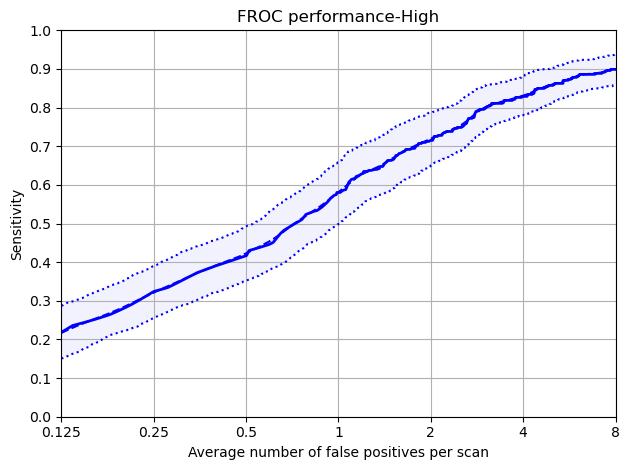

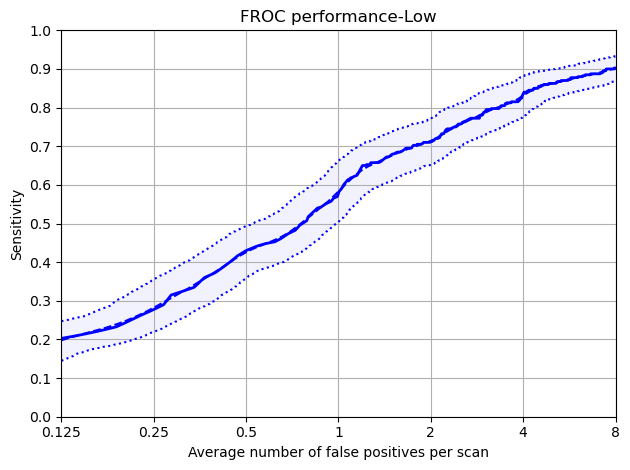

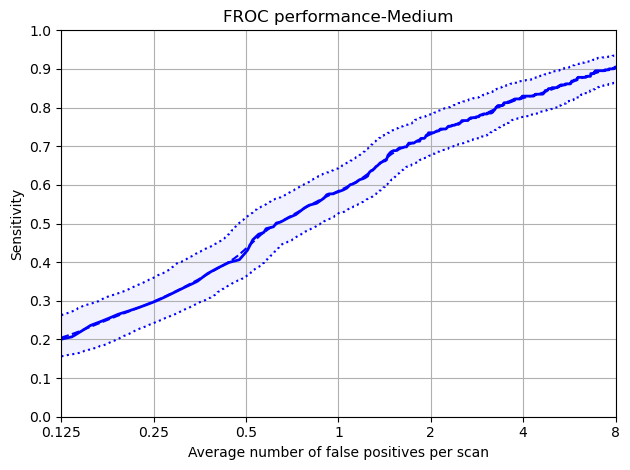

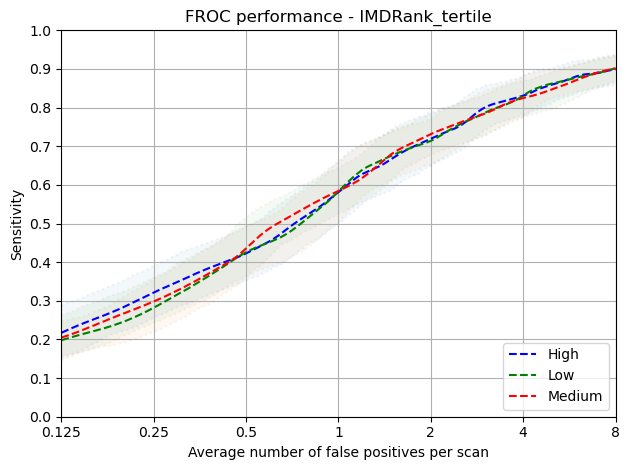

In [31]:
protected_group = 'IMDRank_tertile'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)

### Smoking Pack Years


Protected Group: Medium (35-50)


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,36.0,50.0,3.0,5.0,6.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp87gb9_r7/annotations.csv
Total number of included nodule annotations: 354
Total number of nodule annotations: 354
Cases: 292


100%|██████████| 1000/1000 [00:19<00:00, 52.07it/s]


,0,159,476,1111,2381,4920,9999
0,0.23 (0.158 - 0.301),0.353 (0.272 - 0.444),0.522 (0.443 - 0.595),0.658 (0.582 - 0.733),0.758 (0.688 - 0.821),0.855 (0.797 - 0.905),0.909 (0.864 - 0.946)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.230,0.158,0.301
159,0.250,0.353,0.272,0.444
476,0.500,0.522,0.443,0.595
1111,1.000,0.658,0.582,0.733
2381,2.000,0.758,0.688,0.821
4920,4.000,0.855,0.797,0.905
9999,8.000,0.909,0.864,0.946


Mean Sensitivity: 0.61 Low Sensitivity: 0.54 High Sensitivity: 0.678


,True positives,341
0,False positives,9660.000
1,False negatives,13.000
2,True negatives,0.000
3,Total number of candidates,10271.000
4,Total number of nodules,354.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,270.000
7,Sensitivity,0.963
8,Average number of candidates per scan,35.175


Protected Group: Low (15-35)


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,28.0,53.0,5.0,3.0,10.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpxng4u2za/annotations.csv
Total number of included nodule annotations: 432
Total number of nodule annotations: 432
Cases: 296
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-8739-emz_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:21<00:00, 46.60it/s]


,0,159,476,1111,2381,4920,9999
0,0.196 (0.148 - 0.25),0.289 (0.227 - 0.354),0.396 (0.326 - 0.467),0.575 (0.503 - 0.65),0.697 (0.64 - 0.755),0.816 (0.774 - 0.859),0.885 (0.851 - 0.915)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.196,0.148,0.250
159,0.250,0.289,0.227,0.354
476,0.500,0.396,0.326,0.467
1111,1.000,0.575,0.503,0.650
2381,2.000,0.697,0.640,0.755
4920,4.000,0.816,0.774,0.859
9999,8.000,0.885,0.851,0.915


Mean Sensitivity: 0.55 Low Sensitivity: 0.5 High Sensitivity: 0.607


,True positives,413
0,False positives,10039.000
1,False negatives,19.000
2,True negatives,0.000
3,Total number of candidates,10737.000
4,Total number of nodules,432.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,286.000
7,Sensitivity,0.956
8,Average number of candidates per scan,36.274


Protected Group: High (50+)


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,31.0,50.0,5.0,7.0,8.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpc_d9ok5r/annotations.csv
Total number of included nodule annotations: 415
Total number of nodule annotations: 415
Cases: 302


100%|██████████| 1000/1000 [00:25<00:00, 38.75it/s]


,0,159,476,1111,2381,4920,9999
0,0.201 (0.147 - 0.258),0.279 (0.224 - 0.336),0.394 (0.339 - 0.459),0.542 (0.476 - 0.613),0.713 (0.641 - 0.778),0.834 (0.787 - 0.877),0.908 (0.872 - 0.942)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.201,0.147,0.258
159,0.250,0.279,0.224,0.336
476,0.500,0.394,0.339,0.459
1111,1.000,0.542,0.476,0.613
2381,2.000,0.713,0.641,0.778
4920,4.000,0.834,0.787,0.877
9999,8.000,0.908,0.872,0.942


Mean Sensitivity: 0.55 Low Sensitivity: 0.5 High Sensitivity: 0.609


,True positives,406
0,False positives,11571.000
1,False negatives,9.000
2,True negatives,0.000
3,Total number of candidates,12335.000
4,Total number of nodules,415.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,358.000
7,Sensitivity,0.978
8,Average number of candidates per scan,40.844


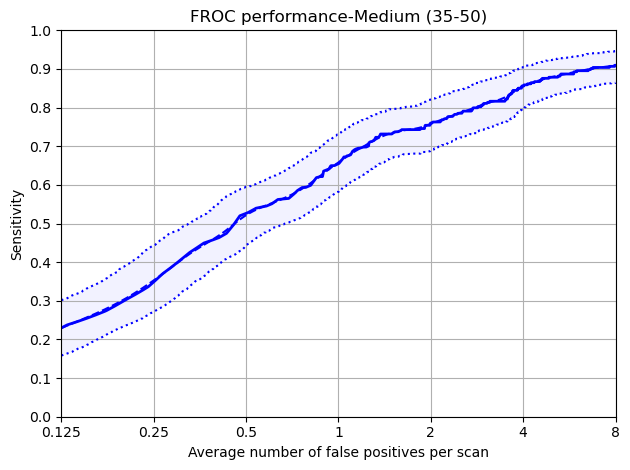

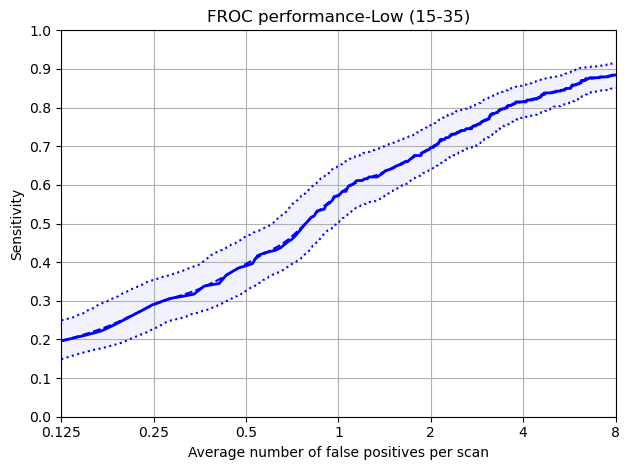

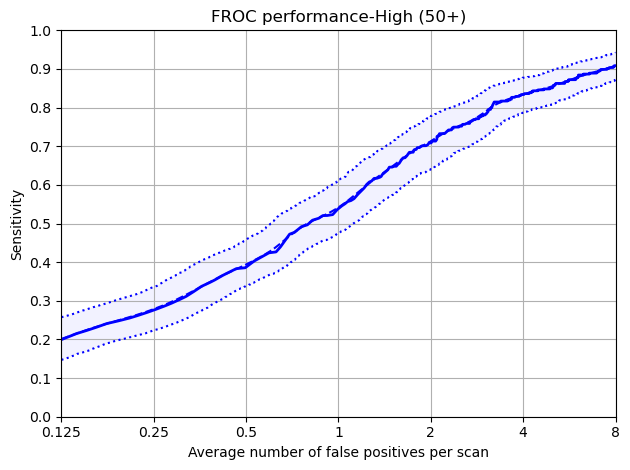

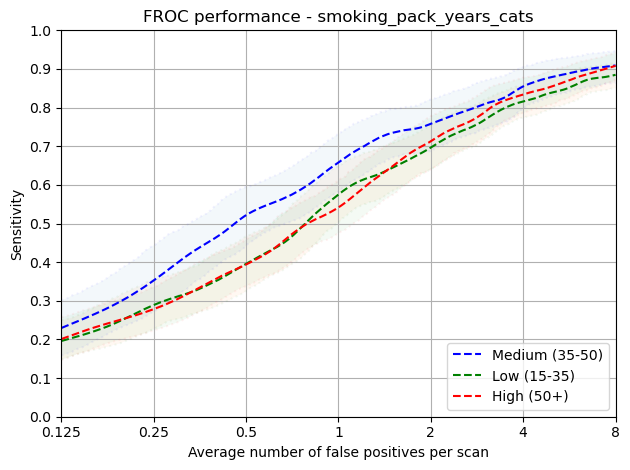

In [32]:
protected_group = 'smoking_pack_years_cats'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)

### Actionable Vs Non-Actionable

Protected Group: Non-Actionable


,SOLID,PERIFISSURAL
nodule_type,13.0,87.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpbaso_e04/annotations.csv
Total number of included nodule annotations: 435
Total number of nodule annotations: 435
Cases: 594


100%|██████████| 1000/1000 [00:44<00:00, 22.49it/s]


,0,159,476,1111,2381,4920,9999
0,0.291 (0.233 - 0.349),0.396 (0.331 - 0.461),0.554 (0.49 - 0.621),0.734 (0.683 - 0.784),0.851 (0.809 - 0.889),0.93 (0.904 - 0.954),0.966 (0.949 - 0.982)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.291,0.233,0.349
159,0.250,0.396,0.331,0.461
476,0.500,0.554,0.490,0.621
1111,1.000,0.734,0.683,0.784
2381,2.000,0.851,0.809,0.889
4920,4.000,0.930,0.904,0.954
9999,8.000,0.966,0.949,0.982


Mean Sensitivity: 0.67 Low Sensitivity: 0.63 High Sensitivity: 0.72


,True positives,432
0,False positives,18190.000
1,False negatives,3.000
2,True negatives,0.000
3,Total number of candidates,18775.000
4,Total number of nodules,435.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,153.000
7,Sensitivity,0.993
8,Average number of candidates per scan,31.608


Protected Group: Actonable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,42.0,31.0,7.0,8.0,13.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmphbqw4vp1/annotations.csv
Total number of included nodule annotations: 766
Total number of nodule annotations: 766
Cases: 295
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-8739-emz_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:30<00:00, 32.94it/s]


,0,159,476,1111,2381,4920,9999
0,0.169 (0.133 - 0.206),0.249 (0.209 - 0.29),0.351 (0.298 - 0.405),0.489 (0.434 - 0.548),0.632 (0.583 - 0.685),0.751 (0.705 - 0.795),0.847 (0.814 - 0.877)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.169,0.133,0.206
159,0.250,0.249,0.209,0.290
476,0.500,0.351,0.298,0.405
1111,1.000,0.489,0.434,0.548
2381,2.000,0.632,0.583,0.685
4920,4.000,0.751,0.705,0.795
9999,8.000,0.847,0.814,0.877


Mean Sensitivity: 0.5 Low Sensitivity: 0.45 High Sensitivity: 0.544


,True positives,728
0,False positives,13080.000
1,False negatives,38.000
2,True negatives,0.000
3,Total number of candidates,14568.000
4,Total number of nodules,766.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,761.000
7,Sensitivity,0.950
8,Average number of candidates per scan,49.383


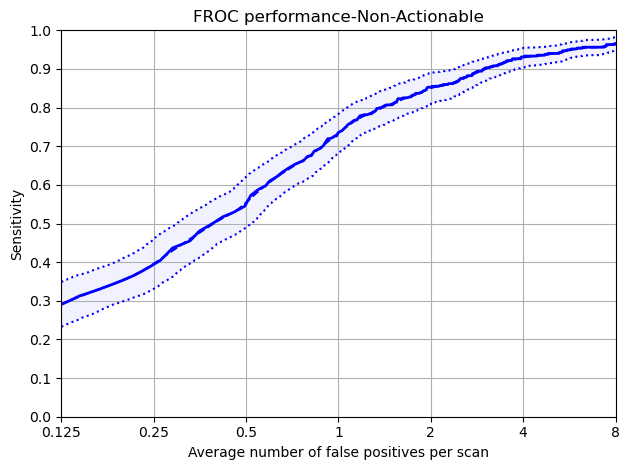

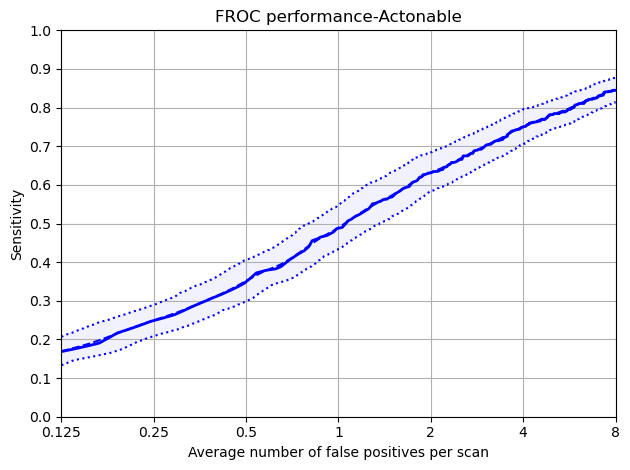

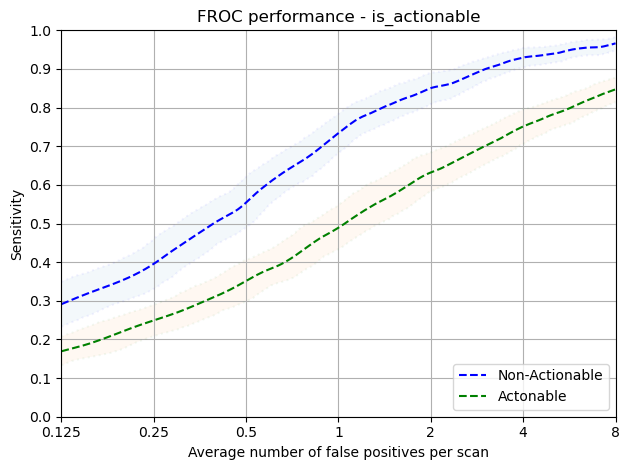

In [33]:
protected_group = 'is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)

### Actionable Gender

Protected Group: Male


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,45.0,32.0,5.0,9.0,8.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpnmyuowlp/annotations.csv
Total number of included nodule annotations: 380
Total number of nodule annotations: 380
Cases: 151


100%|██████████| 1000/1000 [00:14<00:00, 67.61it/s]


,0,159,476,1111,2381,4920,9999
0,0.184 (0.122 - 0.243),0.254 (0.199 - 0.314),0.339 (0.275 - 0.406),0.46 (0.393 - 0.531),0.598 (0.517 - 0.677),0.749 (0.677 - 0.811),0.841 (0.792 - 0.887)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.184,0.122,0.243
159,0.250,0.254,0.199,0.314
476,0.500,0.339,0.275,0.406
1111,1.000,0.460,0.393,0.531
2381,2.000,0.598,0.517,0.677
4920,4.000,0.749,0.677,0.811
9999,8.000,0.841,0.792,0.887


Mean Sensitivity: 0.49 Low Sensitivity: 0.43 High Sensitivity: 0.553


,True positives,360
0,False positives,7079.000
1,False negatives,20.000
2,True negatives,0.000
3,Total number of candidates,7812.000
4,Total number of nodules,380.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,373.000
7,Sensitivity,0.947
8,Average number of candidates per scan,51.735


Protected Group: Female


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,39.0,30.0,9.0,6.0,17.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpk6ku5a7a/annotations.csv
Total number of included nodule annotations: 386
Total number of nodule annotations: 386
Cases: 145
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-8739-emz_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:11<00:00, 88.70it/s]


,0,159,476,1111,2381,4920,9999
0,0.159 (0.1 - 0.237),0.245 (0.192 - 0.311),0.372 (0.286 - 0.447),0.54 (0.453 - 0.616),0.659 (0.602 - 0.72),0.751 (0.695 - 0.807),0.853 (0.807 - 0.897)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.159,0.100,0.237
159,0.250,0.245,0.192,0.311
476,0.500,0.372,0.286,0.447
1111,1.000,0.540,0.453,0.616
2381,2.000,0.659,0.602,0.720
4920,4.000,0.751,0.695,0.807
9999,8.000,0.853,0.807,0.897


Mean Sensitivity: 0.51 Low Sensitivity: 0.45 High Sensitivity: 0.576


,True positives,368
0,False positives,6001.000
1,False negatives,18.000
2,True negatives,0.000
3,Total number of candidates,6756.000
4,Total number of nodules,386.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,388.000
7,Sensitivity,0.953
8,Average number of candidates per scan,46.593


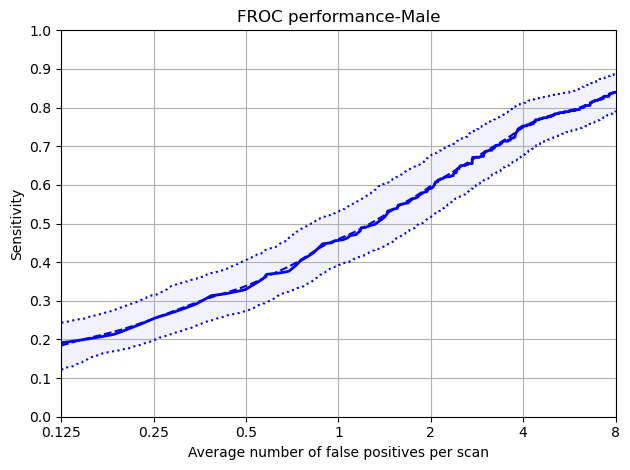

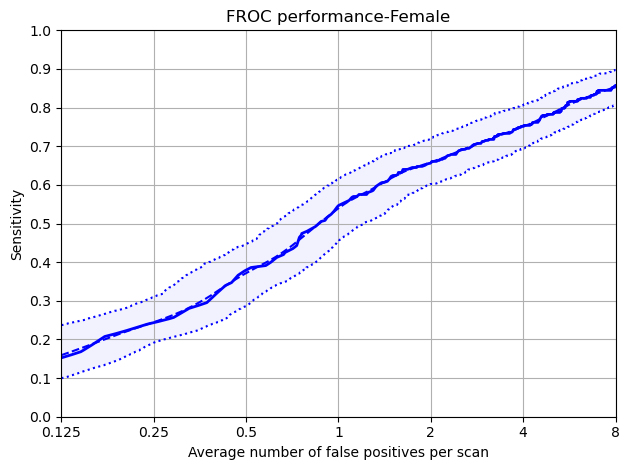

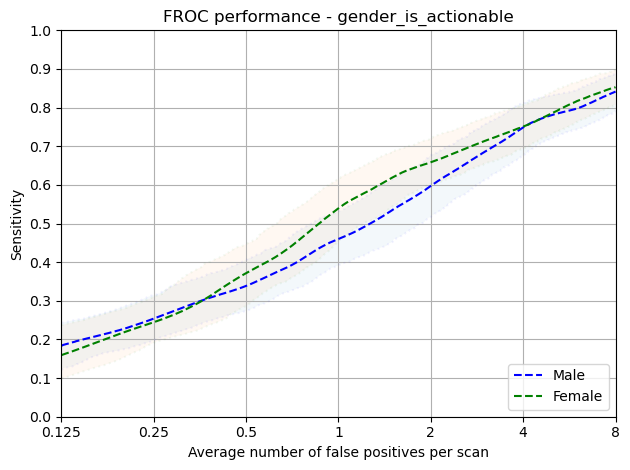

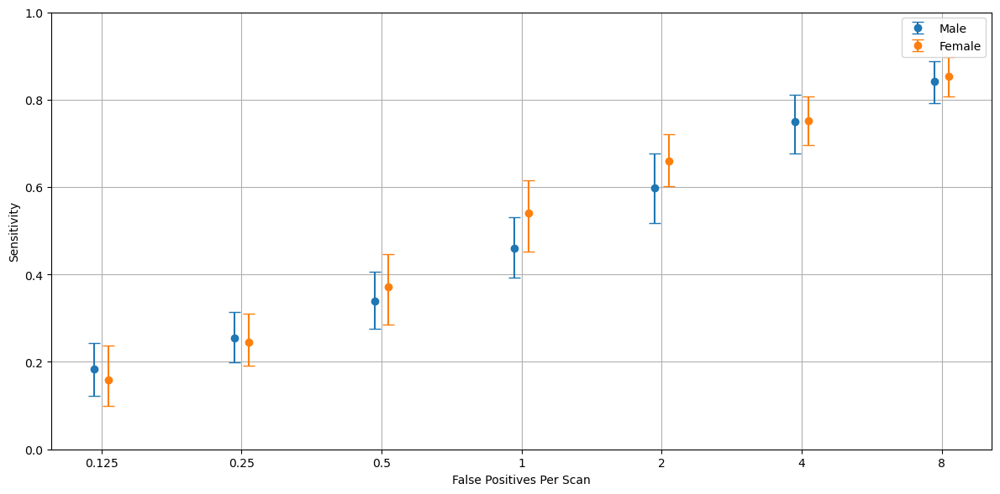

In [34]:
protected_group = 'gender_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('detection', flavour,'Actionable, Gender', data_dict)

### Non-Actionable Gender

Protected Group: Male


,SOLID,PERIFISSURAL
nodule_type,11.0,89.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpvoncieku/annotations.csv
Total number of included nodule annotations: 270
Total number of nodule annotations: 270
Cases: 342


100%|██████████| 1000/1000 [00:17<00:00, 58.01it/s]


,0,159,476,1111,2381,4920,9999
0,0.324 (0.254 - 0.405),0.433 (0.352 - 0.521),0.573 (0.485 - 0.663),0.744 (0.67 - 0.811),0.866 (0.813 - 0.915),0.936 (0.901 - 0.963),0.967 (0.944 - 0.987)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.324,0.254,0.405
159,0.250,0.433,0.352,0.521
476,0.500,0.573,0.485,0.663
1111,1.000,0.744,0.670,0.811
2381,2.000,0.866,0.813,0.915
4920,4.000,0.936,0.901,0.963
9999,8.000,0.967,0.944,0.987


Mean Sensitivity: 0.69 Low Sensitivity: 0.63 High Sensitivity: 0.752


,True positives,268
0,False positives,11453.000
1,False negatives,2.000
2,True negatives,0.000
3,Total number of candidates,11817.000
4,Total number of nodules,270.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,96.000
7,Sensitivity,0.993
8,Average number of candidates per scan,34.553


Protected Group: Female


,SOLID,PERIFISSURAL
nodule_type,15.0,85.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpxezlp2gh/annotations.csv
Total number of included nodule annotations: 165
Total number of nodule annotations: 165
Cases: 253


100%|██████████| 1000/1000 [00:08<00:00, 115.89it/s]


,0,159,476,1111,2381,4920,9999
0,0.24 (0.153 - 0.323),0.347 (0.251 - 0.469),0.521 (0.428 - 0.626),0.731 (0.646 - 0.807),0.838 (0.772 - 0.898),0.92 (0.874 - 0.961),0.974 (0.944 - 0.995)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.240,0.153,0.323
159,0.250,0.347,0.251,0.469
476,0.500,0.521,0.428,0.626
1111,1.000,0.731,0.646,0.807
2381,2.000,0.838,0.772,0.898
4920,4.000,0.920,0.874,0.961
9999,8.000,0.974,0.944,0.995


Mean Sensitivity: 0.65 Low Sensitivity: 0.58 High Sensitivity: 0.726


,True positives,164
0,False positives,6737.000
1,False negatives,1.000
2,True negatives,0.000
3,Total number of candidates,6958.000
4,Total number of nodules,165.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,57.000
7,Sensitivity,0.994
8,Average number of candidates per scan,27.502


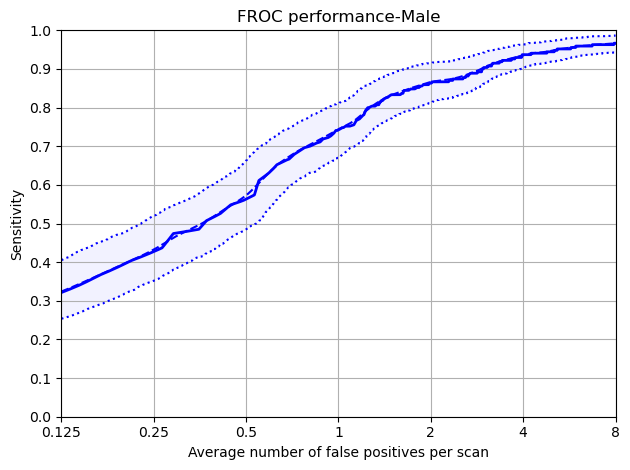

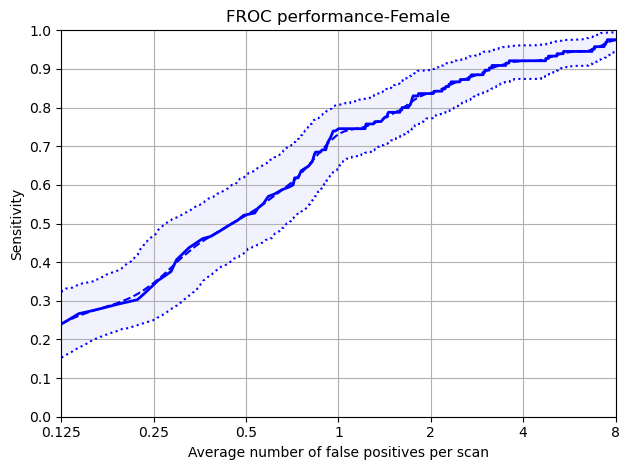

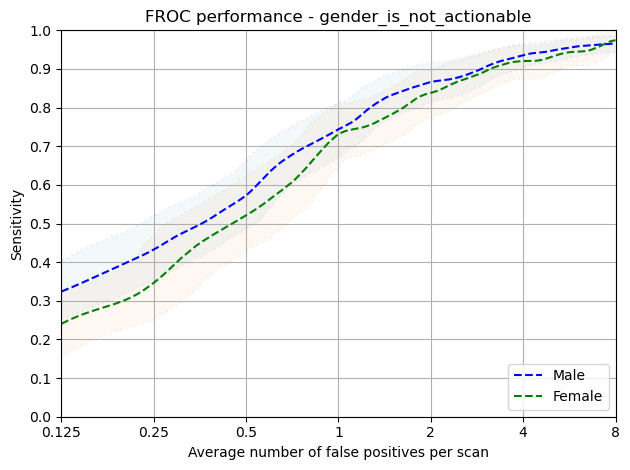

In [35]:
protected_group = 'gender_is_not_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)


### Actionable Ethnic Group

Protected Group: White


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,42.0,31.0,7.0,8.0,13.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpro3akfgm/annotations.csv
Total number of included nodule annotations: 766
Total number of nodule annotations: 766
Cases: 295
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-8739-emz_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:16<00:00, 60.96it/s]


,0,159,476,1111,2381,4920,9999
0,0.168 (0.129 - 0.206),0.249 (0.209 - 0.295),0.352 (0.303 - 0.405),0.489 (0.438 - 0.546),0.632 (0.585 - 0.678),0.75 (0.71 - 0.791),0.846 (0.816 - 0.876)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.168,0.129,0.206
159,0.250,0.249,0.209,0.295
476,0.500,0.352,0.303,0.405
1111,1.000,0.489,0.438,0.546
2381,2.000,0.632,0.585,0.678
4920,4.000,0.750,0.710,0.791
9999,8.000,0.846,0.816,0.876


Mean Sensitivity: 0.5 Low Sensitivity: 0.46 High Sensitivity: 0.542


,True positives,728
0,False positives,13080.000
1,False negatives,38.000
2,True negatives,0.000
3,Total number of candidates,14568.000
4,Total number of nodules,766.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,761.000
7,Sensitivity,0.950
8,Average number of candidates per scan,49.383


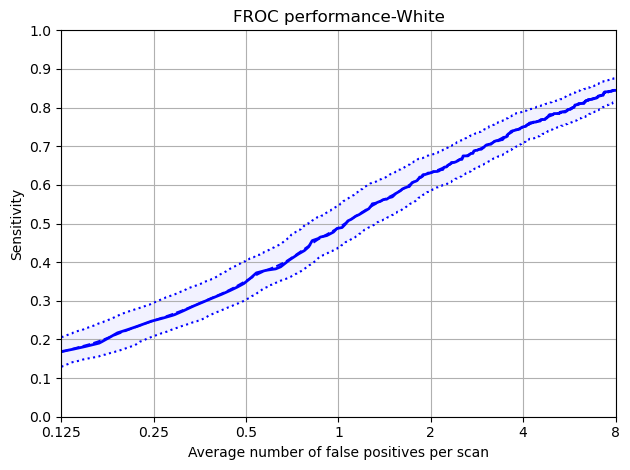

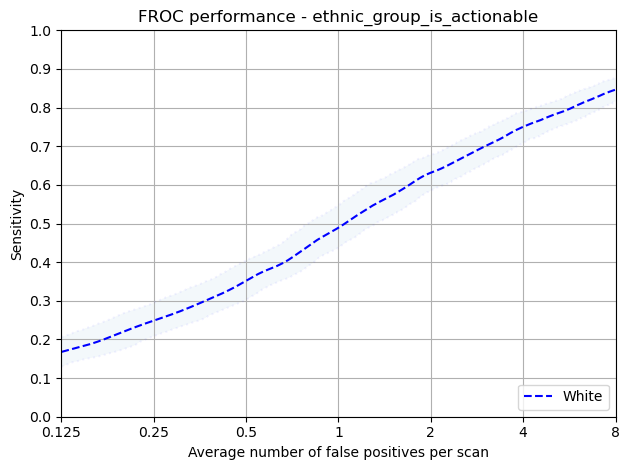

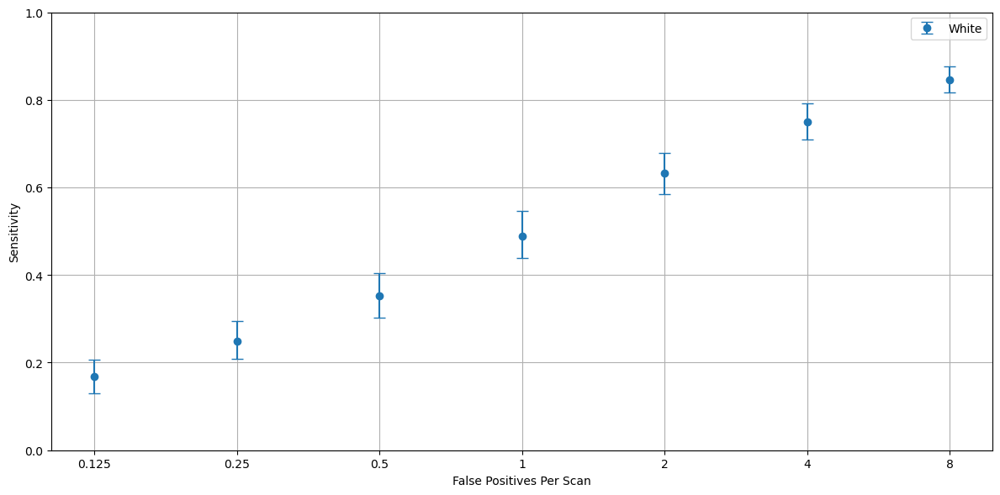

In [36]:
protected_group = 'ethnic_group_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('detection', flavour,'Actionable, Ethnic Group', data_dict, order=['Asian or Asian British','Black','White'])

### NonActionable - Ethnic Group

Protected Group: White


,SOLID,PERIFISSURAL
nodule_type,13.0,87.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpqxjh7_04/annotations.csv
Total number of included nodule annotations: 435
Total number of nodule annotations: 435
Cases: 594


100%|██████████| 1000/1000 [00:25<00:00, 39.67it/s]


,0,159,476,1111,2381,4920,9999
0,0.293 (0.239 - 0.349),0.399 (0.337 - 0.467),0.559 (0.488 - 0.628),0.736 (0.682 - 0.792),0.852 (0.812 - 0.889),0.93 (0.904 - 0.955),0.966 (0.949 - 0.983)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.293,0.239,0.349
159,0.250,0.399,0.337,0.467
476,0.500,0.559,0.488,0.628
1111,1.000,0.736,0.682,0.792
2381,2.000,0.852,0.812,0.889
4920,4.000,0.930,0.904,0.955
9999,8.000,0.966,0.949,0.983


Mean Sensitivity: 0.68 Low Sensitivity: 0.63 High Sensitivity: 0.723


,True positives,432
0,False positives,18190.000
1,False negatives,3.000
2,True negatives,0.000
3,Total number of candidates,18775.000
4,Total number of nodules,435.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,153.000
7,Sensitivity,0.993
8,Average number of candidates per scan,31.608


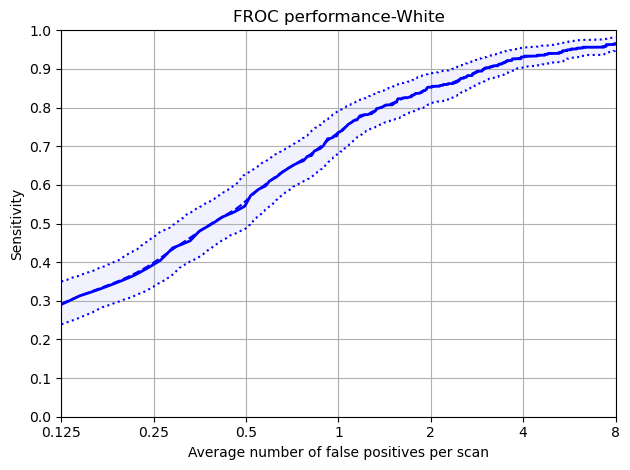

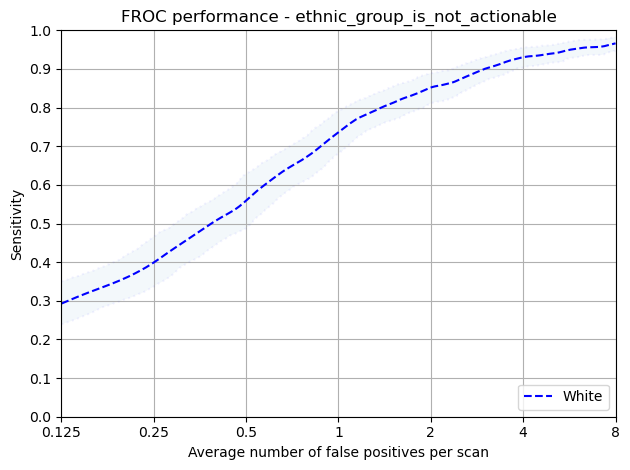

In [37]:
protected_group = 'ethnic_group_is_not_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)

### Actionable IMDRank

Protected Group: High_IMDRank_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,41.0,31.0,6.0,8.0,13.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpg31js2an/annotations.csv
Total number of included nodule annotations: 264
Total number of nodule annotations: 264
Cases: 103


100%|██████████| 1000/1000 [00:06<00:00, 157.40it/s]


,0,159,476,1111,2381,4920,9999
0,0.14 (0.077 - 0.225),0.234 (0.149 - 0.317),0.337 (0.256 - 0.427),0.467 (0.379 - 0.559),0.604 (0.515 - 0.693),0.751 (0.68 - 0.819),0.84 (0.79 - 0.895)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.140,0.077,0.225
159,0.250,0.234,0.149,0.317
476,0.500,0.337,0.256,0.427
1111,1.000,0.467,0.379,0.559
2381,2.000,0.604,0.515,0.693
4920,4.000,0.751,0.680,0.819
9999,8.000,0.840,0.790,0.895


Mean Sensitivity: 0.48 Low Sensitivity: 0.41 High Sensitivity: 0.562


,True positives,253
0,False positives,4628.000
1,False negatives,11.000
2,True negatives,0.000
3,Total number of candidates,5126.000
4,Total number of nodules,264.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,245.000
7,Sensitivity,0.958
8,Average number of candidates per scan,49.767


Protected Group: Medium_IMDRank_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,47.0,24.0,6.0,8.0,15.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpnf2mj4f_/annotations.csv
Total number of included nodule annotations: 248
Total number of nodule annotations: 248
Cases: 103
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-8739-emz_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:06<00:00, 143.12it/s]


,0,159,476,1111,2381,4920,9999
0,0.195 (0.112 - 0.279),0.261 (0.199 - 0.332),0.359 (0.279 - 0.454),0.492 (0.407 - 0.583),0.634 (0.56 - 0.708),0.736 (0.664 - 0.807),0.84 (0.775 - 0.897)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.195,0.112,0.279
159,0.250,0.261,0.199,0.332
476,0.500,0.359,0.279,0.454
1111,1.000,0.492,0.407,0.583
2381,2.000,0.634,0.560,0.708
4920,4.000,0.736,0.664,0.807
9999,8.000,0.840,0.775,0.897


Mean Sensitivity: 0.5 Low Sensitivity: 0.43 High Sensitivity: 0.58


,True positives,228
0,False positives,4622.000
1,False negatives,20.000
2,True negatives,0.000
3,Total number of candidates,5122.000
4,Total number of nodules,248.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,273.000
7,Sensitivity,0.919
8,Average number of candidates per scan,49.728


Protected Group: Low_IMDRank_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,37.0,37.0,9.0,6.0,11.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpub8yl1ua/annotations.csv
Total number of included nodule annotations: 252
Total number of nodule annotations: 252
Cases: 90


100%|██████████| 1000/1000 [00:06<00:00, 163.93it/s]


,0,159,476,1111,2381,4920,9999
0,0.179 (0.13 - 0.241),0.244 (0.175 - 0.33),0.357 (0.277 - 0.441),0.495 (0.384 - 0.608),0.655 (0.571 - 0.74),0.766 (0.69 - 0.841),0.853 (0.801 - 0.904)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.179,0.130,0.241
159,0.250,0.244,0.175,0.330
476,0.500,0.357,0.277,0.441
1111,1.000,0.495,0.384,0.608
2381,2.000,0.655,0.571,0.740
4920,4.000,0.766,0.690,0.841
9999,8.000,0.853,0.801,0.904


Mean Sensitivity: 0.51 Low Sensitivity: 0.43 High Sensitivity: 0.586


,True positives,245
0,False positives,3775.000
1,False negatives,7.000
2,True negatives,0.000
3,Total number of candidates,4262.000
4,Total number of nodules,252.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,242.000
7,Sensitivity,0.972
8,Average number of candidates per scan,47.356


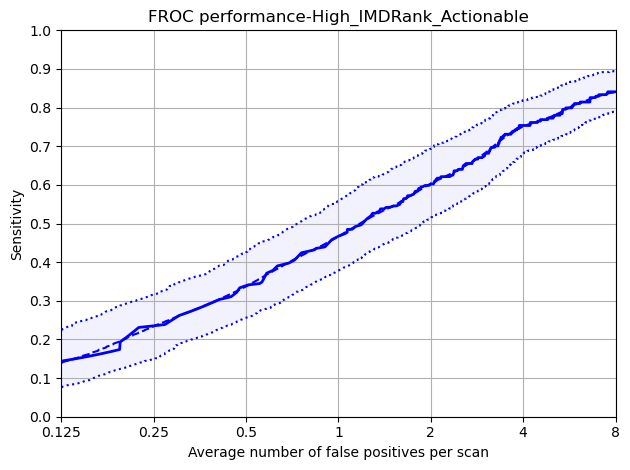

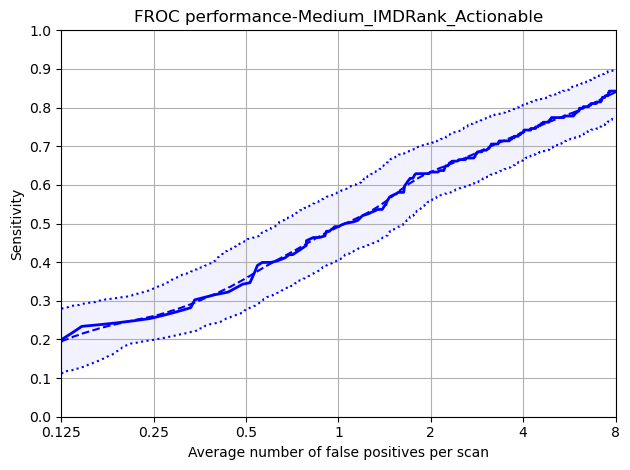

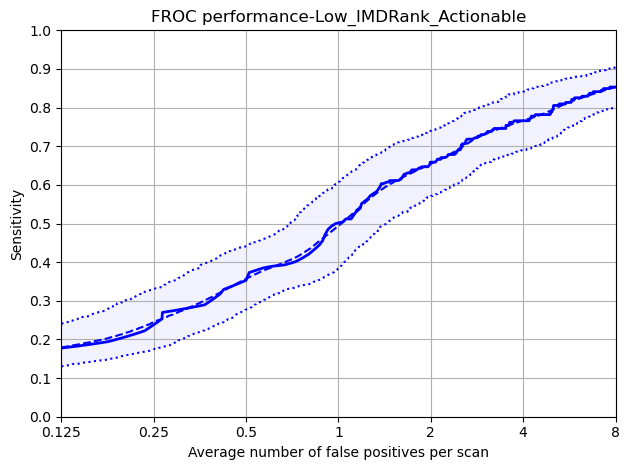

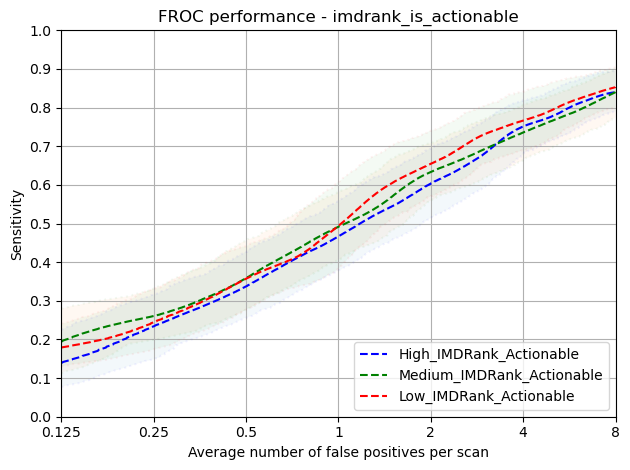

In [38]:
protected_group = 'imdrank_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)

### Actionable Smoking Status

Protected Group: High_Pack_Years_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,43.0,26.0,8.0,11.0,13.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpghr72kvm/annotations.csv
Total number of included nodule annotations: 255
Total number of nodule annotations: 255
Cases: 103


100%|██████████| 1000/1000 [00:07<00:00, 136.48it/s]


,0,159,476,1111,2381,4920,9999
0,0.188 (0.116 - 0.261),0.248 (0.181 - 0.324),0.336 (0.255 - 0.43),0.474 (0.385 - 0.568),0.624 (0.525 - 0.722),0.754 (0.674 - 0.828),0.845 (0.793 - 0.895)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.188,0.116,0.261
159,0.250,0.248,0.181,0.324
476,0.500,0.336,0.255,0.430
1111,1.000,0.474,0.385,0.568
2381,2.000,0.624,0.525,0.722
4920,4.000,0.754,0.674,0.828
9999,8.000,0.845,0.793,0.895


Mean Sensitivity: 0.5 Low Sensitivity: 0.42 High Sensitivity: 0.575


,True positives,246
0,False positives,4764.000
1,False negatives,9.000
2,True negatives,0.000
3,Total number of candidates,5303.000
4,Total number of nodules,255.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,293.000
7,Sensitivity,0.965
8,Average number of candidates per scan,51.485


Protected Group: Medium_Pack_Years_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,46.0,32.0,5.0,7.0,10.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpkxdeanmc/annotations.csv
Total number of included nodule annotations: 242
Total number of nodule annotations: 242
Cases: 99


100%|██████████| 1000/1000 [00:06<00:00, 150.91it/s]


,0,159,476,1111,2381,4920,9999
0,0.164 (0.086 - 0.264),0.286 (0.192 - 0.382),0.446 (0.356 - 0.531),0.575 (0.482 - 0.66),0.676 (0.593 - 0.756),0.772 (0.698 - 0.847),0.874 (0.819 - 0.926)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.164,0.086,0.264
159,0.250,0.286,0.192,0.382
476,0.500,0.446,0.356,0.531
1111,1.000,0.575,0.482,0.660
2381,2.000,0.676,0.593,0.756
4920,4.000,0.772,0.698,0.847
9999,8.000,0.874,0.819,0.926


Mean Sensitivity: 0.54 Low Sensitivity: 0.46 High Sensitivity: 0.624


,True positives,231
0,False positives,4064.000
1,False negatives,11.000
2,True negatives,0.000
3,Total number of candidates,4528.000
4,Total number of nodules,242.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,233.000
7,Sensitivity,0.955
8,Average number of candidates per scan,45.737


Protected Group: Low_Pack_Years_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,37.0,34.0,8.0,6.0,16.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpi_hnpdnw/annotations.csv
Total number of included nodule annotations: 269
Total number of nodule annotations: 269
Cases: 95
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-8739-emz_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:06<00:00, 152.45it/s]


,0,159,476,1111,2381,4920,9999
0,0.152 (0.105 - 0.218),0.229 (0.168 - 0.302),0.302 (0.239 - 0.377),0.448 (0.347 - 0.554),0.59 (0.51 - 0.668),0.727 (0.657 - 0.792),0.823 (0.765 - 0.873)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.152,0.105,0.218
159,0.250,0.229,0.168,0.302
476,0.500,0.302,0.239,0.377
1111,1.000,0.448,0.347,0.554
2381,2.000,0.590,0.510,0.668
4920,4.000,0.727,0.657,0.792
9999,8.000,0.823,0.765,0.873


Mean Sensitivity: 0.47 Low Sensitivity: 0.4 High Sensitivity: 0.541


,True positives,251
0,False positives,4252.000
1,False negatives,18.000
2,True negatives,0.000
3,Total number of candidates,4737.000
4,Total number of nodules,269.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,235.000
7,Sensitivity,0.933
8,Average number of candidates per scan,49.863


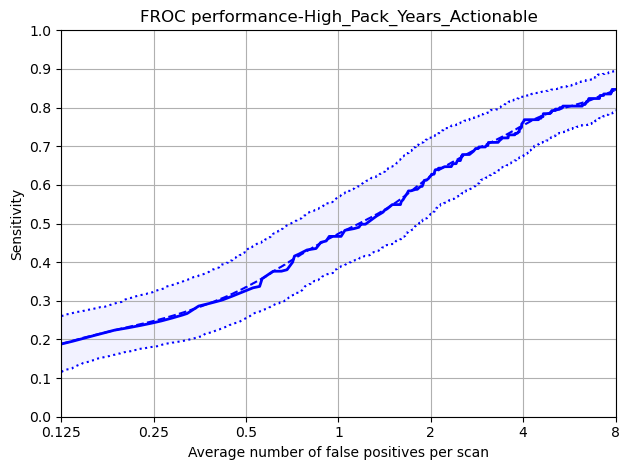

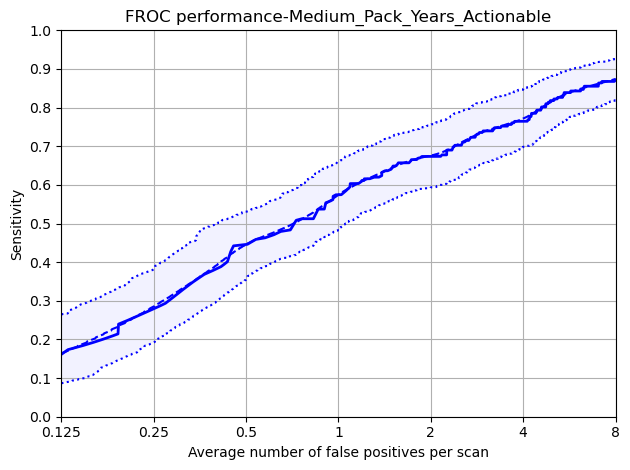

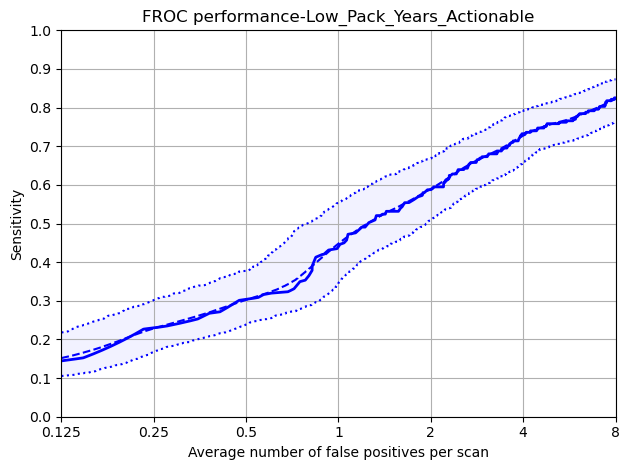

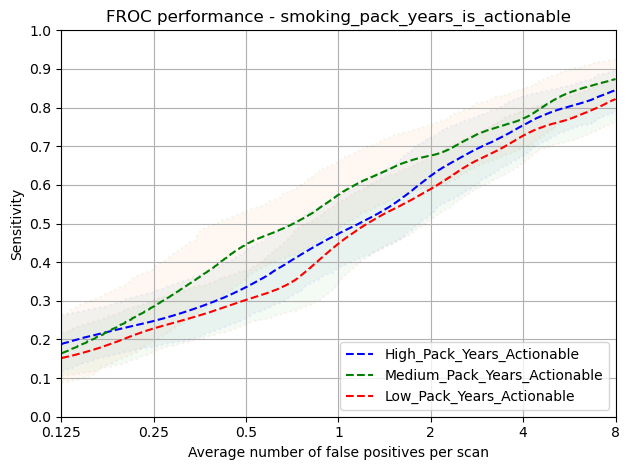

In [39]:
protected_group = 'smoking_pack_years_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)


### False Positive and Miss Analysis


In [40]:
thresholds = utils.get_thresholds(detection_summit_summit)
print(thresholds)
missed_metadata = utils.miss_anaysis_at_fpps(
    model='detection',
    scans_metadata=scan_metadata,
    scans_path=f'{workspace_path}/metadata/summit/{flavour}/test_scans.csv',
    annotations_path=f'{workspace_path}/models/detection/result/trained_summit/summit/{flavour}/annotations.csv',
    exclusions_path=f'{workspace_path}/data/summit/metadata/annotations_excluded_empty.csv',
    predictions_path=detection_predictions_path,
    thresholds=thresholds
)

[0.99755859375, 0.99609375, 0.99267578125, 0.9833984375, 0.953125, 0.84423828125, 0.495361328125]
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/detection/result/trained_summit/summit/white_only/annotations.csv
Total number of included nodule annotations: 1218
Total number of nodule annotations: 1218
Cases: 899
Missed Annotations at 0.99755859375 FPPs: 1005
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/detection/result/trained_summit/summit/white_only/annotations.csv
Total number of included nodule annotations: 1218
Total number of nodule annotations: 1218
Cases: 899
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-8739-emz_Y0_BASELINE_A, nodule Annot ID: None
Missed Annotations at 0.99609375 FPPs: 886
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/detection/result/trained_summit/summit/white_only/annotations.csv
Total number of included nodule annotations: 1218
Total number of nodule anno

In [41]:
hit_and_miss_dict = utils.get_protected_group_by_nodule_type(missed_metadata)

#### Incremental FROC Scores - Gender/ Ethnic Group / Nodule Type

In [42]:

# display(hit_and_miss_dict[0])
recode_dict = {}
for idx in range(7):
    hmm = {}
    for slice in ['all','actionable']:
        for protected_group in ['MALE','FEMALE','All', 'Asian or Asian British', 'Black', 'White']:
            for type in ['SOLID','NON_SOLID','PART_SOLID','PERIFISSURAL','CALCIFIED']:
            
                try:

                    group = 'gender' if protected_group in ['MALE','FEMALE','All'] else 'ethnic_group'

                    total = hit_and_miss_dict[idx][slice][group][(True,type)][protected_group] + hit_and_miss_dict[idx][slice][group][(False,type)][protected_group]
                    hits = hit_and_miss_dict[idx][slice][group][(False,type)][protected_group]
                    perc_hits = round(100 * (hits/total),0)

                    hmm[f'{slice}_{protected_group}_{type}_Hits%'] = perc_hits
                except:
                    print(f'Error: {idx}, {slice}, {protected_group}, {type}')
                    hmm[f'{slice}_{protected_group}_{type}_Hits%'] = 100
                    

    recode_dict[idx] = hmm

pd.DataFrame.from_dict(recode_dict, orient='index').head(7)

df = pd.DataFrame.from_dict(recode_dict, orient='index').head(7)

# Remove ".0" from each value in the dataframe
df = df.applymap(lambda x: str(x).replace('.0', ''))

# Collapse each column into comma-delimited values
collapsed_df = df.apply(lambda x: ', '.join(x), axis=0)

display(collapsed_df)

from scipy.stats import shapiro, ttest_ind, mannwhitneyu

def calculate_significant_differences(df, group1_name, group2_name):

    group1 = df[group1_name].astype(int).values
    group2 = df[group2_name].astype(int).values

    shapiro_group1 = shapiro(group1)
    shapiro_group2 = shapiro(group2)

    print('*'*50)
    if shapiro_group1[1] > 0.05 and shapiro_group2[1] > 0.05:
        t_test = ttest_ind(group1, group2)
        print(f'Independent T-Test: {round(t_test.statistic,3)}, {round(t_test.pvalue,3)}')
    else:
        manwhitney = mannwhitneyu(group1, group2)
        print(f'Mann-Whitney U Test: {round(manwhitney.statistic,3)}, {round(manwhitney.pvalue,3)}')

a='White'
b='Black'

for type in ['SOLID','NON_SOLID','PART_SOLID','PERIFISSURAL','CALCIFIED']:

    print(f'*** all {type} ***')
    group1 = f'all_{a}_{type}_Hits%'
    group2 = f'all_{b}_{type}_Hits%'
    calculate_significant_differences(df, group1, group2)

for type in ['SOLID','NON_SOLID','PART_SOLID','PERIFISSURAL','CALCIFIED']:

    print(f'*** actionable {type} ***')
    group1 = f'actionable_{a}_{type}_Hits%'
    group2 = f'actionable_{b}_{type}_Hits%'
    calculate_significant_differences(df, group1, group2)

Error: 0, all, MALE, NON_SOLID
Error: 0, all, MALE, CALCIFIED
Error: 0, all, FEMALE, NON_SOLID
Error: 0, all, FEMALE, CALCIFIED
Error: 0, all, All, NON_SOLID
Error: 0, all, All, CALCIFIED
Error: 0, all, Asian or Asian British, SOLID
Error: 0, all, Asian or Asian British, NON_SOLID
Error: 0, all, Asian or Asian British, PART_SOLID
Error: 0, all, Asian or Asian British, PERIFISSURAL
Error: 0, all, Asian or Asian British, CALCIFIED
Error: 0, all, Black, SOLID
Error: 0, all, Black, NON_SOLID
Error: 0, all, Black, PART_SOLID
Error: 0, all, Black, PERIFISSURAL
Error: 0, all, Black, CALCIFIED
Error: 0, all, White, NON_SOLID
Error: 0, all, White, CALCIFIED
Error: 0, actionable, MALE, NON_SOLID
Error: 0, actionable, MALE, CALCIFIED
Error: 0, actionable, FEMALE, NON_SOLID
Error: 0, actionable, FEMALE, CALCIFIED
Error: 0, actionable, All, NON_SOLID
Error: 0, actionable, All, CALCIFIED
Error: 0, actionable, Asian or Asian British, SOLID
Error: 0, actionable, Asian or Asian British, NON_SOLID
Error

all_MALE_SOLID_Hits%                                           27, 35, 47, 58, 77, 88, 93
all_MALE_NON_SOLID_Hits%                                    100, 100, 100, 13, 21, 38, 51
all_MALE_PART_SOLID_Hits%                                        0, 5, 20, 40, 80, 85, 85
all_MALE_PERIFISSURAL_Hits%                                    22, 35, 51, 70, 82, 91, 96
all_MALE_CALCIFIED_Hits%                                        100, 0, 3, 12, 19, 50, 75
all_FEMALE_SOLID_Hits%                                         15, 25, 43, 63, 80, 88, 95
all_FEMALE_NON_SOLID_Hits%                                   100, 100, 100, 9, 17, 52, 70
all_FEMALE_PART_SOLID_Hits%                                     9, 21, 45, 61, 67, 82, 91
all_FEMALE_PERIFISSURAL_Hits%                                  17, 30, 46, 66, 78, 87, 92
all_FEMALE_CALCIFIED_Hits%                                      100, 3, 9, 22, 38, 55, 69
all_All_SOLID_Hits%                                            22, 30, 45, 60, 78, 88, 94
all_All_NO

*** all SOLID ***
**************************************************
Independent T-Test: -3.769, 0.003
*** all NON_SOLID ***
**************************************************
Independent T-Test: -2.598, 0.023
*** all PART_SOLID ***
**************************************************
Independent T-Test: -3.986, 0.002
*** all PERIFISSURAL ***
**************************************************
Independent T-Test: -3.492, 0.004
*** all CALCIFIED ***
**************************************************
Independent T-Test: -4.353, 0.001
*** actionable SOLID ***
**************************************************
Independent T-Test: -3.886, 0.002
*** actionable NON_SOLID ***
**************************************************
Independent T-Test: -2.632, 0.022
*** actionable PART_SOLID ***
**************************************************
Independent T-Test: -3.986, 0.002
*** actionable PERIFISSURAL ***
**************************************************
Independent T-Test: -3.709, 0.003
*** actio

#### Nodule Characteristic Analysis

,RIGHT,LEFT,NOT_ANSWERED
0.125,0.20,0.17,0.11
0.25,0.28,0.30,0.20
0.5,0.43,0.42,0.36
1,0.58,0.62,0.54
2,0.71,0.78,0.67
4,0.83,0.87,0.79
8,0.90,0.92,0.89
Total Annotations,623.00,398.00,197.00


,UPPER,NOT-UPPER,NOT_ANSWERED
0.125,0.12,0.24,0.11
0.25,0.22,0.34,0.20
0.5,0.35,0.48,0.36
1,0.54,0.64,0.54
2,0.71,0.75,0.67
4,0.84,0.85,0.79
8,0.91,0.90,0.89
Total Annotations,439.00,582.00,197.00


,SOLID,NON_SOLID,PART_SOLID,PERIFISSURAL,CALCIFIED
0.125,0.22,0.00,0.06,0.20,0.00
0.25,0.30,0.00,0.15,0.33,0.02
0.5,0.45,0.00,0.36,0.49,0.07
1,0.60,0.11,0.53,0.69,0.19
2,0.78,0.19,0.72,0.81,0.32
4,0.88,0.44,0.83,0.89,0.54
8,0.94,0.58,0.89,0.94,0.71
Total Annotations,384.00,62.00,53.00,622.00,97.00


,RANDOMISATION_AT_YEAR_1,ALWAYS_SCAN_AT_YEAR_1,3_MONTH_FOLLOW_UP_SCAN,URGENT_REFERRAL
0.125,0.20,0.00,0.16,0.11
0.25,0.32,0.00,0.21,0.30
0.5,0.49,0.00,0.32,0.49
1,0.67,0.11,0.47,0.62
2,0.80,0.19,0.64,0.73
4,0.89,0.44,0.78,0.73
8,0.95,0.58,0.87,0.81
Total Annotations,771.00,62.00,348.00,37.00


diameter_cats,00-04,04-08,08-15,15-20,20-30,30-40,40-999
0.125,0.07,0.21,0.18,0.03,0.08,0.00,0.33
0.25,0.15,0.32,0.25,0.08,0.23,0.00,0.67
0.5,0.28,0.48,0.35,0.26,0.31,0.33,1.00
1,0.47,0.65,0.52,0.47,0.44,0.33,1.00
2,0.63,0.77,0.71,0.58,0.49,0.44,1.00
4,0.77,0.87,0.82,0.76,0.67,0.56,1.00
8,0.87,0.92,0.90,0.87,0.79,0.78,1.00
Total Annotations,121.00,684.00,322.00,38.00,39.00,9.00,3.00


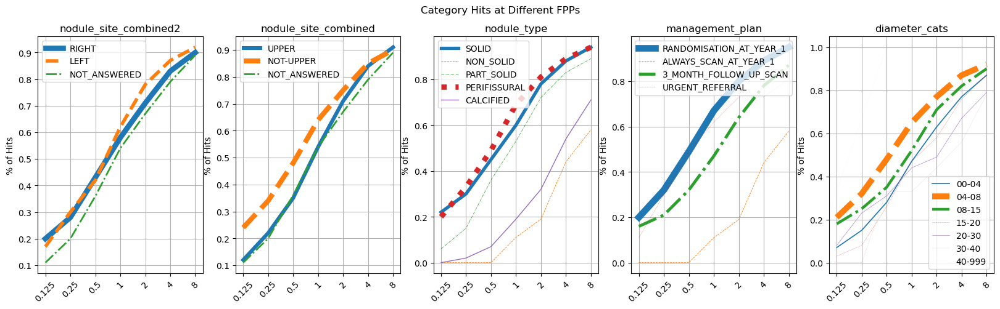

In [43]:

fig, ax = plt.subplots(1, 5, figsize=(20, 5))

nodule_characteristics = {
    'nodule_site_combined2': ['RIGHT', 'LEFT', 'NOT_ANSWERED'],
    'nodule_site_combined': ['UPPER','NOT-UPPER', 'NOT_ANSWERED'],
    'nodule_type': ['SOLID', 'NON_SOLID', 'PART_SOLID', 'PERIFISSURAL', 'CALCIFIED'],
    'management_plan': ['RANDOMISATION_AT_YEAR_1','ALWAYS_SCAN_AT_YEAR_1', '3_MONTH_FOLLOW_UP_SCAN', 'URGENT_REFERRAL'],
    'diameter_cats': diameter_lbs,
}

for ivx, (var, order) in enumerate(nodule_characteristics.items()):
    annotations = pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_metadata.csv')
    # annotations = annotations[annotations['management_plan'] != 'RANDOMISATION_AT_YEAR_1']

    total_vc = annotations[var].value_counts().sort_index().rename('Total Annotations')

    operating_points = ['0.125', '0.25', '0.5', '1', '2', '4', '8']

    results = []

    for idx, metadata in enumerate(missed_metadata):
        results.append(
            pd.crosstab(
                metadata[var], 
                metadata['miss'],
                normalize='index'
            )[False]
            .rename(f'{operating_points[idx]}')
            .reindex(order)
            
        )

    df = pd.concat(results, axis=1).fillna(0).round(2).merge(total_vc.to_frame(), left_index=True, right_index=True)

    display(df.T)


    line_styles = ['-', '--', '-.', ':', '-', '--', '-.']
    weights = df.pop('Total Annotations')

    for isx, column in enumerate(df.T):    
            ax[ivx].plot(df.T[column], label=column, linestyle=line_styles[isx], linewidth=weights[isx]/100)
    
    ax[ivx].set_xticklabels(labels=df.columns, rotation=45)
    ax[ivx].set_title(var)
    ax[ivx].legend()
    ax[ivx].set_ylabel('% of Hits')
    ax[ivx].grid(visible=True, which='both')

plt.suptitle('Category Hits at Different FPPs')
plt.show()

,FEMALE,MALE,Total
"(CALCIFIED, 3_MONTH_FOLLOW_UP_SCAN)",65 (11.8%),32 (4.8%),97 (8.0%)
"(NON_SOLID, ALWAYS_SCAN_AT_YEAR_1)",23 (4.2%),39 (5.9%),62 (5.1%)
"(PART_SOLID, 3_MONTH_FOLLOW_UP_SCAN)",33 (6.0%),20 (3.0%),53 (4.4%)
"(PERIFISSURAL, RANDOMISATION_AT_YEAR_1)",258 (46.7%),364 (54.7%),622 (51.1%)
"(SOLID, 3_MONTH_FOLLOW_UP_SCAN)",79 (14.3%),119 (17.9%),198 (16.3%)
"(SOLID, RANDOMISATION_AT_YEAR_1)",78 (14.1%),71 (10.7%),149 (12.2%)
"(SOLID, URGENT_REFERRAL)",16 (2.9%),21 (3.2%),37 (3.0%)
Total,552,666,1218


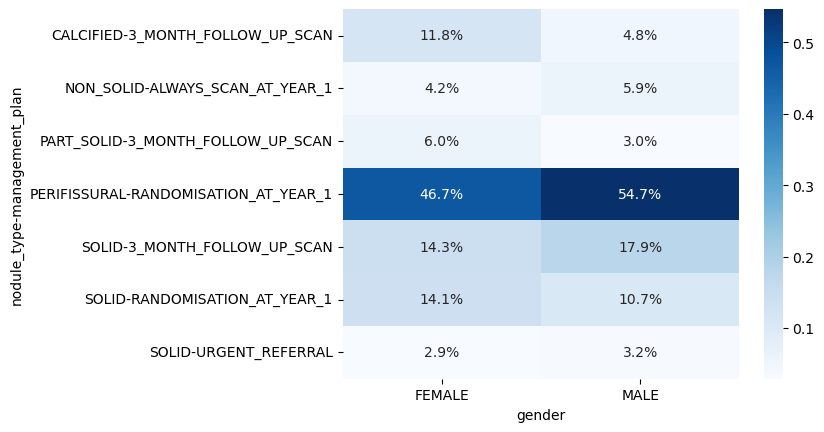

In [44]:
# Check what nodules have been missed by gender


missed_metadata_at_2fpps = missed_metadata[4]

def crosstab_with_percentages(rows, columns, x_order=None, y_order=None, table=False, heatmap=False):
    # Create the crosstab with absolutes
    cols = [c.astype(str) for c in columns]
    rows = [r.astype(str) for r in rows]

    xabs = pd.crosstab(rows, cols).fillna(0)
    xperc = pd.crosstab(rows, cols, normalize='columns').fillna(0)

    if x_order:
        xabs = xabs.reindex(x_order, axis=1)
        xperc = xperc.reindex(x_order, axis=1)

    if y_order:
        xabs = xabs.reindex(y_order)
        xperc = xperc.reindex(y_order)

    combined_data = {}

    for (adx, rabs), (pdx, rperc) in zip(xabs.iterrows(), xperc.iterrows()):

        row_data = {}
        row_total = 0

        for col in xabs.columns:
            row_data[col] = f"{rabs[col]} ({rperc[col]:.1%})"
            row_total += rabs[col]

        row_data['Total'] = f'{row_total} ({row_total / xabs.sum().sum():.1%})'
        combined_data[adx] = row_data

    row_data = {}
    row_total = 0
    for col in xabs.columns:
        row_data[col] = f'{sum(xabs[col])}'
        row_total += xabs[col].sum()

    row_data['Total'] = row_total
    combined_data['Total'] = row_data

    if table:
        display(pd.DataFrame.from_dict(combined_data).T)
        
    
    if heatmap:
        sns.heatmap(xperc, annot=True, fmt=".1%", cmap='Blues')
        plt.show()

    return xperc, pd.DataFrame.from_dict(combined_data)

_ = crosstab_with_percentages(
    [missed_metadata_at_2fpps['nodule_type'], missed_metadata_at_2fpps['management_plan']],
    [missed_metadata_at_2fpps['gender']],
    table=True,
    heatmap=True)

In [45]:
scans = pd.read_csv(f'{workspace_path}/metadata/summit/{flavour}/test_scans.csv')
predictions = pd.read_csv(detection_predictions_path)
annotations = pd.read_csv(f'{workspace_path}/models/detection/result/trained_summit/summit/{flavour}/annotations.csv')

false_positives_fpps = false_positive_analysis(
    thresholds=thresholds,    
    predictions=predictions,
    annotations=annotations
)

predictions: 299 at threshold: 0.99755859375
distance false positives: 86 at threshold: 0.99755859375
predictions: 517 at threshold: 0.99609375
distance false positives: 186 at threshold: 0.99609375
predictions: 924 at threshold: 0.99267578125
distance false positives: 422 at threshold: 0.99267578125
predictions: 1593 at threshold: 0.9833984375
distance false positives: 882 at threshold: 0.9833984375
predictions: 2671 at threshold: 0.953125
distance false positives: 1787 at threshold: 0.953125
predictions: 4616 at threshold: 0.84423828125
distance false positives: 3583 at threshold: 0.84423828125
predictions: 8369 at threshold: 0.495361328125
distance false positives: 7185 at threshold: 0.495361328125


#### Examples of False Positives

summit-9838-nmx_Y0_BASELINE_A already exists
summit-9838-nmx_Y0_BASELINE_A - 186 152 196 6.328125
False Positive: True
IoU False Positive: nan


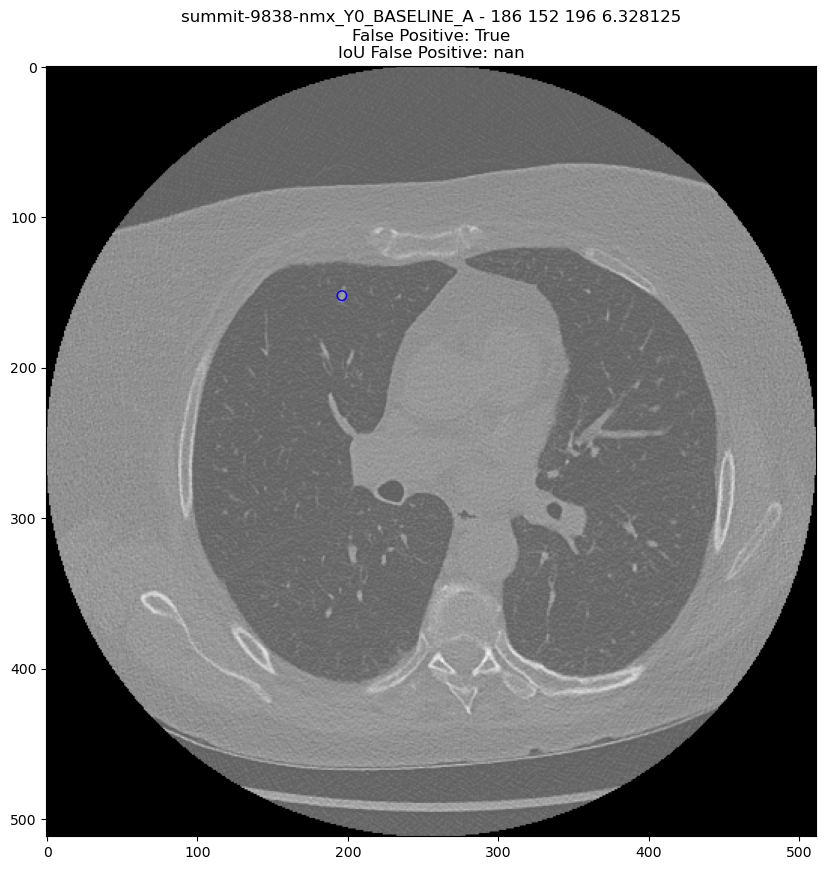

summit-8946-qqw_Y0_BASELINE_A already exists
summit-8946-qqw_Y0_BASELINE_A - 207 380 346 7.1875
False Positive: True
IoU False Positive: 0.0


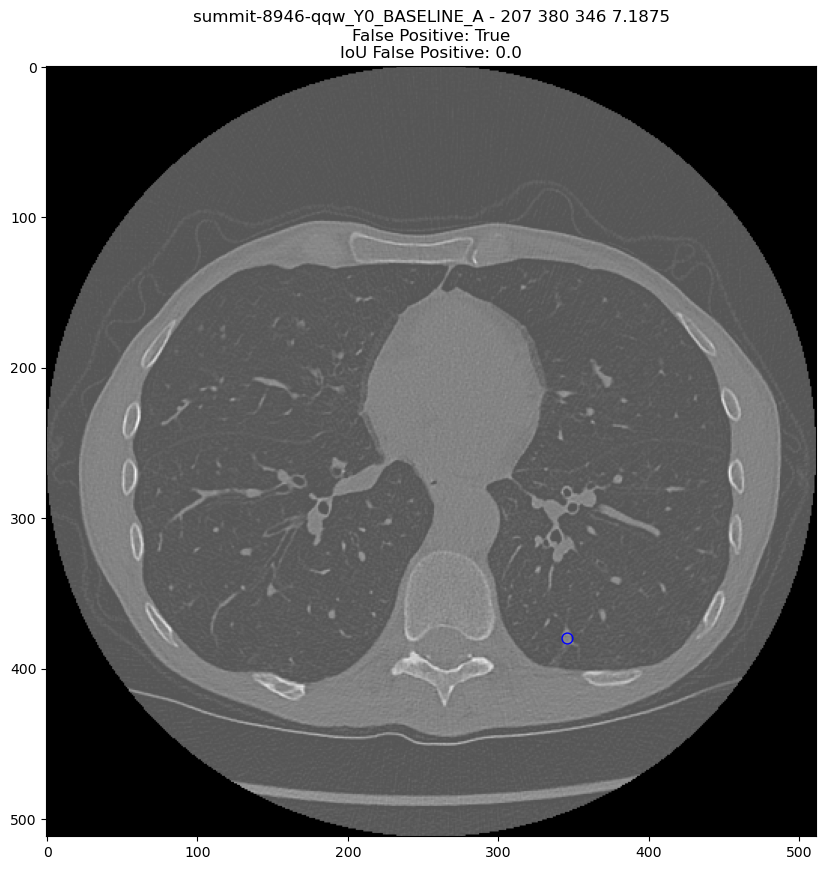

summit-9825-vkc_Y0_BASELINE_A already exists
summit-9825-vkc_Y0_BASELINE_A - 131 235 463 7.55859375
False Positive: True
IoU False Positive: 0.0


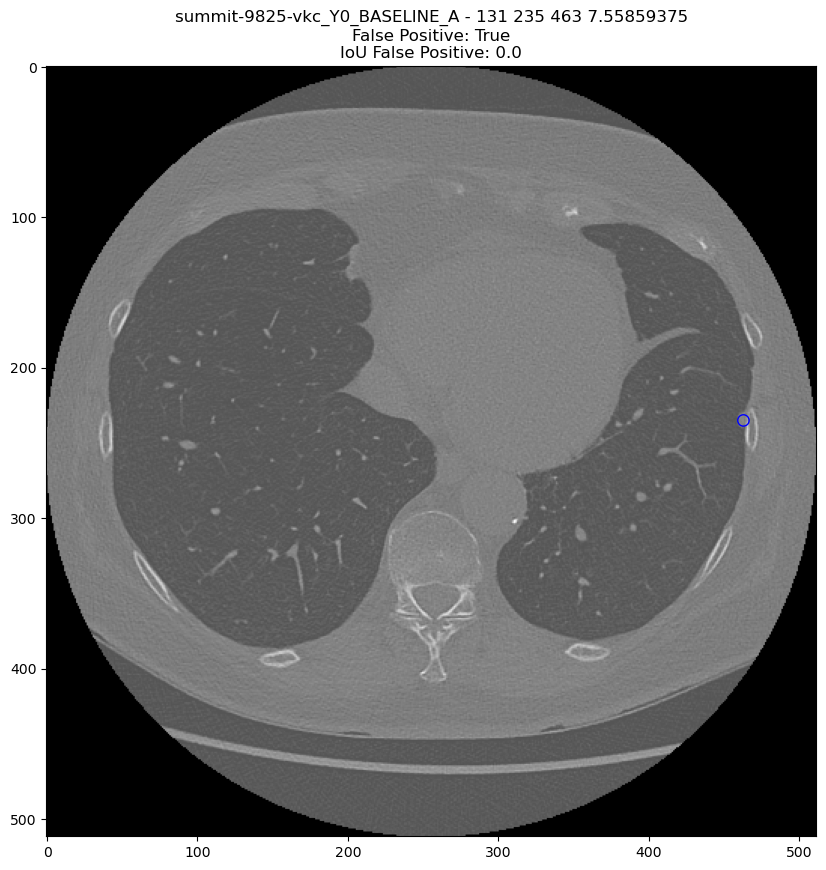

summit-9325-esc_Y0_BASELINE_A already exists
summit-9325-esc_Y0_BASELINE_A - 418 238 392 7.55859375
False Positive: True
IoU False Positive: 0.0


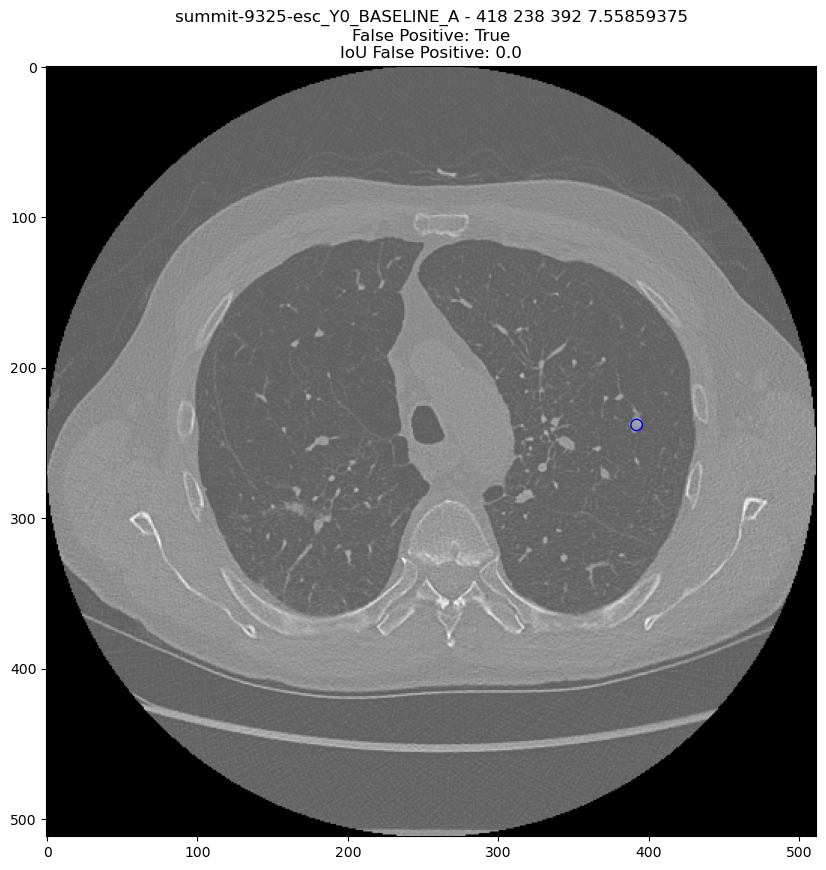

summit-9669-uej_Y0_BASELINE_A already exists
summit-9669-uej_Y0_BASELINE_A - 255 327 401 7.65625
False Positive: True
IoU False Positive: 0.0


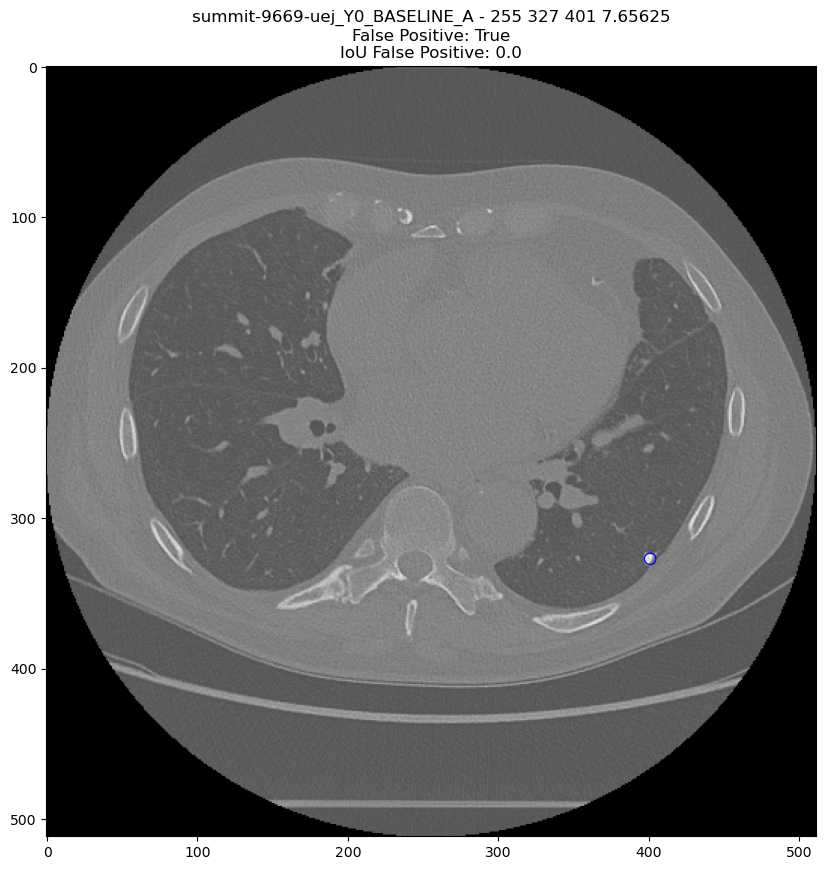

summit-8769-uas_Y0_BASELINE_A already exists
summit-8769-uas_Y0_BASELINE_A - 350 388 362 6.50390625
False Positive: True
IoU False Positive: nan


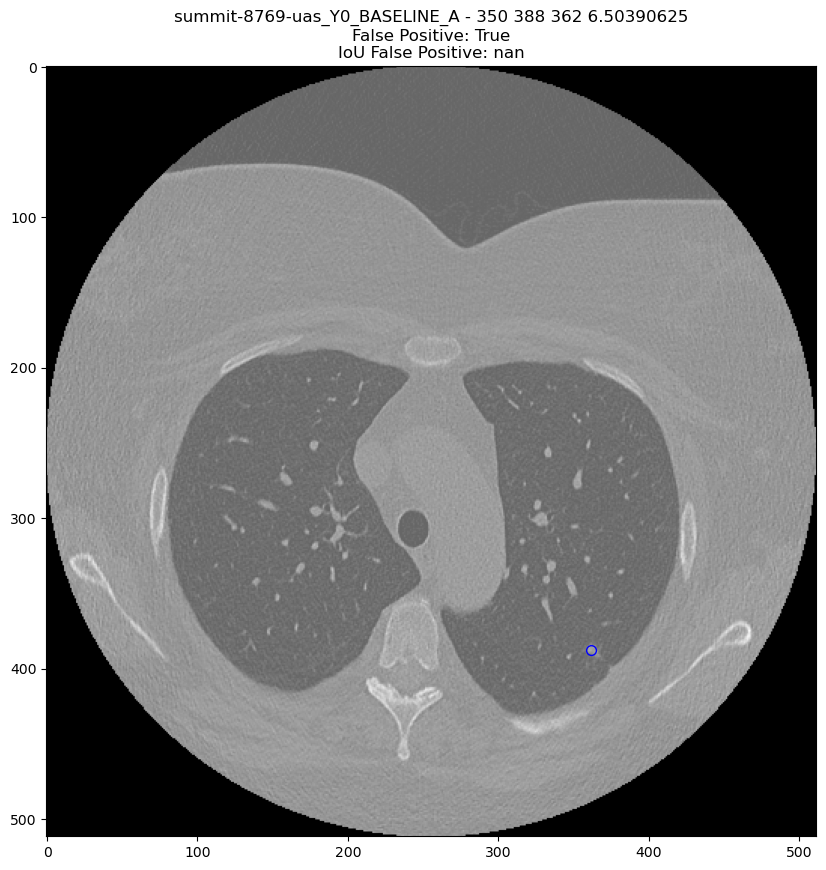

summit-9434-xbh_Y0_BASELINE_A already exists
summit-9434-xbh_Y0_BASELINE_A - 293 314 137 3.90625
False Positive: True
IoU False Positive: nan


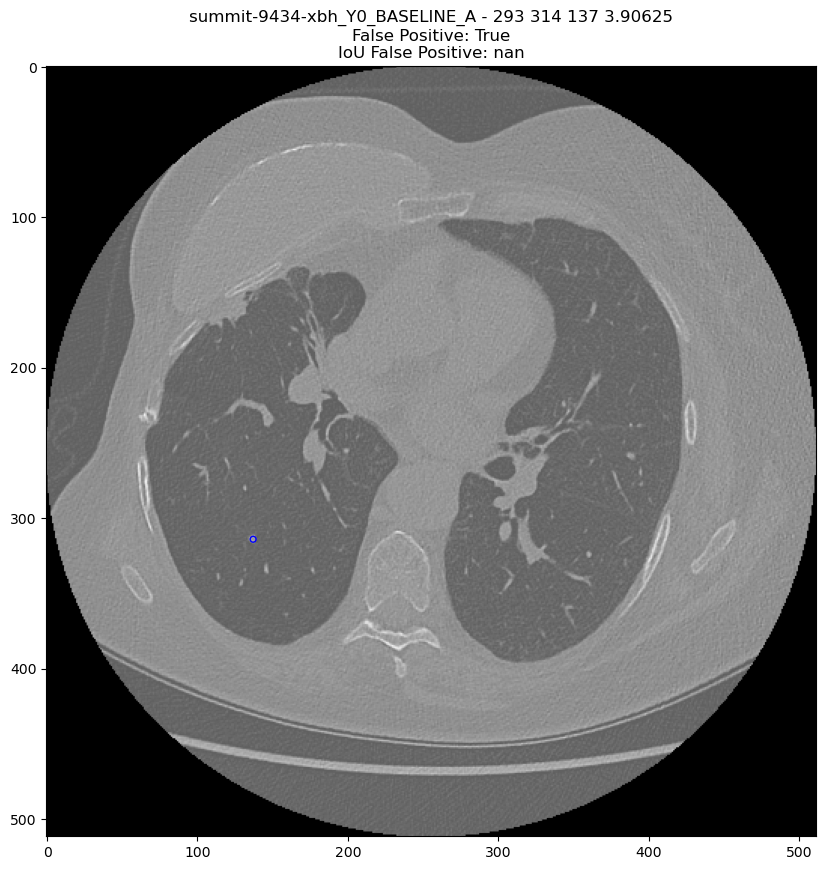

summit-9433-zmd_Y0_BASELINE_A already exists
summit-9433-zmd_Y0_BASELINE_A - 217 166 383 4.5703125
False Positive: True
IoU False Positive: 0.0


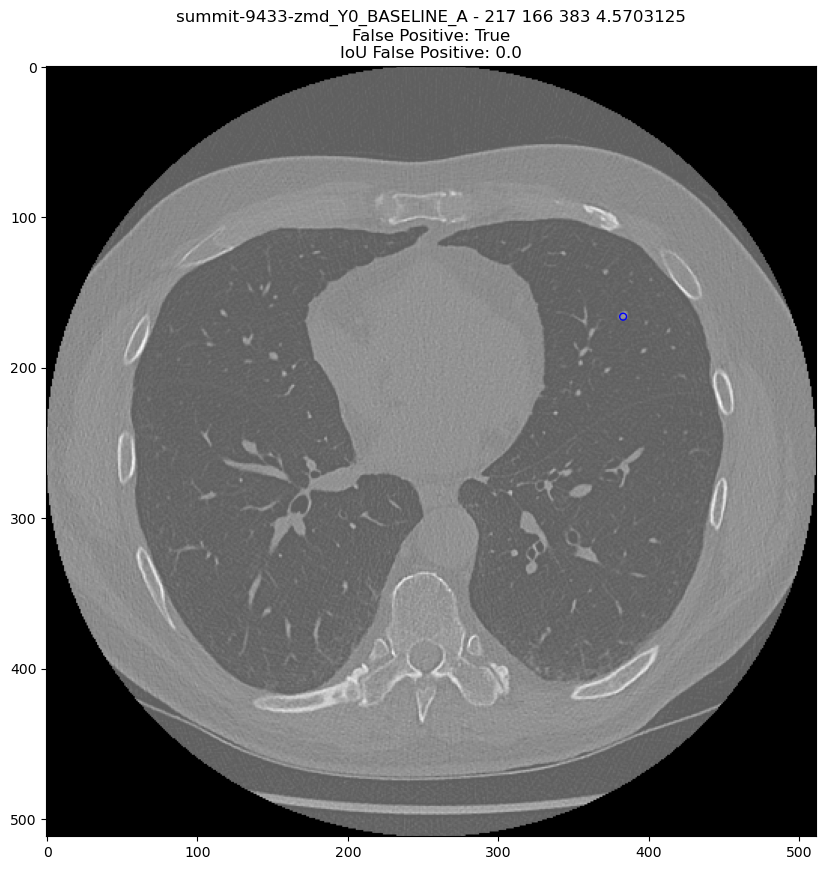

summit-9354-uug_Y0_BASELINE_A already exists
summit-9354-uug_Y0_BASELINE_A - 193 354 400 4.833984375
False Positive: True
IoU False Positive: nan


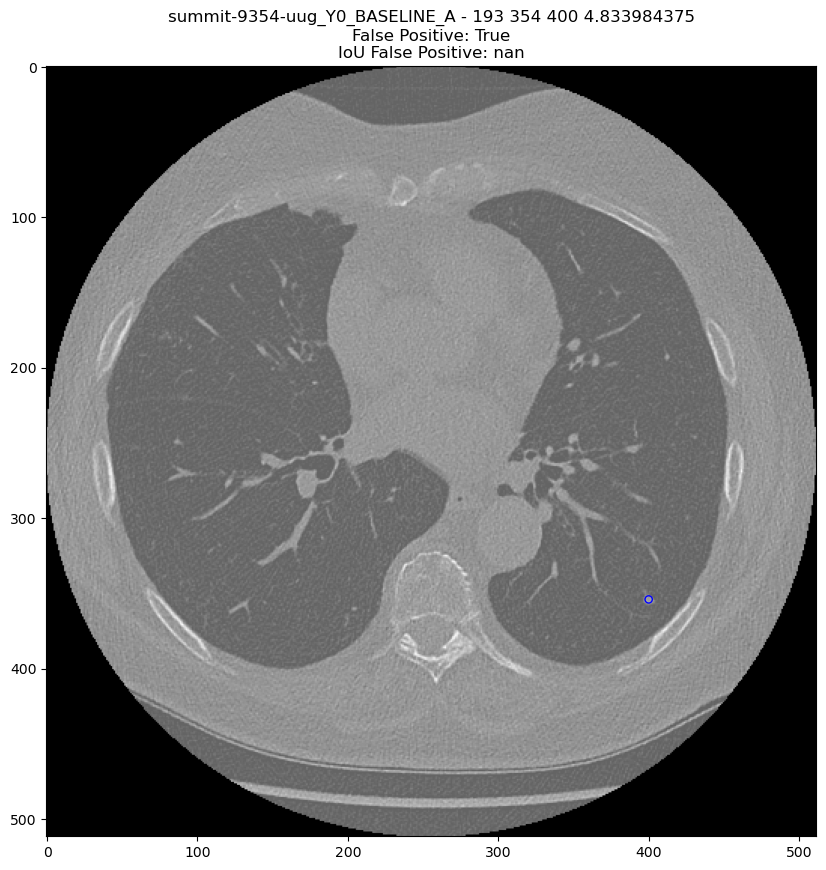

summit-9376-vnz_Y0_BASELINE_A already exists
summit-9376-vnz_Y0_BASELINE_A - 168 240 434 4.39453125
False Positive: True
IoU False Positive: 0.0


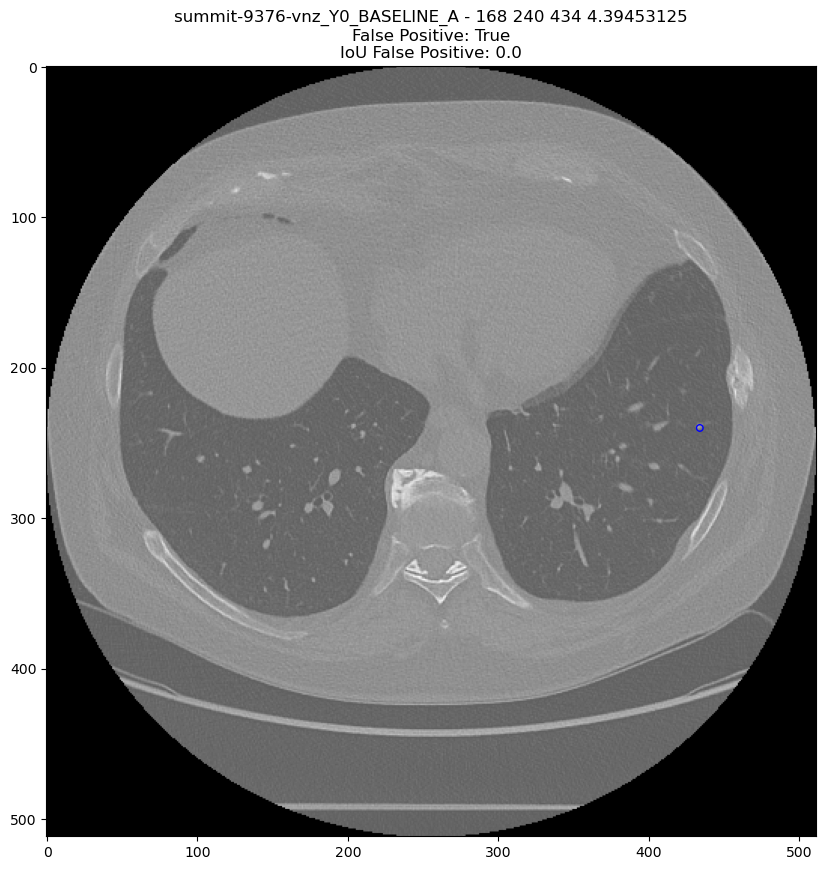

summit-9389-jky_Y0_BASELINE_A already exists
summit-9389-jky_Y0_BASELINE_A - 153 292 424 9.31640625
False Positive: True
IoU False Positive: nan


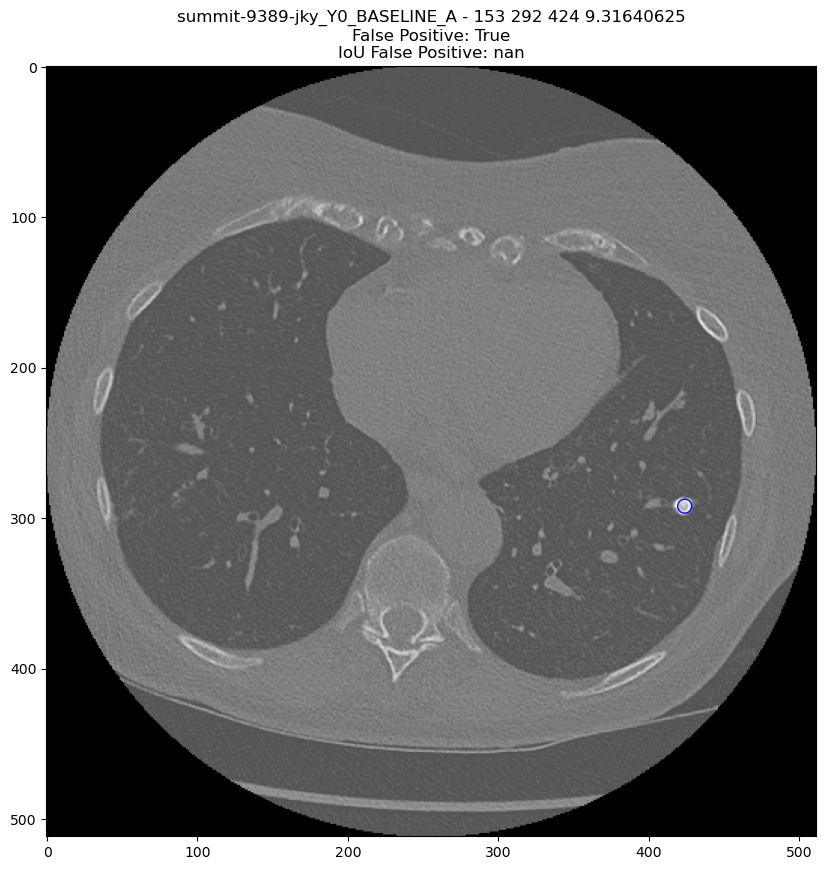

summit-8492-mxn_Y0_BASELINE_A already exists
summit-8492-mxn_Y0_BASELINE_A - 275 344 290 7.734375
False Positive: True
IoU False Positive: 0.0


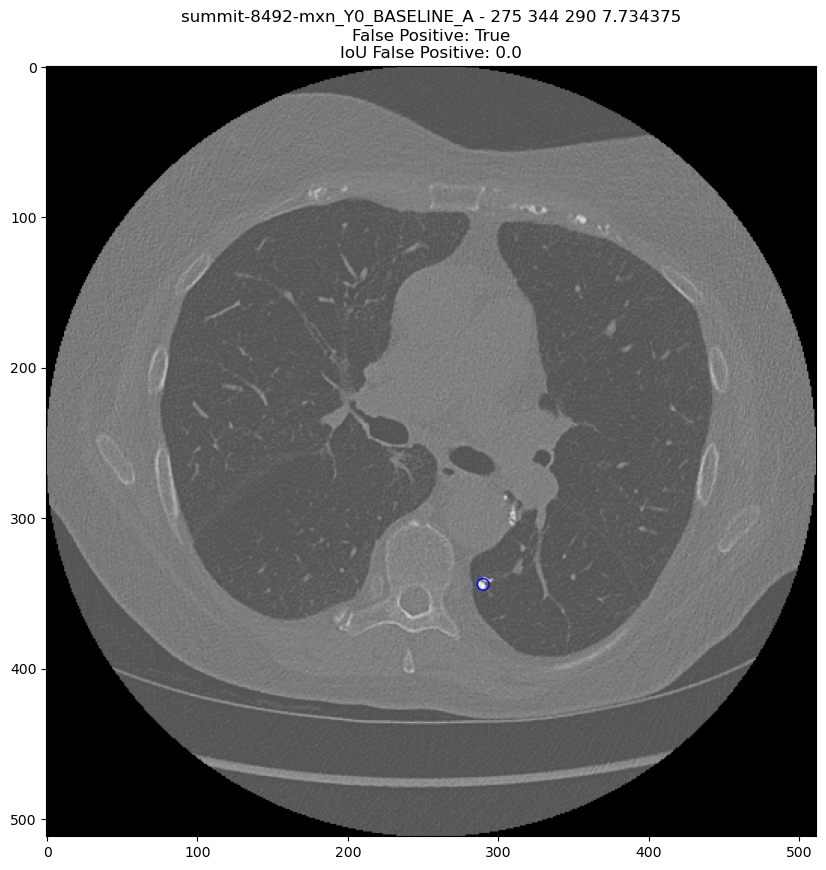

In [46]:
df = false_positives_fpps['0.125']

cnt = 0
for idx, row in df[df.distance_false_positive].sort_values(by='threshold', ascending=False).iterrows():
    scan_id = row['name']
    study_id = scan_id.split('_')[0]
    x = row['row']
    y = row['col']
    z = row['index']
    diameter = row['diameter']
    

    copy_scan_from_cluster(scan_id)
    
    scan = SummitScan.load_scan(f'{workspace_path}/data/summit/scans/{study_id}/{scan_id}.mhd')
    irc = xyz2irc([x, y, z], scan.origin, scan.voxel_size, scan.orientation)


    show_mhd_candidate_location(scan_id, scan.image, irc.row, irc.col, irc.index, diameter, row.distance_false_positive, row.iou_false_positive)
    cnt+=1
    if cnt == 12:
        break